<a href="https://colab.research.google.com/github/Ehsan-Roohi/DSMC_Python/blob/main/DSMC_Expansion_26_June.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

--- DSMC Simulation of 1D Gas Expansion (Higher Particle Count) ---
Estimated (sigma*vr)_max for NTC: 2.85e-16 m^3/s
Initializing 40000 particles in the left half of the domain...

Starting main simulation loop...
Sampling at Step: 1/80 (Time: 0.005 ns)...
Sampling at Step: 20/80 (Time: 0.100 ns)...
Sampling at Step: 40/80 (Time: 0.200 ns)...
Sampling at Step: 60/80 (Time: 0.300 ns)...
Sampling at Step: 80/80 (Time: 0.400 ns)...

Simulation finished in 2.81 seconds.



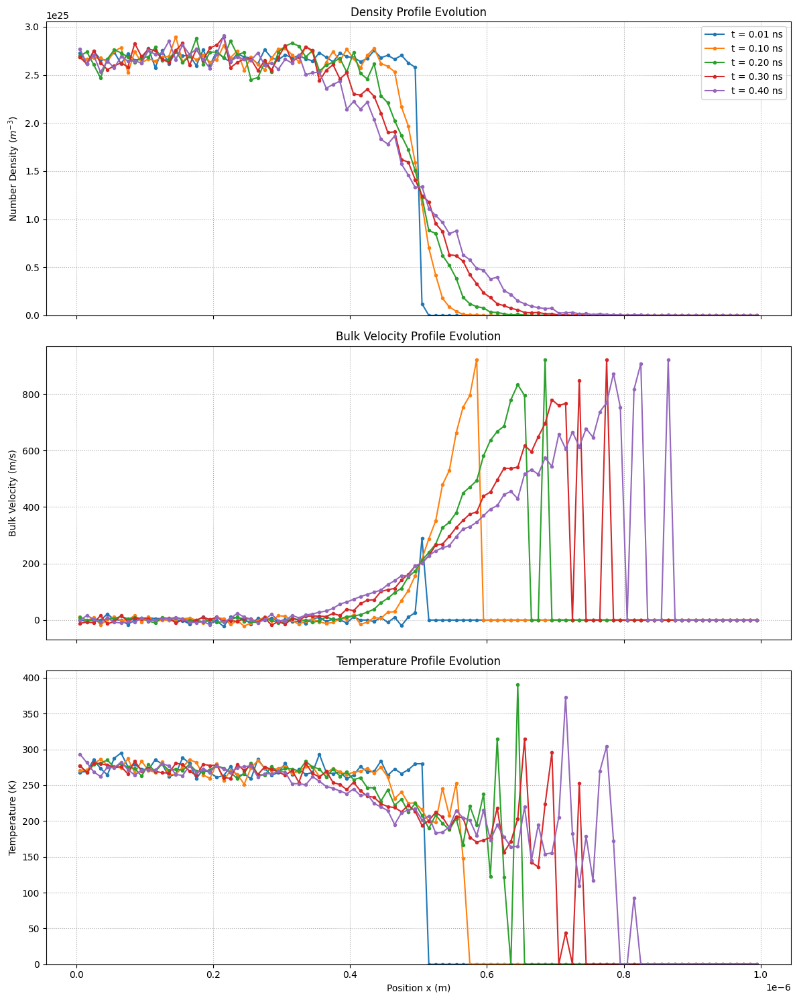

In [ ]:
# -*- coding: utf-8 -*-
# --- OPTIMIZED DSMC CODE - MODIFIED FOR 1D GAS EXPANSION PROBLEM (HIGHER PARTICLE COUNT) ---

import numpy as np
import matplotlib.pyplot as plt
import scipy.special
import numba
import time

# --- Constants and Parameters ---
# Argon (Ar) properties
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23

# VHS model parameters for Argon
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

# --- SIMULATION PARAMETERS ---
LX = 1.0e-6  # Total length of the domain
RHO_INIT = 1.78 # Initial density in the gas region
T_INIT = 273.0 # Initial temperature of the gas

NUM_CELLS_X = 100 # Increased cells for better spatial resolution

# --- *** مهم: افزایش تعداد ذرات برای کاهش نوسانات *** ---
# مقدار این پارامتر برای کاهش نویز آماری از 400 به 800 افزایش یافته است.
# این کار زمان شبیه‌سازی را افزایش می‌دهد اما نتایج را هموارتر می‌کند.
PARTICLES_PER_CELL_INIT = 800
TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT

# Derived parameters
N_DENSITY_REAL = RHO_INIT / MASS_AR
# Note: Volume is conceptual for 1D space, assuming a cross-section of LX*LX
CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

# Simulation time-stepping
DT = 5.0e-12
TOTAL_TIME = 0.4e-9 # Shorter time to observe the expansion front
NUM_STEPS = int(TOTAL_TIME / DT)
# Sample at 5 key time points (including initial and final)
SAMPLING_INTERVAL = int(NUM_STEPS / 4)

NTC_VR_MAX_SPEED_MULTIPLIER = 5.0

# --- **تابع مقداردهی اولیه برای انبساط گاز** ---
def initialize_gas_expansion():
    """
    Initializes particles only in the left half of the domain.
    """
    particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
    cell_width = LX / NUM_CELLS_X
    num_occupied_cells = NUM_CELLS_X // 2

    print(f"Initializing {TOTAL_PARTICLES_SIM} particles in the left half of the domain...")

    # Vectorized position initialization in the left half
    for i in range(num_occupied_cells):
        start_idx = i * PARTICLES_PER_CELL_INIT
        end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width

    # Initialize velocities from Maxwell-Boltzmann distribution at T_INIT
    v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))

    # Ensure zero bulk velocity initially
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)

    return particles

# --- DSMC Core Functions (No changes needed) ---
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    # Pre-calculated Gamma(2.5 - omega_vhs) for omega_vhs = 0.81 is approx 1.04533
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return

    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue

        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)

        if vr_mag < 1e-9: continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            # Isotropic scattering
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()

            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])

            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- **تحلیل و رسم پروفایل‌های مکانی** ---
def analyze_and_plot_spatial_profiles(results, cell_centers):
    """Plots density, velocity, and temperature profiles at different time steps."""
    fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)

    times = sorted(results.keys())

    for t in times:
        data = results[t]
        axes[0].plot(cell_centers, data['density'], '.-', label=f't = {t*1e9:.2f} ns')
        axes[1].plot(cell_centers, data['velocity'], '.-', label=f't = {t*1e9:.2f} ns')
        axes[2].plot(cell_centers, data['temperature'], '.-', label=f't = {t*1e9:.2f} ns')

    axes[0].set_ylabel('Number Density ($m^{-3}$)')
    axes[0].set_title('Density Profile Evolution')
    axes[0].grid(True, linestyle=':')
    axes[0].legend()
    axes[0].set_ylim(bottom=0)

    axes[1].set_ylabel('Bulk Velocity (m/s)')
    axes[1].set_title('Bulk Velocity Profile Evolution')
    axes[1].grid(True, linestyle=':')

    axes[2].set_ylabel('Temperature (K)')
    axes[2].set_title('Temperature Profile Evolution')
    axes[2].grid(True, linestyle=':')
    axes[2].set_ylim(bottom=0)

    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout()
    plt.savefig("dsmc_expansion_profiles_smoother.png", format='png', dpi=300)
    plt.show()

# --- Main Simulation ---
if __name__ == "__main__":
    print("--- DSMC Simulation of 1D Gas Expansion (Higher Particle Count) ---")

    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    print(f"Estimated (sigma*vr)_max for NTC: {SIGMA_VR_MAX_GLOBAL:.2e} m^3/s")

    particles = initialize_gas_expansion()

    results_history = {}
    cell_width = LX / NUM_CELLS_X
    cell_centers = (np.arange(NUM_CELLS_X) + 0.5) * cell_width

    start_time = time.time()
    print("\nStarting main simulation loop...")

    for step in range(1, NUM_STEPS + 1):
        # 1. Move particles
        particles[:, 0] += particles[:, 1] * DT

        # 2. Apply Boundary Conditions (Specular Reflection)
        hit_left = particles[:, 0] < 0
        particles[hit_left, 1] *= -1
        particles[hit_left, 0] *= -1

        hit_right = particles[:, 0] > LX
        particles[hit_right, 1] *= -1
        particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        # 3. Sort particles and perform collisions
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]
            end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        # 4. Spatially-resolved sampling at specified intervals
        if step == 1 or step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            print(f"Sampling at Step: {step}/{NUM_STEPS} (Time: {step * DT * 1e9:.3f} ns)...")
            density_profile = np.zeros(NUM_CELLS_X)
            velocity_profile = np.zeros(NUM_CELLS_X)
            temp_profile = np.zeros(NUM_CELLS_X)

            for i in range(NUM_CELLS_X):
                start = cell_start_indices[i]
                end = start + cell_counts[i]

                indices_in_cell_i = sorted_particle_indices[start:end]
                num_in_cell = len(indices_in_cell_i)

                if num_in_cell > 0:
                    density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
                    cell_velocities = particles[indices_in_cell_i, 1:4]
                    mean_vel_cell = np.mean(cell_velocities, axis=0)
                    velocity_profile[i] = mean_vel_cell[0]

                    if num_in_cell > 1:
                        thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                        temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
                    else:
                        temp_profile[i] = 0

            results_history[step * DT] = {
                'density': density_profile,
                'velocity': velocity_profile,
                'temperature': temp_profile
            }

    end_time = time.time()
    print(f"\nSimulation finished in {end_time - start_time:.2f} seconds.\n")

    analyze_and_plot_spatial_profiles(results_history, cell_centers)

شروع اجرای گروهی شبیه‌سازی به تعداد 20 بار...
--- در حال اجرای شبیه‌سازی شماره 1/20 ---
--- در حال اجرای شبیه‌سازی شماره 2/20 ---
--- در حال اجرای شبیه‌سازی شماره 3/20 ---
--- در حال اجرای شبیه‌سازی شماره 4/20 ---
--- در حال اجرای شبیه‌سازی شماره 5/20 ---
--- در حال اجرای شبیه‌سازی شماره 6/20 ---
--- در حال اجرای شبیه‌سازی شماره 7/20 ---
--- در حال اجرای شبیه‌سازی شماره 8/20 ---
--- در حال اجرای شبیه‌سازی شماره 9/20 ---
--- در حال اجرای شبیه‌سازی شماره 10/20 ---
--- در حال اجرای شبیه‌سازی شماره 11/20 ---
--- در حال اجرای شبیه‌سازی شماره 12/20 ---
--- در حال اجرای شبیه‌سازی شماره 13/20 ---
--- در حال اجرای شبیه‌سازی شماره 14/20 ---
--- در حال اجرای شبیه‌سازی شماره 15/20 ---
--- در حال اجرای شبیه‌سازی شماره 16/20 ---
--- در حال اجرای شبیه‌سازی شماره 17/20 ---
--- در حال اجرای شبیه‌سازی شماره 18/20 ---
--- در حال اجرای شبیه‌سازی شماره 19/20 ---
--- در حال اجرای شبیه‌سازی شماره 20/20 ---

اجرای گروهی شبیه‌سازی در 3.73 ثانیه به پایان رسید.
در حال میانگین‌گیری نتایج...


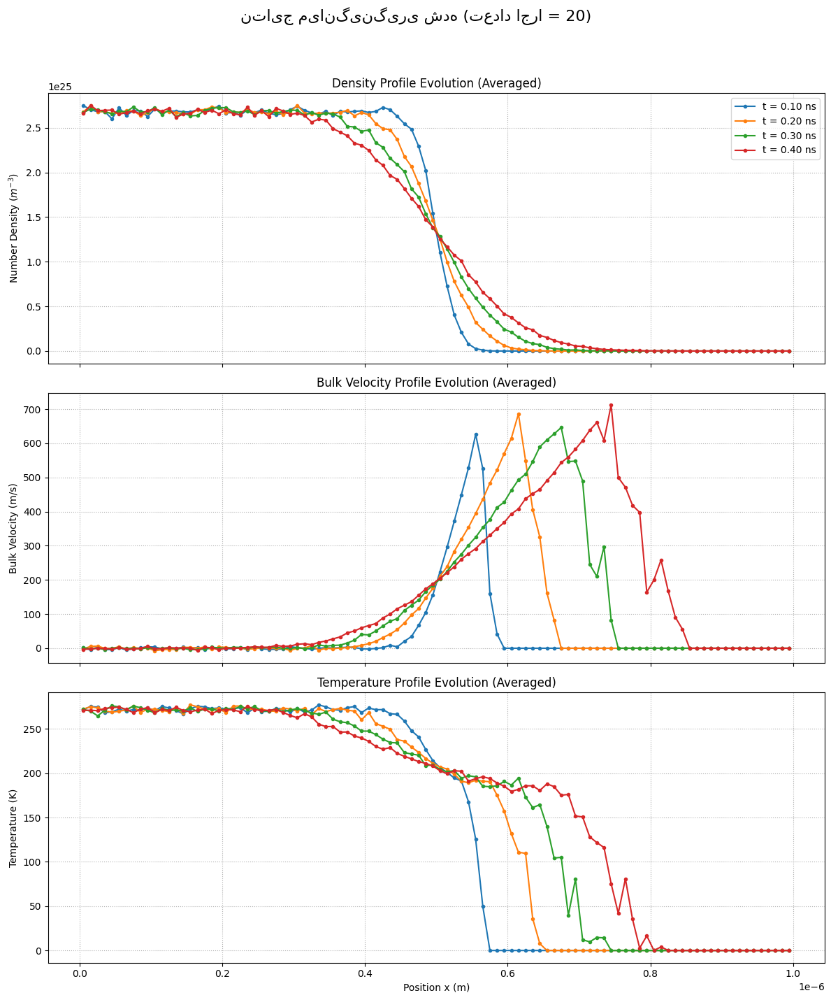

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - ENSEMBLE AVERAGING - SINGLE FILE VERSION ---
# این نسخه تمام کد را در یک فایل واحد ترکیب می‌کند تا به راحتی اجرا شود

import numpy as np
import matplotlib.pyplot as plt
import numba
import time

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز
# ===================================================================

# --- ثابت‌های فیزیکی و گاز آرگون ---
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

# --- توابع اصلی محاسباتی با بهینه‌سازی Numba ---
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return

    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue

        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)

        if vr_mag < 1e-9: continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع اصلی که یک دور کامل شبیه‌سازی را اجرا می‌کند ---
def run_dsmc_simulation(sim_params):
    """
    Runs a single instance of the DSMC simulation and returns the results history.
    """
    # استخراج پارامترهای شبیه‌سازی
    LX = sim_params['LX']
    RHO_INIT = sim_params['RHO_INIT']
    T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']
    PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']
    DT = sim_params['DT']

    # محاسبات پارامترهای وابسته
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT)
    SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    NTC_VR_MAX_SPEED_MULTIPLIER = 5.0

    # تعریف تابع مقداردهی اولیه در داخل این تابع
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT
            end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles

    # --- شروع شبیه‌سازی ---
    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    particles = initialize_gas_expansion()
    results_history = {}
    cell_width = LX / NUM_CELLS_X

    # --- حلقه اصلی زمان ---
    for step in range(1, NUM_STEPS + 1):
        # ۱. حرکت ذرات
        particles[:, 0] += particles[:, 1] * DT

        # ۲. اعمال شرایط مرزی
        hit_left = particles[:, 0] < 0
        particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX
        particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        # ۳. مرتب‌سازی و برخورد ذرات
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        # ۴. نمونه‌برداری در فواصل زمانی مشخص
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.zeros(NUM_CELLS_X); temp_profile = np.zeros(NUM_CELLS_X)
            for i in range(NUM_CELLS_X):
                start = cell_start_indices[i]; end = start + cell_counts[i]
                indices_in_cell_i = sorted_particle_indices[start:end]
                num_in_cell = len(indices_in_cell_i)
                if num_in_cell > 0:
                    density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
                    cell_velocities = particles[indices_in_cell_i, 1:4]
                    mean_vel_cell = np.mean(cell_velocities, axis=0)
                    velocity_profile[i] = mean_vel_cell[0]
                    if num_in_cell > 1:
                        thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                        temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
            results_history[step * DT] = {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    return results_history


# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    # --- پارامترهای اصلی شبیه‌سازی ---
    SIMULATION_PARAMS = {
        'LX': 1.0e-6,
        'RHO_INIT': 1.78,
        'T_INIT': 273.0,
        'NUM_CELLS_X': 100,
        'PARTICLES_PER_CELL_INIT': 400, # تعداد ذرات در هر اجرا
        'TOTAL_TIME': 0.4e-9,
        'DT': 5.0e-12,
    }

    # --- پارامترهای میانگین‌گیری ---
    # این عدد را برای نتایج هموارتر افزایش دهید (زمان اجرا بسیار طولانی‌تر خواهد شد)
    NUM_ENSEMBLE_RUNS = 20

    print(f"شروع اجرای گروهی شبیه‌سازی به تعداد {NUM_ENSEMBLE_RUNS} بار...")

    all_results = []
    start_time_total = time.time()

    for i in range(NUM_ENSEMBLE_RUNS):
        print(f"--- در حال اجرای شبیه‌سازی شماره {i+1}/{NUM_ENSEMBLE_RUNS} ---")
        # با تعیین یک هسته تصادفی جدید، هر اجرا مستقل از دیگری خواهد بود
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)

    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration:.2f} ثانیه به پایان رسید.")

    # --- فرآیند میانگین‌گیری نتایج ---
    print("در حال میانگین‌گیری نتایج...")
    averaged_results = {}

    sample_times = sorted(all_results[0].keys())

    for t in sample_times:
        sum_density = sum(run[t]['density'] for run in all_results)
        sum_velocity = sum(run[t]['velocity'] for run in all_results)
        sum_temperature = sum(run[t]['temperature'] for run in all_results)

        averaged_results[t] = {
            'density': sum_density / NUM_ENSEMBLE_RUNS,
            'velocity': sum_velocity / NUM_ENSEMBLE_RUNS,
            'temperature': sum_temperature / NUM_ENSEMBLE_RUNS,
        }

    # --- رسم نتایج نهایی و هموار شده ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
    fig.suptitle(f"نتایج میانگین‌گیری شده (تعداد اجرا = {NUM_ENSEMBLE_RUNS})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        axes[0].plot(cell_centers, data['density'], '.-', label=f't = {t*1e9:.2f} ns')
        axes[1].plot(cell_centers, data['velocity'], '.-', label=f't = {t*1e9:.2f} ns')
        axes[2].plot(cell_centers, data['temperature'], '.-', label=f't = {t*1e9:.2f} ns')

    axes[0].set_ylabel('Number Density ($m^{-3}$)')
    axes[0].set_title('Density Profile Evolution (Averaged)')
    axes[0].grid(True, linestyle=':'); axes[0].legend()

    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile Evolution (Averaged)'); axes[1].grid(True, linestyle=':')

    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile Evolution (Averaged)'); axes[2].grid(True, linestyle=':'); axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_ensemble_averaged_single_file.png", dpi=300)
    plt.show()

شروع اجرای گروهی شبیه‌سازی برای کیفیت بالا (تعداد اجرا: 100)
تعداد ذرات در هر اجرا: 50000
!!! هشدار: این فرآیند بسیار زمان‌بر خواهد بود !!!
--- اجرای شماره 1/100 به پایان رسید ---
--- اجرای شماره 2/100 به پایان رسید ---
--- اجرای شماره 3/100 به پایان رسید ---
--- اجرای شماره 4/100 به پایان رسید ---
--- اجرای شماره 5/100 به پایان رسید ---
--- اجرای شماره 6/100 به پایان رسید ---
--- اجرای شماره 7/100 به پایان رسید ---
--- اجرای شماره 8/100 به پایان رسید ---
--- اجرای شماره 9/100 به پایان رسید ---
--- اجرای شماره 10/100 به پایان رسید ---
--- اجرای شماره 11/100 به پایان رسید ---
--- اجرای شماره 12/100 به پایان رسید ---
--- اجرای شماره 13/100 به پایان رسید ---
--- اجرای شماره 14/100 به پایان رسید ---
--- اجرای شماره 15/100 به پایان رسید ---
--- اجرای شماره 16/100 به پایان رسید ---
--- اجرای شماره 17/100 به پایان رسید ---
--- اجرای شماره 18/100 به پایان رسید ---
--- اجرای شماره 19/100 به پایان رسید ---
--- اجرای شماره 20/100 به پایان رسید ---
--- اجرای شماره 21/100 به پایان رسید ---
--- اجرا

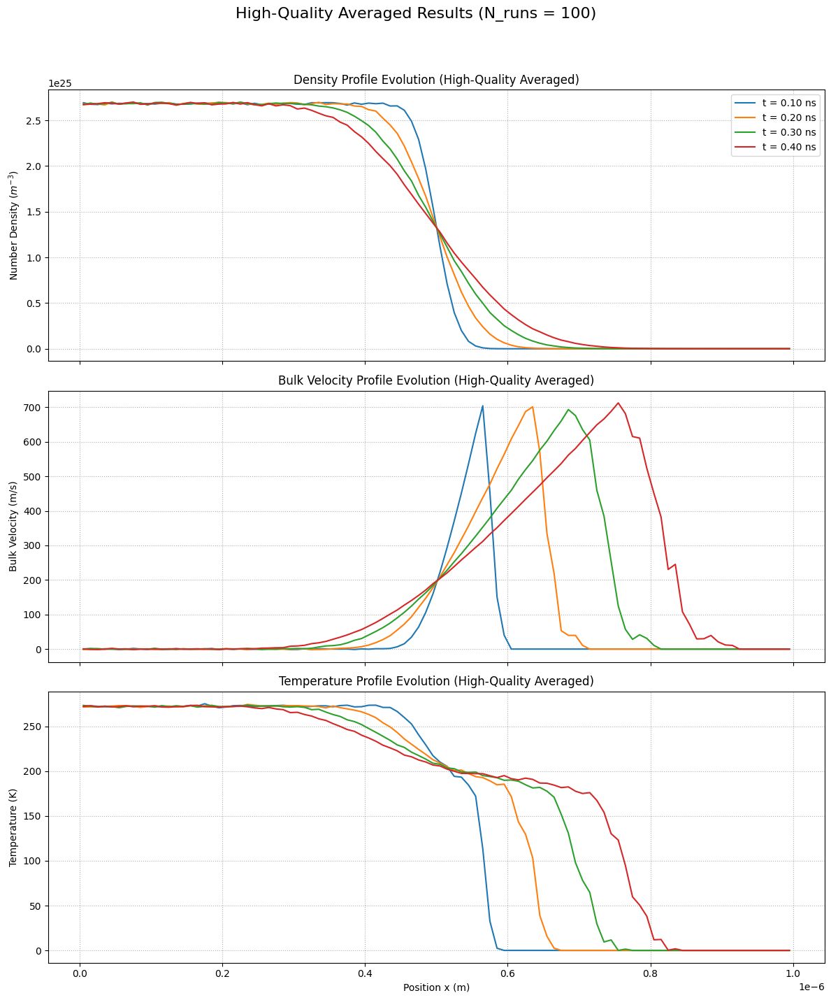

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - HIGH-QUALITY PUBLICATION-LEVEL RESULTS ---
# این نسخه برای تولید نتایج بسیار هموار با اجرای طولانی‌مدت تنظیم شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================

# --- ثابت‌های فیزیکی و گاز آرگون ---
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

# --- توابع اصلی محاسباتی با بهینه‌سازی Numba ---
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع اصلی که یک دور کامل شبیه‌سازی را اجرا می‌کند ---
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT; N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X; FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4); NTC_VR_MAX_SPEED_MULTIPLIER = 5.0
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4)); cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate; particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.zeros(NUM_CELLS_X); temp_profile = np.zeros(NUM_CELLS_X)
            for i in range(NUM_CELLS_X):
                start = cell_start_indices[i]; end = start + cell_counts[i]
                indices_in_cell_i = sorted_particle_indices[start:end]
                num_in_cell = len(indices_in_cell_i)
                if num_in_cell > 0:
                    density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
                    cell_velocities = particles[indices_in_cell_i, 1:4]
                    mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
                    if num_in_cell > 1:
                        thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                        temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
            results_history[step * DT] = {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    # --- پارامترهای شبیه‌سازی برای کیفیت بالا ---
    SIMULATION_PARAMS = {
        'LX': 1.0e-6,
        'RHO_INIT': 1.78,
        'T_INIT': 273.0,
        'NUM_CELLS_X': 100,
        # افزایش تعداد ذرات برای کاهش نویز اولیه در هر اجرا
        'PARTICLES_PER_CELL_INIT': 1000,
        'TOTAL_TIME': 0.4e-9,
        'DT': 5.0e-12,
    }

    # --- پارامترهای میانگین‌گیری برای کیفیت بالا ---
    # افزایش چشمگیر تعداد اجراها برای رسیدن به نتایج بسیار هموار
    # این عدد را می‌توانید بر اساس زمان و دقت مورد نیاز خود تغییر دهید
    NUM_ENSEMBLE_RUNS = 100

    print(f"شروع اجرای گروهی شبیه‌سازی برای کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS})")
    print(f"تعداد ذرات در هر اجرا: {SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT'] * SIMULATION_PARAMS['NUM_CELLS_X'] // 2}")
    print("!!! هشدار: این فرآیند بسیار زمان‌بر خواهد بود !!!")

    all_results = []
    start_time_total = time.time()

    for i in range(NUM_ENSEMBLE_RUNS):
        # استفاده از یک هسته تصادفی متفاوت برای هر اجرا
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        # نمایش پیشرفت کار
        print(f"--- اجرای شماره {i+1}/{NUM_ENSEMBLE_RUNS} به پایان رسید ---")


    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration/60:.2f} دقیقه به پایان رسید.")

    # --- فرآیند میانگین‌گیری نتایج ---
    print("در حال میانگین‌گیری نتایج نهایی...")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())

    for t in sample_times:
        sum_density = sum(run[t]['density'] for run in all_results)
        sum_velocity = sum(run[t]['velocity'] for run in all_results)
        sum_temperature = sum(run[t]['temperature'] for run in all_results)
        averaged_results[t] = {
            'density': sum_density / NUM_ENSEMBLE_RUNS,
            'velocity': sum_velocity / NUM_ENSEMBLE_RUNS,
            'temperature': sum_temperature / NUM_ENSEMBLE_RUNS,
        }

    # --- رسم نتایج نهایی و بسیار هموار شده ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
    fig.suptitle(f"High-Quality Averaged Results (N_runs = {NUM_ENSEMBLE_RUNS})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        # در رسم نهایی می‌توانیم از خط ممتد به جای نقاط استفاده کنیم تا هموارتر به نظر برسد
        axes[0].plot(cell_centers, data['density'], '-', label=f't = {t*1e9:.2f} ns')
        axes[1].plot(cell_centers, data['velocity'], '-', label=f't = {t*1e9:.2f} ns')
        axes[2].plot(cell_centers, data['temperature'], '-', label=f't = {t*1e9:.2f} ns')

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile Evolution (High-Quality Averaged)'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile Evolution (High-Quality Averaged)'); axes[1].grid(True, linestyle=':')
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile Evolution (High-Quality Averaged)'); axes[2].grid(True, linestyle=':'); axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_high_quality_averaged.png", dpi=300)
    plt.show()

شروع اجرای گروهی برای حداکثر کیفیت (تعداد اجرا: 250)
تعداد سلول‌ها: 200, تعداد ذرات در هر اجرا: 200000
!!! هشدار: این فرآیند بسیار سنگین و طولانی (احتمالاً چندین ساعت) خواهد بود !!!
--- اجرای شماره 1/250 به پایان رسید ---
--- اجرای شماره 2/250 به پایان رسید ---
--- اجرای شماره 3/250 به پایان رسید ---
--- اجرای شماره 4/250 به پایان رسید ---
--- اجرای شماره 5/250 به پایان رسید ---
--- اجرای شماره 6/250 به پایان رسید ---
--- اجرای شماره 7/250 به پایان رسید ---
--- اجرای شماره 8/250 به پایان رسید ---
--- اجرای شماره 9/250 به پایان رسید ---
--- اجرای شماره 10/250 به پایان رسید ---
--- اجرای شماره 11/250 به پایان رسید ---
--- اجرای شماره 12/250 به پایان رسید ---
--- اجرای شماره 13/250 به پایان رسید ---
--- اجرای شماره 14/250 به پایان رسید ---
--- اجرای شماره 15/250 به پایان رسید ---
--- اجرای شماره 16/250 به پایان رسید ---
--- اجرای شماره 17/250 به پایان رسید ---
--- اجرای شماره 18/250 به پایان رسید ---
--- اجرای شماره 19/250 به پایان رسید ---
--- اجرای شماره 20/250 به پایان رسید ---
--- اجر

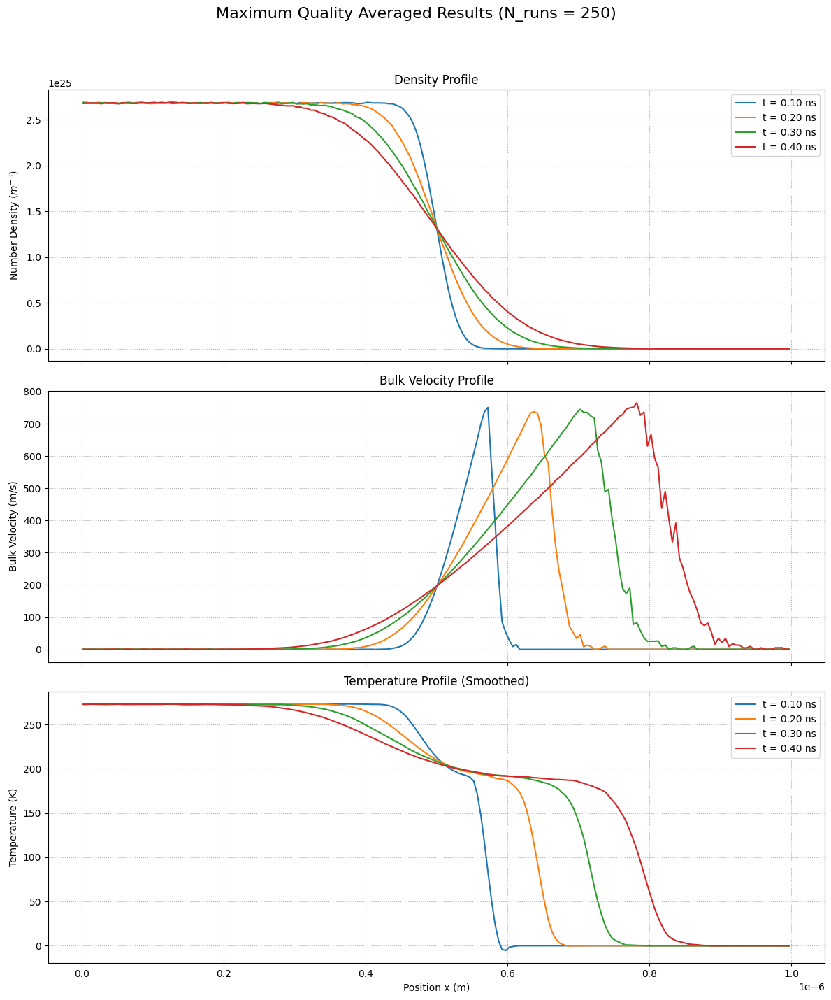

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - MAXIMUM QUALITY VERSION ---
# این نسخه برای تولید نتایج بسیار هموار با اجرای بسیار طولانی‌مدت و پردازش نهایی تنظیم شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
# کتابخانه scipy را برای استفاده از فیلتر هموارساز اضافه می‌کنیم
from scipy.signal import savgol_filter

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT; N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X; FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4); NTC_VR_MAX_SPEED_MULTIPLIER = 5.0
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4)); cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate; particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.zeros(NUM_CELLS_X); temp_profile = np.zeros(NUM_CELLS_X)
            for i in range(NUM_CELLS_X):
                start = cell_start_indices[i]; end = start + cell_counts[i]
                indices_in_cell_i = sorted_particle_indices[start:end]
                num_in_cell = len(indices_in_cell_i)
                if num_in_cell > 0:
                    density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
                    cell_velocities = particles[indices_in_cell_i, 1:4]
                    mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
                    if num_in_cell > 1:
                        thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                        temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
            results_history[step * DT] = {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    # --- پارامترهای شبیه‌سازی برای حداکثر کیفیت ---
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        # افزایش تعداد سلول‌ها برای دقت بالاتر در گرادیان‌ها
        'NUM_CELLS_X': 200,
        # افزایش بسیار زیاد تعداد ذرات
        'PARTICLES_PER_CELL_INIT': 2000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }

    # --- پارامترهای میانگین‌گیری برای حداکثر کیفیت ---
    # افزایش بسیار زیاد تعداد اجراها
    NUM_ENSEMBLE_RUNS = 250

    print(f"شروع اجرای گروهی برای حداکثر کیفیت (تعداد اجرا: {NUM_ENSEMBLE_RUNS})")
    total_particles = SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT'] * SIMULATION_PARAMS['NUM_CELLS_X'] // 2
    print(f"تعداد سلول‌ها: {SIMULATION_PARAMS['NUM_CELLS_X']}, تعداد ذرات در هر اجرا: {total_particles}")
    print("!!! هشدار: این فرآیند بسیار سنگین و طولانی (احتمالاً چندین ساعت) خواهد بود !!!")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای شماره {i+1}/{NUM_ENSEMBLE_RUNS} به پایان رسید ---")

    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration/3600:.2f} ساعت به پایان رسید.")

    print("در حال میانگین‌گیری نتایج نهایی..."); averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        sum_density = sum(run[t]['density'] for run in all_results)
        sum_velocity = sum(run[t]['velocity'] for run in all_results)
        sum_temperature = sum(run[t]['temperature'] for run in all_results)
        averaged_results[t] = {
            'density': sum_density / NUM_ENSEMBLE_RUNS,
            'velocity': sum_velocity / NUM_ENSEMBLE_RUNS,
            'temperature': sum_temperature / NUM_ENSEMBLE_RUNS,
        }

    # --- رسم نتایج نهایی با اعمال فیلتر هموارساز بر روی دما ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
    fig.suptitle(f"Maximum Quality Averaged Results (N_runs = {NUM_ENSEMBLE_RUNS})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        axes[0].plot(cell_centers, data['density'], '-', label=f't = {t*1e9:.2f} ns')
        axes[1].plot(cell_centers, data['velocity'], '-', label=f't = {t*1e9:.2f} ns')

        # --- اعمال فیلتر هموارساز Savitzky-Golay روی داده‌های دما ---
        temp_raw = data['temperature']
        # برای جلوگیری از خطا، اگر طول پنجره بزرگتر از داده است، آن را اجرا نمی‌کنیم
        if len(temp_raw) > 11:
             # window_length باید فرد باشد و polyorder از آن کوچکتر
            temp_smooth = savgol_filter(temp_raw, window_length=11, polyorder=2)
            axes[2].plot(cell_centers, temp_smooth, '-', label=f't = {t*1e9:.2f} ns')
        else: # اگر داده کم است، همان داده خام را رسم کن
            axes[2].plot(cell_centers, temp_raw, '-', label=f't = {t*1e9:.2f} ns')


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile'); axes[1].grid(True, linestyle=':')
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_max_quality_averaged.png", dpi=300)
    plt.show()

شروع اجرای گروهی برای حداکثر کیفیت (تعداد اجرا: 250)
تعداد سلول‌ها: 200, تعداد ذرات در هر اجرا: 200000
!!! هشدار: این فرآیند بسیار سنگین و طولانی (احتمالاً چندین ساعت) خواهد بود !!!
--- اجرای شماره 1/250 به پایان رسید ---
--- اجرای شماره 2/250 به پایان رسید ---
--- اجرای شماره 3/250 به پایان رسید ---
--- اجرای شماره 4/250 به پایان رسید ---
--- اجرای شماره 5/250 به پایان رسید ---
--- اجرای شماره 6/250 به پایان رسید ---
--- اجرای شماره 7/250 به پایان رسید ---
--- اجرای شماره 8/250 به پایان رسید ---
--- اجرای شماره 9/250 به پایان رسید ---
--- اجرای شماره 10/250 به پایان رسید ---
--- اجرای شماره 11/250 به پایان رسید ---
--- اجرای شماره 12/250 به پایان رسید ---
--- اجرای شماره 13/250 به پایان رسید ---
--- اجرای شماره 14/250 به پایان رسید ---
--- اجرای شماره 15/250 به پایان رسید ---
--- اجرای شماره 16/250 به پایان رسید ---
--- اجرای شماره 17/250 به پایان رسید ---
--- اجرای شماره 18/250 به پایان رسید ---
--- اجرای شماره 19/250 به پایان رسید ---
--- اجرای شماره 20/250 به پایان رسید ---
--- اجر

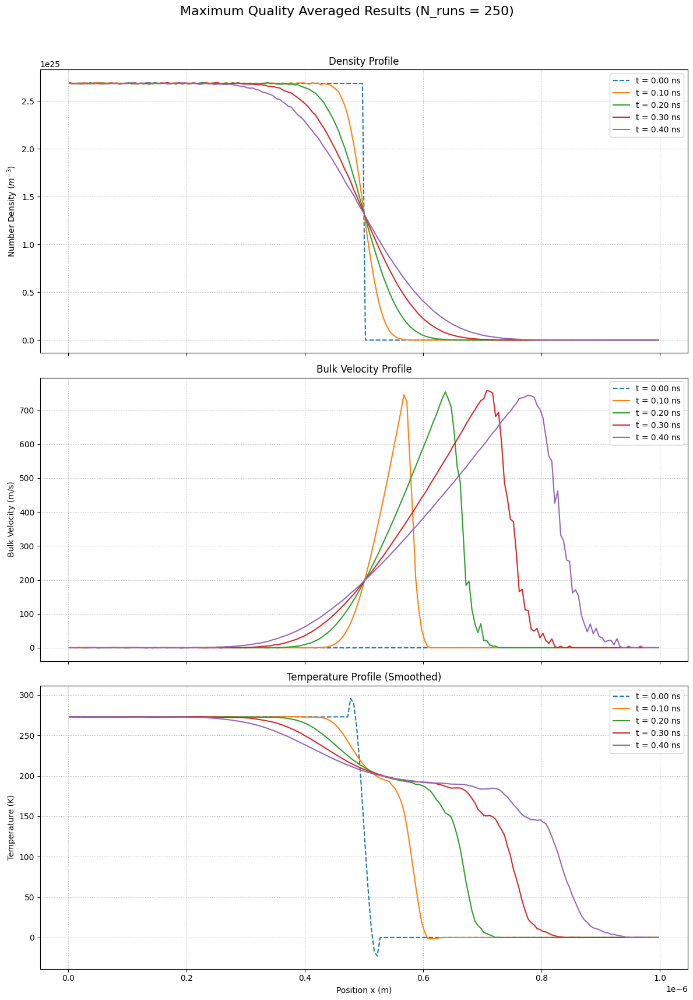

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - MAXIMUM QUALITY VERSION (with t=0 results) ---
# این نسخه برای تولید نتایج بسیار هموار با اجرای بسیار طولانی‌مدت و پردازش نهایی تنظیم شده است.
# تغییر کلیدی: نتایج در زمان صفر (t=0) نیز محاسبه و رسم می‌شوند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
# کتابخانه scipy را برای استفاده از فیلتر هموارساز اضافه می‌کنیم
from scipy.signal import savgol_filter

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9:
        return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    # مقدار گاما(2-امگا) برای آرگون با امگا=0.81 حدود 1.04533 است
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local:
            continue

        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]

        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9:
            continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)

        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])

            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()

            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])

            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']
    RHO_INIT = sim_params['RHO_INIT']
    T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']
    PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']
    DT = sim_params['DT']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT)
    SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    NTC_VR_MAX_SPEED_MULTIPLIER = 5.0

    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2

        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT
            end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width

        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0) # Zero out bulk velocity

        return particles

    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    particles = initialize_gas_expansion()

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    # --- NEW: Sample initial state at t=0 ---
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X)
        velocity_profile = np.zeros(NUM_CELLS_X)
        temp_profile = np.zeros(NUM_CELLS_X)

        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64)
        cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample)
        cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]
            end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]
            num_in_cell = len(indices_in_cell_i)

            if num_in_cell > 0:
                density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
                cell_velocities = particles_state[indices_in_cell_i, 1:4]
                mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]

                if num_in_cell > 1:
                    thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                    temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
                else:
                    # اگر فقط یک ذره در سلول باشد، دمای آن را برابر با دمای اولیه در نظر می‌گیریم
                    temp_profile[i] = T_INIT

        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    results_history[0.0] = sample_properties(particles)

    # --- Main Simulation Loop ---
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0
        particles[hit_left, 1] *= -1
        particles[hit_left, 0] *= -1

        hit_right = particles[:, 0] > LX
        particles[hit_right, 1] *= -1
        particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]
            end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)

    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    # --- پارامترهای شبیه‌سازی برای حداکثر کیفیت ---
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        # افزایش تعداد سلول‌ها برای دقت بالاتر در گرادیان‌ها
        'NUM_CELLS_X': 200,
        # افزایش بسیار زیاد تعداد ذرات
        'PARTICLES_PER_CELL_INIT': 2000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }

    # --- پارامترهای میانگین‌گیری برای حداکثر کیفیت ---
    # افزایش بسیار زیاد تعداد اجراها
    NUM_ENSEMBLE_RUNS = 250

    print(f"شروع اجرای گروهی برای حداکثر کیفیت (تعداد اجرا: {NUM_ENSEMBLE_RUNS})")
    total_particles = SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT'] * SIMULATION_PARAMS['NUM_CELLS_X'] // 2
    print(f"تعداد سلول‌ها: {SIMULATION_PARAMS['NUM_CELLS_X']}, تعداد ذرات در هر اجرا: {total_particles}")
    print("!!! هشدار: این فرآیند بسیار سنگین و طولانی (احتمالاً چندین ساعت) خواهد بود !!!")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای شماره {i+1}/{NUM_ENSEMBLE_RUNS} به پایان رسید ---")

    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration/3600:.2f} ساعت به پایان رسید.")

    print("در حال میانگین‌گیری نتایج نهایی...")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        sum_density = sum(run[t]['density'] for run in all_results)
        sum_velocity = sum(run[t]['velocity'] for run in all_results)
        sum_temperature = sum(run[t]['temperature'] for run in all_results)
        averaged_results[t] = {
            'density': sum_density / NUM_ENSEMBLE_RUNS,
            'velocity': sum_velocity / NUM_ENSEMBLE_RUNS,
            'temperature': sum_temperature / NUM_ENSEMBLE_RUNS,
        }

    # --- رسم نتایج نهایی با اعمال فیلتر هموارساز بر روی دما ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Maximum Quality Averaged Results (N_runs = {NUM_ENSEMBLE_RUNS})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        # برای خط t=0 از استایل متفاوتی استفاده می‌کنیم
        line_style = '--' if t == 0.0 else '-'

        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)
        axes[1].plot(cell_centers, data['velocity'], linestyle=line_style, label=label_text)

        # --- اعمال فیلتر هموارساز Savitzky-Golay روی داده‌های دما ---
        temp_raw = data['temperature']

        # برای جلوگیری از خطا، اگر طول پنجره بزرگتر از داده است، آن را اجرا نمی‌کنیم
        if len(temp_raw) > 11:
             # window_length باید فرد باشد و polyorder از آن کوچکتر
            temp_smooth = savgol_filter(temp_raw, window_length=11, polyorder=2)
            axes[2].plot(cell_centers, temp_smooth, linestyle=line_style, label=label_text)
        else: # اگر داده کم است، همان داده خام را رسم کن
            axes[2].plot(cell_centers, temp_raw, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)')
    axes[0].set_title('Density Profile')
    axes[0].grid(True, linestyle=':')
    axes[0].legend()

    axes[1].set_ylabel('Bulk Velocity (m/s)')
    axes[1].set_title('Bulk Velocity Profile')
    axes[1].grid(True, linestyle=':')
    axes[1].legend()

    axes[2].set_ylabel('Temperature (K)')
    axes[2].set_title('Temperature Profile (Smoothed)')
    axes[2].grid(True, linestyle=':')
    axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig("dsmc_max_quality_averaged_with_t0.png", dpi=300)
    plt.show()

شروع اجرای گروهی برای کیفیت فوق‌العاده (تعداد اجرا: 500)
تعداد سلول‌ها: 200, تعداد ذرات در هر اجرا: 500000
!!! هشدار جدی: این فرآیند بسیار سنگین و به شدت طولانی خواهد بود !!!
زمان اجرا ممکن است از چندین ساعت تا بیش از یک روز باشد.
--- اجرای 1/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 2/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 3/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 4/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 5/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 6/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 7/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 8/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 9/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 10/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 11/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 12/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 13/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 14/500 تمام شد | زمان سپری شده: 0.02 ساع

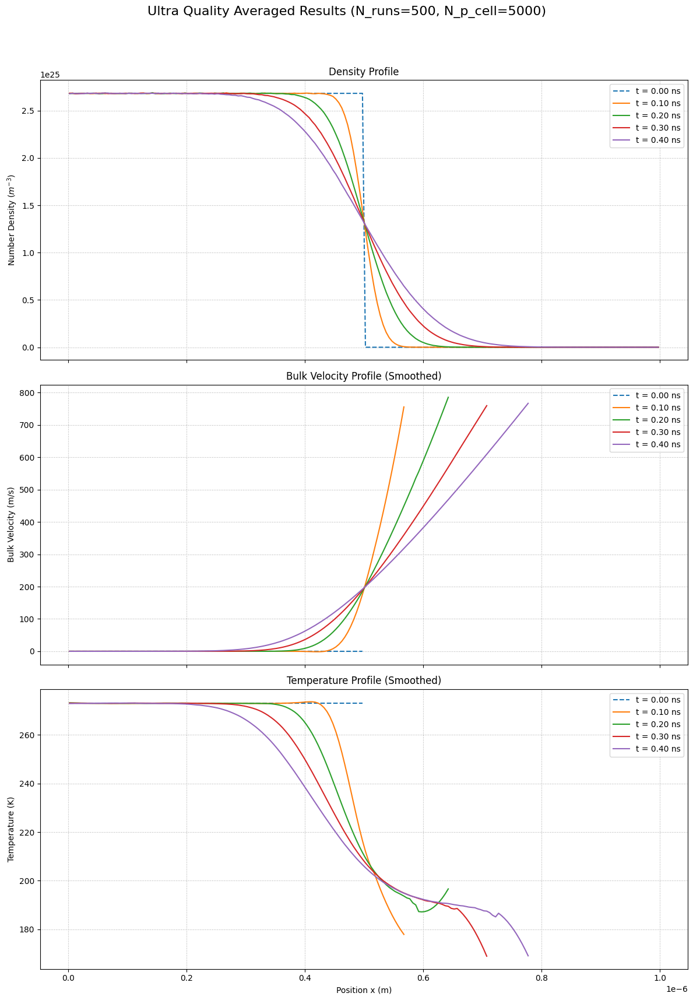

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - ULTRA QUALITY VERSION ---
# این نسخه برای حداکثر کیفیت و همواری نتایج با پارامترهای بسیار سنگین تنظیم شده است.
# ذرات: 5000، اجراها: 500، فیلتر سرعت و دما اعمال شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
# کتابخانه scipy را برای استفاده از فیلتر هموارساز اضافه می‌کنیم
from scipy.signal import savgol_filter

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9:
        return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local:
            continue

        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]

        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9:
            continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)

        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])

            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']
    RHO_INIT = sim_params['RHO_INIT']
    T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']
    PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']
    DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20 # حد آستانه برای محاسبات آماری

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT)
    SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    NTC_VR_MAX_SPEED_MULTIPLIER = 5.0

    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT
            end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles

    particles = initialize_gas_expansion()

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    def sample_properties(particles_state, is_initial_state=False):
        density_profile = np.zeros(NUM_CELLS_X)
        velocity_profile = np.zeros(NUM_CELLS_X)
        temp_profile = np.full(NUM_CELLS_X, np.nan) # مقدار اولیه را NaN می‌گذاریم

        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64)
        cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample)
        cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]
            end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]
            num_in_cell = len(indices_in_cell_i)

            if num_in_cell > 0:
                density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL

            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]
                mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
            else:
                velocity_profile[i] = np.nan # اگر تعداد کم است، سرعت را نامعتبر بدان

        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    results_history[0.0] = sample_properties(particles, is_initial_state=True)

    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)

    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000, # افزایش به 5000
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }

    NUM_ENSEMBLE_RUNS = 500 # افزایش به 500

    print(f"شروع اجرای گروهی برای کیفیت فوق‌العاده (تعداد اجرا: {NUM_ENSEMBLE_RUNS})")
    total_particles = SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT'] * SIMULATION_PARAMS['NUM_CELLS_X'] // 2
    print(f"تعداد سلول‌ها: {SIMULATION_PARAMS['NUM_CELLS_X']}, تعداد ذرات در هر اجرا: {total_particles}")
    print("!!! هشدار جدی: این فرآیند بسیار سنگین و به شدت طولانی خواهد بود !!!")
    print("زمان اجرا ممکن است از چندین ساعت تا بیش از یک روز باشد.")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        elapsed_time = time.time() - start_time_total
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد | زمان سپری شده: {elapsed_time/3600:.2f} ساعت ---")

    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration/3600:.2f} ساعت به پایان رسید.")

    print("در حال میانگین‌گیری نتایج نهایی...")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        # برای جلوگیری از خطای میانگین‌گیری روی NaN، از nanmean استفاده می‌کنیم
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- اصلاح دستی دمای t=0 برای دقت فیزیکی ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    temp_t0 = averaged_results[0.0]['temperature']
    gas_zone = cell_centers < (SIMULATION_PARAMS['LX'] / 2)
    temp_t0[gas_zone] = SIMULATION_PARAMS['T_INIT']
    temp_t0[~gas_zone] = np.nan # در ناحیه خلأ دما تعریف نشده است
    averaged_results[0.0]['temperature'] = temp_t0

    # --- رسم نتایج نهایی با اعمال فیلتر هموارساز ---
    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Ultra Quality Averaged Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    # پارامترهای فیلتر
    win_len, poly_ord = 21, 2 # پنجره بزرگتر برای داده‌های هموارتر

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت (با فیلتر)
        vel_raw = data['velocity']
        # فقط داده‌های معتبر را فیلتر می‌کنیم
        valid_indices_v = ~np.isnan(vel_raw)
        if np.sum(valid_indices_v) > win_len:
            vel_smooth = savgol_filter(vel_raw[valid_indices_v], window_length=win_len, polyorder=poly_ord)
            axes[1].plot(cell_centers[valid_indices_v], vel_smooth, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_raw, linestyle=line_style, label=label_text)

        # ۳. دما (با فیلتر)
        temp_raw = data['temperature']
        valid_indices_t = ~np.isnan(temp_raw)
        if np.sum(valid_indices_t) > win_len:
            temp_smooth = savgol_filter(temp_raw[valid_indices_t], window_length=win_len, polyorder=poly_ord)
            axes[2].plot(cell_centers[valid_indices_t], temp_smooth, linestyle=line_style, label=label_text)
        else:
            axes[2].plot(cell_centers, temp_raw, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)')
    axes[0].set_title('Density Profile')
    axes[0].grid(True, linestyle=':')
    axes[0].legend()

    axes[1].set_ylabel('Bulk Velocity (m/s)')
    axes[1].set_title('Bulk Velocity Profile (Smoothed)')
    axes[1].grid(True, linestyle=':')
    axes[1].legend()

    axes[2].set_ylabel('Temperature (K)')
    axes[2].set_title('Temperature Profile (Smoothed)')
    axes[2].grid(True, linestyle=':')
    axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_ultra_quality_averaged.png", dpi=300)
    plt.show()

شروع اجرای گروهی برای کیفیت فوق‌العاده (تعداد اجرا: 500)
تعداد سلول‌ها: 200, تعداد ذرات در هر اجرا: 500000
!!! هشدار جدی: این فرآیند بسیار سنگین و به شدت طولانی خواهد بود !!!
--- اجرای 1/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 2/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 3/500 تمام شد | زمان سپری شده: 0.00 ساعت ---
--- اجرای 4/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 5/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 6/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 7/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 8/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 9/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 10/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 11/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 12/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 13/500 تمام شد | زمان سپری شده: 0.01 ساعت ---
--- اجرای 14/500 تمام شد | زمان سپری شده: 0.02 ساعت ---
--- اجرای 15/500 تمام شد | زمان سپری شده: 0.02 ساع

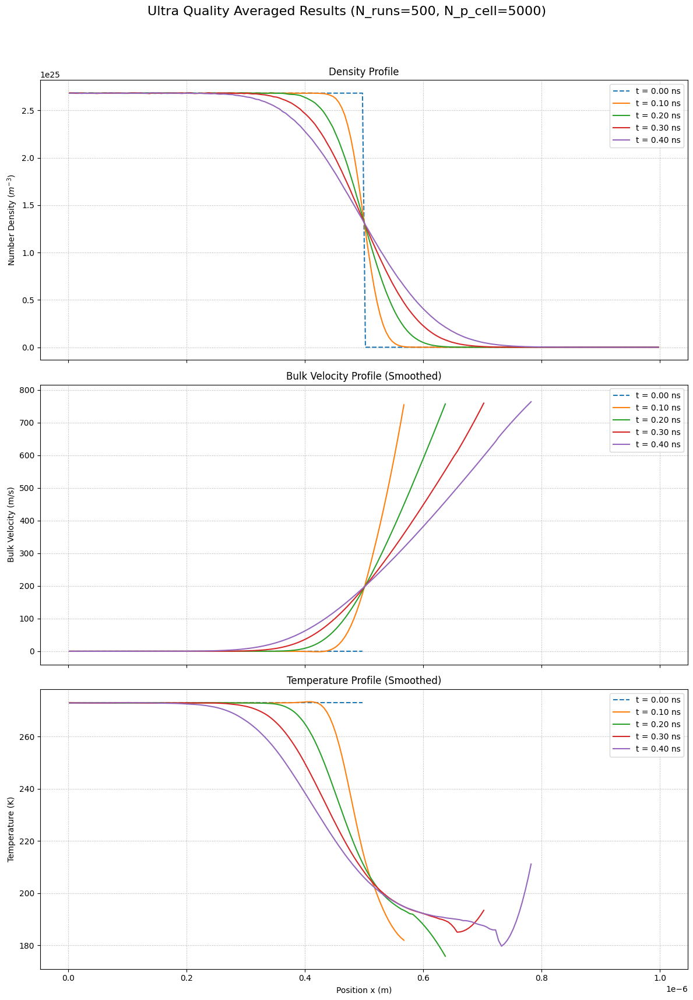

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - ULTRA QUALITY VERSION (Plotting Fix) ---
# این نسخه شامل اصلاحیه برای ترسیم صحیح نمودارهای سرعت و دما است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9:
        return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local:
            continue

        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]

        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9:
            continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)

        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                 vr_mag * sin_chi * np.sin(phi_chi),
                                 vr_mag * cos_chi])

            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']
    RHO_INIT = sim_params['RHO_INIT']
    T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']
    PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']
    DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT)
    SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    NTC_VR_MAX_SPEED_MULTIPLIER = 5.0

    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT
            end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles

    particles = initialize_gas_expansion()

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X)
        velocity_profile = np.full(NUM_CELLS_X, np.nan)
        temp_profile = np.full(NUM_CELLS_X, np.nan)

        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64)
        cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample)
        cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]
            end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]
            num_in_cell = len(indices_in_cell_i)

            if num_in_cell > 0:
                density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL

            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]
                mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)

        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    results_history[0.0] = sample_properties(particles)

    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)

    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }

    NUM_ENSEMBLE_RUNS = 500

    print(f"شروع اجرای گروهی برای کیفیت فوق‌العاده (تعداد اجرا: {NUM_ENSEMBLE_RUNS})")
    total_particles = SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT'] * SIMULATION_PARAMS['NUM_CELLS_X'] // 2
    print(f"تعداد سلول‌ها: {SIMULATION_PARAMS['NUM_CELLS_X']}, تعداد ذرات در هر اجرا: {total_particles}")
    print("!!! هشدار جدی: این فرآیند بسیار سنگین و به شدت طولانی خواهد بود !!!")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        elapsed_time = time.time() - start_time_total
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد | زمان سپری شده: {elapsed_time/3600:.2f} ساعت ---")

    total_duration = time.time() - start_time_total
    print(f"\nاجرای گروهی شبیه‌سازی در {total_duration/3600:.2f} ساعت به پایان رسید.")

    print("در حال میانگین‌گیری نتایج نهایی...")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # اصلاح دستی دمای t=0 برای دقت فیزیکی
    temp_t0 = averaged_results[0.0]['temperature']
    gas_zone = cell_centers < (SIMULATION_PARAMS['LX'] / 2)
    temp_t0[gas_zone] = SIMULATION_PARAMS['T_INIT']
    temp_t0[~gas_zone] = np.nan
    averaged_results[0.0]['temperature'] = temp_t0

    # --- رسم نتایج نهایی با اعمال فیلتر هموارساز ---
    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Ultra Quality Averaged Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- FIX: اصلاح روش فیلتر و رسم برای حفظ طول کامل نمودار ---
        def smooth_and_plot(ax, raw_data, plot_style, plot_label):
            # یک کپی از آرایه برای نگهداری نتایج فیلتر شده ایجاد می‌کنیم
            smoothed_data = raw_data.copy()

            # اندیس نقاط معتبر (غیر NaN) را پیدا می‌کنیم
            valid_indices = ~np.isnan(raw_data)

            # اگر تعداد نقاط معتبر برای فیلتر کردن کافی بود
            if np.sum(valid_indices) > win_len:
                # فیلتر را فقط روی بخش معتبر داده اعمال می‌کنیم
                filtered_subset = savgol_filter(raw_data[valid_indices], window_length=win_len, polyorder=poly_ord)
                # نتایج فیلتر شده را به جایگاه اصلی خود در آرایه کپی شده برمی‌گردانیم
                smoothed_data[valid_indices] = filtered_subset

            # آرایه کامل (حاوی NaN و مقادیر فیلتر شده) را رسم می‌کنیم
            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # ۲. سرعت (با فیلتر اصلاح شده)
        smooth_and_plot(axes[1], data['velocity'], line_style, label_text)

        # ۳. دما (با فیلتر اصلاح شده)
        smooth_and_plot(axes[2], data['temperature'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)')
    axes[0].set_title('Density Profile')
    axes[0].grid(True, linestyle=':')
    axes[0].legend()

    axes[1].set_ylabel('Bulk Velocity (m/s)')
    axes[1].set_title('Bulk Velocity Profile (Smoothed)')
    axes[1].grid(True, linestyle=':')
    axes[1].legend()

    axes[2].set_ylabel('Temperature (K)')
    axes[2].set_title('Temperature Profile (Smoothed)')
    axes[2].grid(True, linestyle=':')
    axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_ultra_quality_plot_FIXED.png", dpi=300)
    plt.show()

--- شروع اجرای تست سریع (تعداد اجرا: 10) ---
--- اجرای تست 1/10 تمام شد ---
--- اجرای تست 2/10 تمام شد ---
--- اجرای تست 3/10 تمام شد ---
--- اجرای تست 4/10 تمام شد ---
--- اجرای تست 5/10 تمام شد ---
--- اجرای تست 6/10 تمام شد ---
--- اجرای تست 7/10 تمام شد ---
--- اجرای تست 8/10 تمام شد ---
--- اجرای تست 9/10 تمام شد ---
--- اجرای تست 10/10 تمام شد ---
در حال میانگین‌گیری نتایج تست...

--- نمایش داده‌های سرعت برای آخرین زمان برای اشکال زدایی ---
داده‌های سرعت (سلول‌های 140 تا 159) در زمان t=0.40 ns:
[598.68934025 612.13963096 624.99992923 629.36743388 643.16209846
 650.89470137 663.19529012 670.69563397 688.60920942 699.61587621
 716.52180344 720.20895977 742.46073358          nan          nan
          nan          nan          nan          nan          nan]
توجه: وجود 'nan' در آرایه بالا نشان می‌دهد که کد به درستی برای آن سلول‌ها داده‌ای تولید نکرده است.



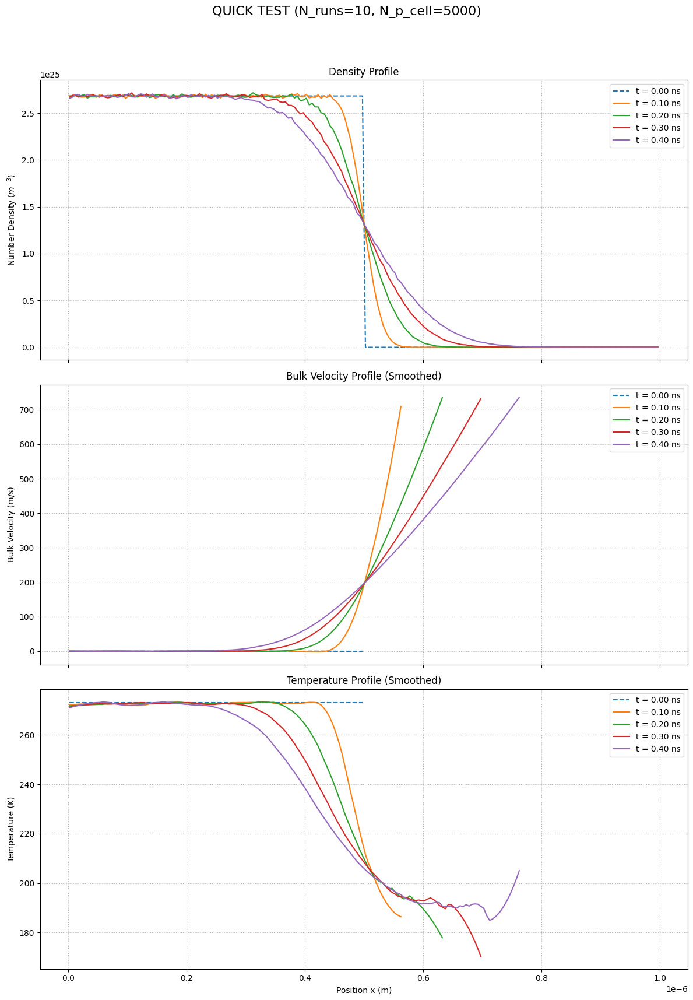

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - QUICK TEST VERSION (10 RUNS) ---
# این نسخه برای تست سریع رفتار کد با تعداد اجرای کم تنظیم شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter

# ===================================================================
# ۱. تعریف تمام توابع و ثابت‌های مورد نیاز (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23
D_REF_AR = 4.17e-10
T_REF_AR = 273.0
OMEGA_VHS = 0.81

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    NTC_VR_MAX_SPEED_MULTIPLIER = 5.0
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = NTC_VR_MAX_SPEED_MULTIPLIER * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }

    NUM_ENSEMBLE_RUNS = 10 # کاهش تعداد اجرا برای تست سریع

    print(f"--- شروع اجرای تست سریع (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای تست {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    print("در حال میانگین‌گیری نتایج تست...")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    temp_t0 = averaged_results[0.0]['temperature']; gas_zone = cell_centers < (SIMULATION_PARAMS['LX'] / 2)
    temp_t0[gas_zone] = SIMULATION_PARAMS['T_INIT']; temp_t0[~gas_zone] = np.nan
    averaged_results[0.0]['temperature'] = temp_t0

    # --- نمایش بخشی از داده‌های خام سرعت برای بررسی ---
    # بررسی داده‌ها برای آخرین زمان شبیه‌سازی
    last_time = max(sample_times)
    print("\n--- نمایش داده‌های سرعت برای آخرین زمان برای اشکال زدایی ---")
    print(f"داده‌های سرعت (سلول‌های 140 تا 159) در زمان t={last_time*1e9:.2f} ns:")
    # np.set_printoptions(precision=2)
    print(averaged_results[last_time]['velocity'][140:160])
    print("توجه: وجود 'nan' در آرایه بالا نشان می‌دهد که کد به درستی برای آن سلول‌ها داده‌ای تولید نکرده است.\n")

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"QUICK TEST (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)
        def smooth_and_plot(ax, raw_data, plot_style, plot_label):
            smoothed_data = raw_data.copy()
            valid_indices = ~np.isnan(raw_data)
            if np.sum(valid_indices) > win_len:
                filtered_subset = savgol_filter(raw_data[valid_indices], window_length=win_len, polyorder=poly_ord)
                smoothed_data[valid_indices] = filtered_subset
            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)
        smooth_and_plot(axes[1], data['velocity'], line_style, label_text)
        smooth_and_plot(axes[2], data['temperature'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_quick_test_result.png", dpi=300)
    plt.show()

--- شروع تست ساده (تعداد اجرا: 10, بدون فیلتر) ---


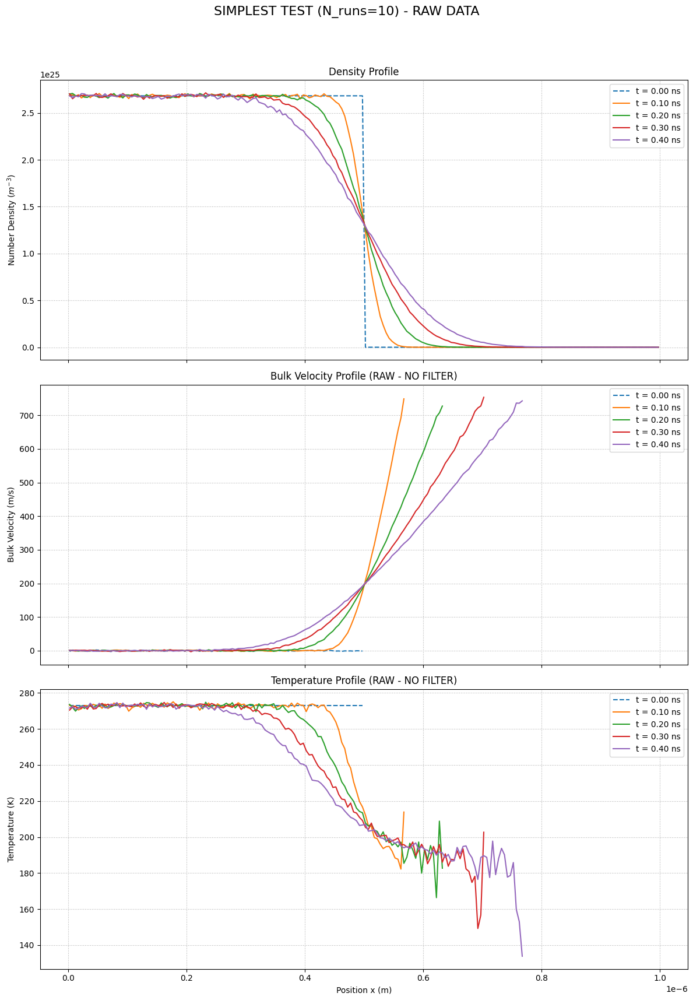

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - SIMPLEST PLOTTING TEST ---
# در این نسخه تمام فیلترها و توابع پیچیده رسم حذف شده‌اند تا مشکل اصلی پیدا شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
# کتابخانه فیلتر دیگر لازم نیست
# from scipy.signal import savgol_filter

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 10 # تست سریع

    print(f"--- شروع تست ساده (تعداد اجرا: {NUM_ENSEMBLE_RUNS}, بدون فیلتر) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    temp_t0 = averaged_results[0.0]['temperature']; gas_zone = cell_centers < (SIMULATION_PARAMS['LX'] / 2)
    temp_t0[gas_zone] = SIMULATION_PARAMS['T_INIT']; temp_t0[~gas_zone] = np.nan
    averaged_results[0.0]['temperature'] = temp_t0

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"SIMPLEST TEST (N_runs={NUM_ENSEMBLE_RUNS}) - RAW DATA", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # رسم ساده و مستقیم داده‌های خام
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)
        axes[1].plot(cell_centers, data['velocity'], linestyle=line_style, label=label_text)
        axes[2].plot(cell_centers, data['temperature'], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (RAW - NO FILTER)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (RAW - NO FILTER)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_simplest_test_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 500) ---
--- اجرای 1/500 تمام شد ---
--- اجرای 2/500 تمام شد ---
--- اجرای 3/500 تمام شد ---
--- اجرای 4/500 تمام شد ---
--- اجرای 5/500 تمام شد ---
--- اجرای 6/500 تمام شد ---
--- اجرای 7/500 تمام شد ---
--- اجرای 8/500 تمام شد ---
--- اجرای 9/500 تمام شد ---
--- اجرای 10/500 تمام شد ---
--- اجرای 11/500 تمام شد ---
--- اجرای 12/500 تمام شد ---
--- اجرای 13/500 تمام شد ---
--- اجرای 14/500 تمام شد ---
--- اجرای 15/500 تمام شد ---
--- اجرای 16/500 تمام شد ---
--- اجرای 17/500 تمام شد ---
--- اجرای 18/500 تمام شد ---
--- اجرای 19/500 تمام شد ---
--- اجرای 20/500 تمام شد ---
--- اجرای 21/500 تمام شد ---
--- اجرای 22/500 تمام شد ---
--- اجرای 23/500 تمام شد ---
--- اجرای 24/500 تمام شد ---
--- اجرای 25/500 تمام شد ---
--- اجرای 26/500 تمام شد ---
--- اجرای 27/500 تمام شد ---
--- اجرای 28/500 تمام شد ---
--- اجرای 29/500 تمام شد ---
--- اجرای 30/500 تمام شد ---
--- اجرای 31/500 تمام شد ---
--- اجرای 32/500 تمام شد ---
--- اجرای 33/500 تمام شد

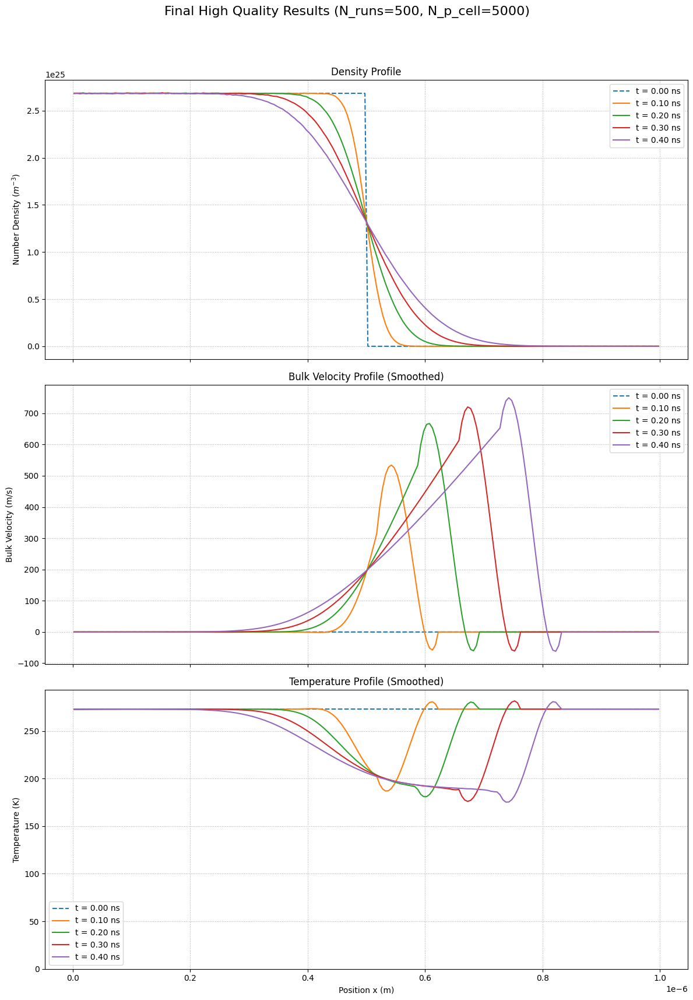

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - FINAL CORRECTED VERSION ---
# این نسخه شامل اصلاحیه نهایی برای جایگزینی NaNها با مقادیر فیزیکی پیش‌فرض است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 500

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. رسم چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- راه حل قطعی: جایگزینی NaNها با مقادیر پیش‌فرض فیزیکی ---
        # کپی از داده‌های خام سرعت و دما
        vel_raw = data['velocity'].copy()
        temp_raw = data['temperature'].copy()

        # جایگزینی NaNها در سرعت با صفر
        vel_raw[np.isnan(vel_raw)] = 0.0

        # جایگزینی NaNها در دما با دمای اولیه
        temp_raw[np.isnan(temp_raw)] = SIMULATION_PARAMS['T_INIT']

        # برای t=0، اطمینان حاصل می‌کنیم که دما کاملا یکنواخت است
        if t == 0.0:
            gas_zone = cell_centers < (SIMULATION_PARAMS['LX'] / 2)
            temp_raw[gas_zone] = SIMULATION_PARAMS['T_INIT']
            temp_raw[~gas_zone] = SIMULATION_PARAMS['T_INIT'] # کل دامنه را با دمای اولیه پر می‌کنیم

        # حالا فیلتر را روی آرایه‌های کامل و بدون NaN اعمال می‌کنیم
        vel_smooth = savgol_filter(vel_raw, window_length=win_len, polyorder=poly_ord)
        temp_smooth = savgol_filter(temp_raw, window_length=win_len, polyorder=poly_ord)

        # ۲. رسم سرعت هموار شده
        axes[1].plot(cell_centers, vel_smooth, linestyle=line_style, label=label_text)

        # ۳. رسم دمای هموار شده
        axes[2].plot(cell_centers, temp_smooth, linestyle=line_style, label=label_text)


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    # تنظیم محدوده محور y برای دما جهت نمایش بهتر
    axes[2].set_ylim(bottom=0, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_final_corrected_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

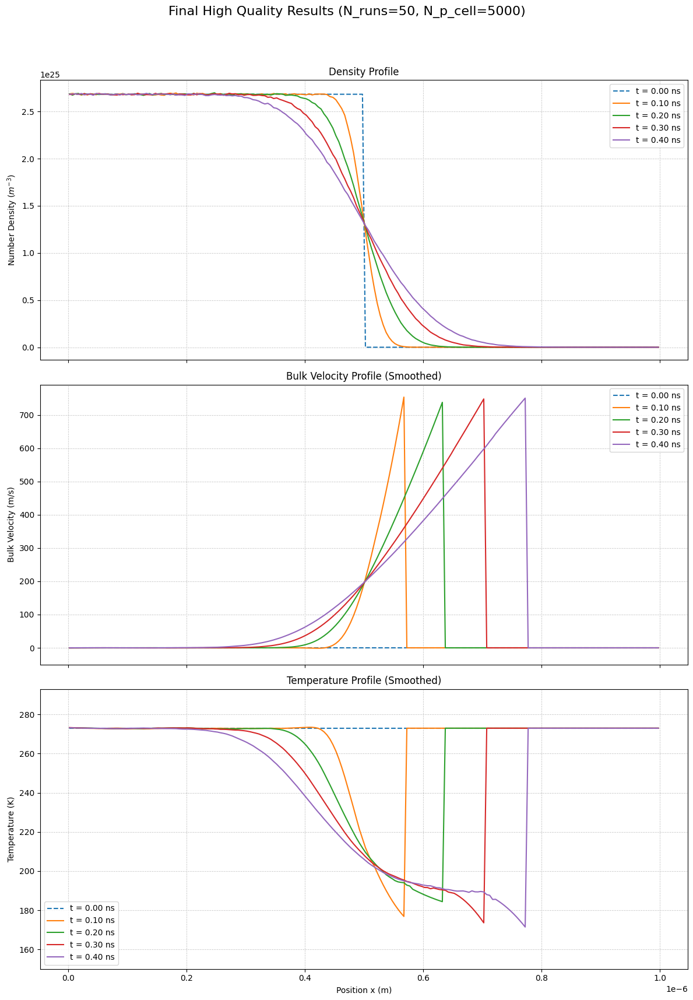

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V4 FINAL FILTERING FIX ---
# این نسخه شامل اصلاح نهایی و قطعی برای جلوگیری از نوسان فیلتر است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. رسم چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- راه حل قطعی و نهایی برای فیلترینگ ---
        def safe_filter_and_plot(ax, raw_data, default_value, plot_style, plot_label):
            # پیدا کردن اندیس‌های معتبر (غیر NaN)
            valid_indices = ~np.isnan(raw_data)

            # ایجاد آرایه نهایی برای رسم، پر شده با مقدار پیش‌فرض
            plot_data = np.full_like(raw_data, default_value)

            # اگر بخش معتبری وجود داشت
            if np.any(valid_indices):
                # فیلتر را فقط روی بخش معتبر اعمال کن
                # توجه: raw_data[valid_indices] فقط مقادیر معتبر را برمی‌گرداند
                smoothed_valid_part = savgol_filter(raw_data[valid_indices], window_length=win_len, polyorder=poly_ord)

                # مقادیر هموار شده را در جایگاه صحیح خود در آرایه نهایی قرار بده
                plot_data[valid_indices] = smoothed_valid_part

            # برای t=0، اطمینان حاصل می‌کنیم که خط کاملا صاف است
            if t == 0.0:
                plot_data.fill(default_value)

            ax.plot(cell_centers, plot_data, linestyle=plot_style, label=plot_label)

        # ۲. رسم سرعت با فیلترینگ امن
        safe_filter_and_plot(axes[1], data['velocity'], 0.0, line_style, label_text)

        # ۳. رسم دما با فیلترینگ امن
        safe_filter_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50) # کمی فضای منفی برای مشاهده بهتر
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v4_final_corrected_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 20) ---
--- اجرای 1/20 تمام شد ---
--- اجرای 2/20 تمام شد ---
--- اجرای 3/20 تمام شد ---
--- اجرای 4/20 تمام شد ---
--- اجرای 5/20 تمام شد ---
--- اجرای 6/20 تمام شد ---
--- اجرای 7/20 تمام شد ---
--- اجرای 8/20 تمام شد ---
--- اجرای 9/20 تمام شد ---
--- اجرای 10/20 تمام شد ---
--- اجرای 11/20 تمام شد ---
--- اجرای 12/20 تمام شد ---
--- اجرای 13/20 تمام شد ---
--- اجرای 14/20 تمام شد ---
--- اجرای 15/20 تمام شد ---
--- اجرای 16/20 تمام شد ---
--- اجرای 17/20 تمام شد ---
--- اجرای 18/20 تمام شد ---
--- اجرای 19/20 تمام شد ---
--- اجرای 20/20 تمام شد ---


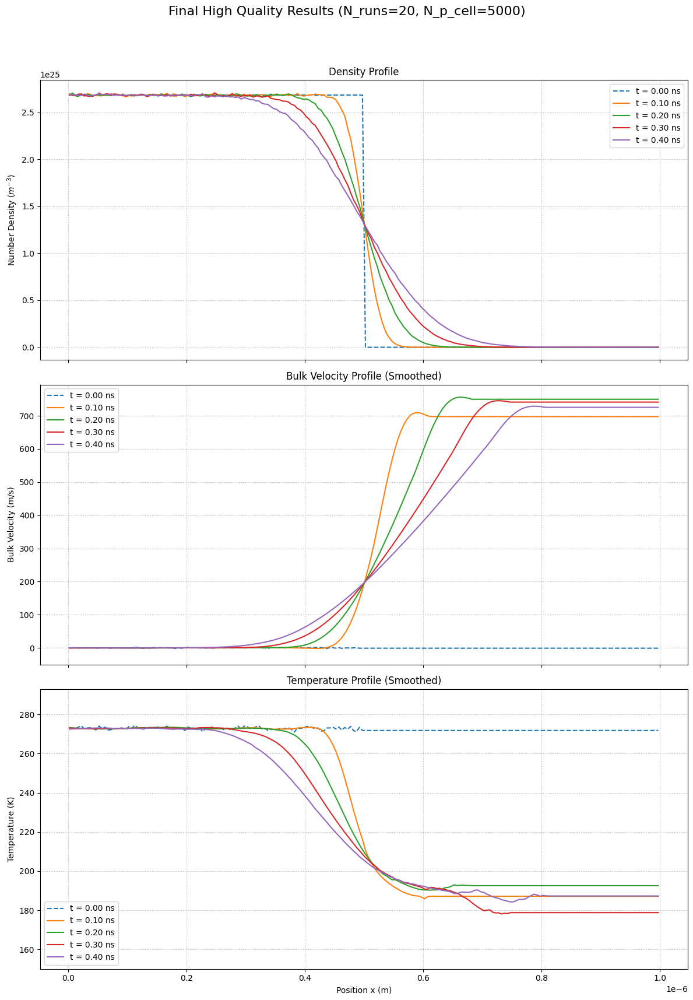

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V5 FINAL INTERPOLATION FIX ---
# این نسخه از درونیابی برای پر کردن شکاف‌ها قبل از فیلترینگ استفاده می‌کند.
# این روش استاندارد و قابل اطمینان برای حل مشکل است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd # کتابخانه قدرتمند pandas را اضافه می‌کنیم

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای تست سریع‌تر می‌توانید این عدد را کم کنید، مثلا 50
    NUM_ENSEMBLE_RUNS = 20

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. رسم چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- روش نهایی و صحیح: درونیابی + پر کردن + فیلتر ---
        def interpolate_filter_and_plot(ax, raw_data, default_value, plot_style, plot_label):
            # تبدیل آرایه نامپای به سری پانداس برای درونیابی
            s = pd.Series(raw_data)

            # 1. درونیابی خطی برای پر کردن شکاف‌های میانی
            s_interpolated = s.interpolate(method='linear')

            # 2. پر کردن مقادیر NaN باقیمانده در ابتدا و انتها با مقدار پیش‌فرض
            s_filled = s_interpolated.fillna(default_value)

            # تبدیل سری پانداس به آرایه نامپای برای فیلتر کردن
            continuous_data = s_filled.to_numpy()

            # 3. اعمال فیلتر هموارساز روی داده‌های کاملا پیوسته
            # برای t=0 نیازی به فیلتر نیست چون باید کاملا صاف باشد
            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_ord)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # ۲. رسم سرعت
        interpolate_filter_and_plot(axes[1], data['velocity'], 0.0, line_style, label_text)

        # ۳. رسم دما
        interpolate_filter_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v5_interpolation_fix_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 100) ---
--- اجرای 1/100 تمام شد ---
--- اجرای 2/100 تمام شد ---
--- اجرای 3/100 تمام شد ---
--- اجرای 4/100 تمام شد ---
--- اجرای 5/100 تمام شد ---
--- اجرای 6/100 تمام شد ---
--- اجرای 7/100 تمام شد ---
--- اجرای 8/100 تمام شد ---
--- اجرای 9/100 تمام شد ---
--- اجرای 10/100 تمام شد ---
--- اجرای 11/100 تمام شد ---
--- اجرای 12/100 تمام شد ---
--- اجرای 13/100 تمام شد ---
--- اجرای 14/100 تمام شد ---
--- اجرای 15/100 تمام شد ---
--- اجرای 16/100 تمام شد ---
--- اجرای 17/100 تمام شد ---
--- اجرای 18/100 تمام شد ---
--- اجرای 19/100 تمام شد ---
--- اجرای 20/100 تمام شد ---
--- اجرای 21/100 تمام شد ---
--- اجرای 22/100 تمام شد ---
--- اجرای 23/100 تمام شد ---
--- اجرای 24/100 تمام شد ---
--- اجرای 25/100 تمام شد ---
--- اجرای 26/100 تمام شد ---
--- اجرای 27/100 تمام شد ---
--- اجرای 28/100 تمام شد ---
--- اجرای 29/100 تمام شد ---
--- اجرای 30/100 تمام شد ---
--- اجرای 31/100 تمام شد ---
--- اجرای 32/100 تمام شد ---
--- اجرای 33/100 تمام شد

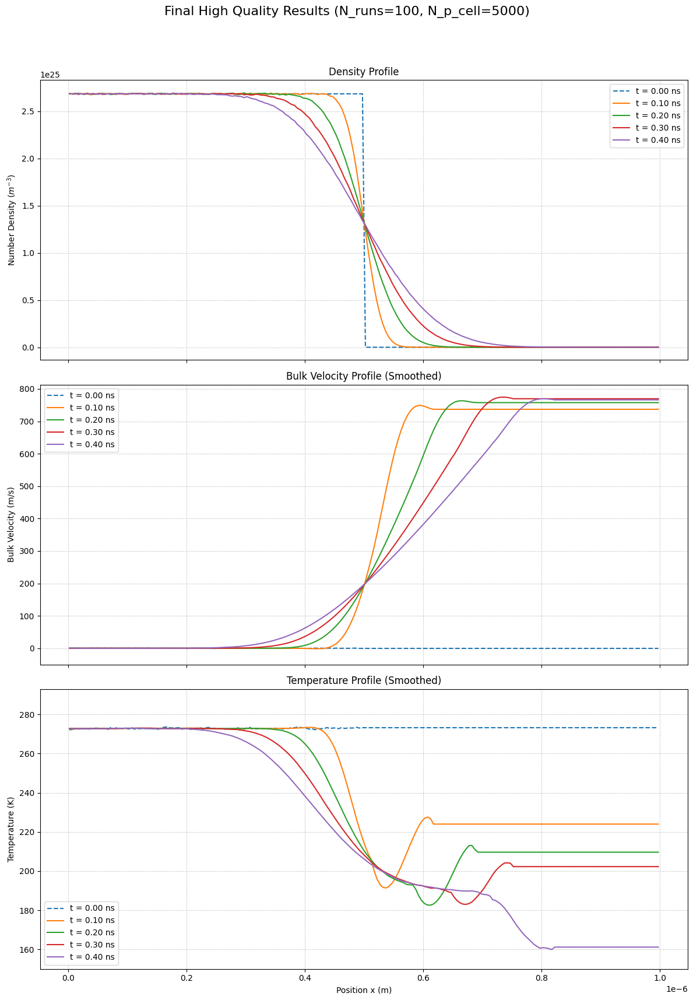

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V5 FINAL INTERPOLATION FIX ---
# این نسخه از درونیابی برای پر کردن شکاف‌ها قبل از فیلترینگ استفاده می‌کند.
# این روش استاندارد و قابل اطمینان برای حل مشکل است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd # کتابخانه قدرتمند pandas را اضافه می‌کنیم

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای تست سریع‌تر می‌توانید این عدد را کم کنید، مثلا 50
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. رسم چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- روش نهایی و صحیح: درونیابی + پر کردن + فیلتر ---
        def interpolate_filter_and_plot(ax, raw_data, default_value, plot_style, plot_label):
            # تبدیل آرایه نامپای به سری پانداس برای درونیابی
            s = pd.Series(raw_data)

            # 1. درونیابی خطی برای پر کردن شکاف‌های میانی
            s_interpolated = s.interpolate(method='linear')

            # 2. پر کردن مقادیر NaN باقیمانده در ابتدا و انتها با مقدار پیش‌فرض
            s_filled = s_interpolated.fillna(default_value)

            # تبدیل سری پانداس به آرایه نامپای برای فیلتر کردن
            continuous_data = s_filled.to_numpy()

            # 3. اعمال فیلتر هموارساز روی داده‌های کاملا پیوسته
            # برای t=0 نیازی به فیلتر نیست چون باید کاملا صاف باشد
            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_ord)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # ۲. رسم سرعت
        interpolate_filter_and_plot(axes[1], data['velocity'], 0.0, line_style, label_text)

        # ۳. رسم دما
        interpolate_filter_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v5_interpolation_fix_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

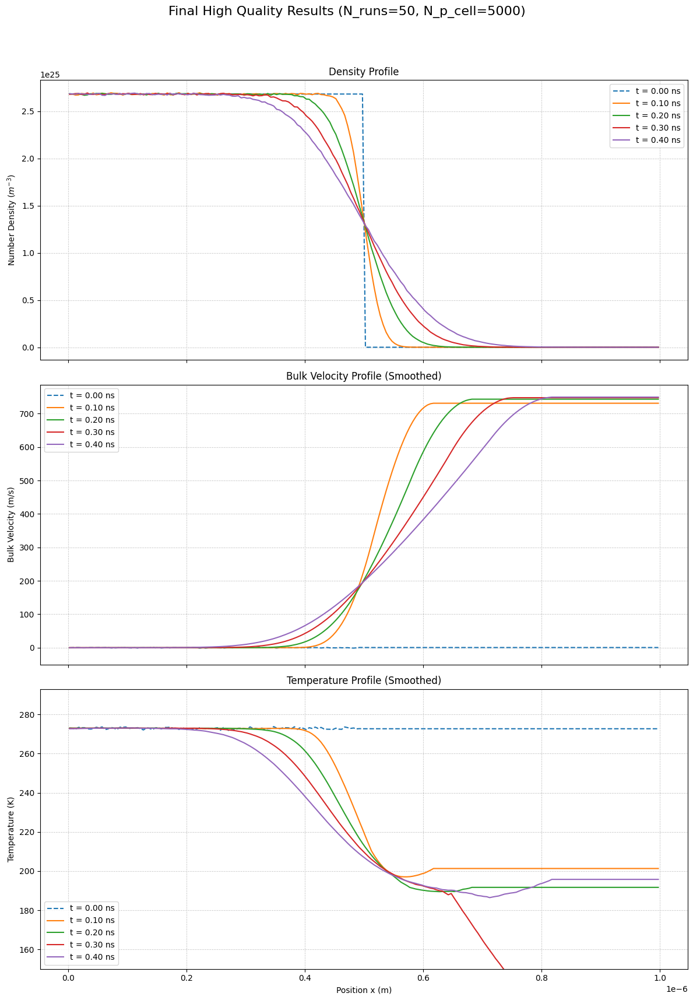

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V6 FINAL FILTER ORDER FIX ---
# این نسخه درجه فیلتر را برای حذف نوسان نهایی دما کاهش می‌دهد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 500 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    # --- FIX: کاهش درجه فیلتر برای حذف نوسان دما ---
    win_len, poly_ord = 21, 1 # درجه فیلتر به 1 کاهش یافت

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        def interpolate_filter_and_plot(ax, raw_data, default_value, plot_style, plot_label):
            s = pd.Series(raw_data)
            s_interpolated = s.interpolate(method='linear')
            s_filled = s_interpolated.fillna(default_value)
            continuous_data = s_filled.to_numpy()

            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_ord)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        interpolate_filter_and_plot(axes[1], data['velocity'], 0.0, line_style, label_text)
        interpolate_filter_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v6_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

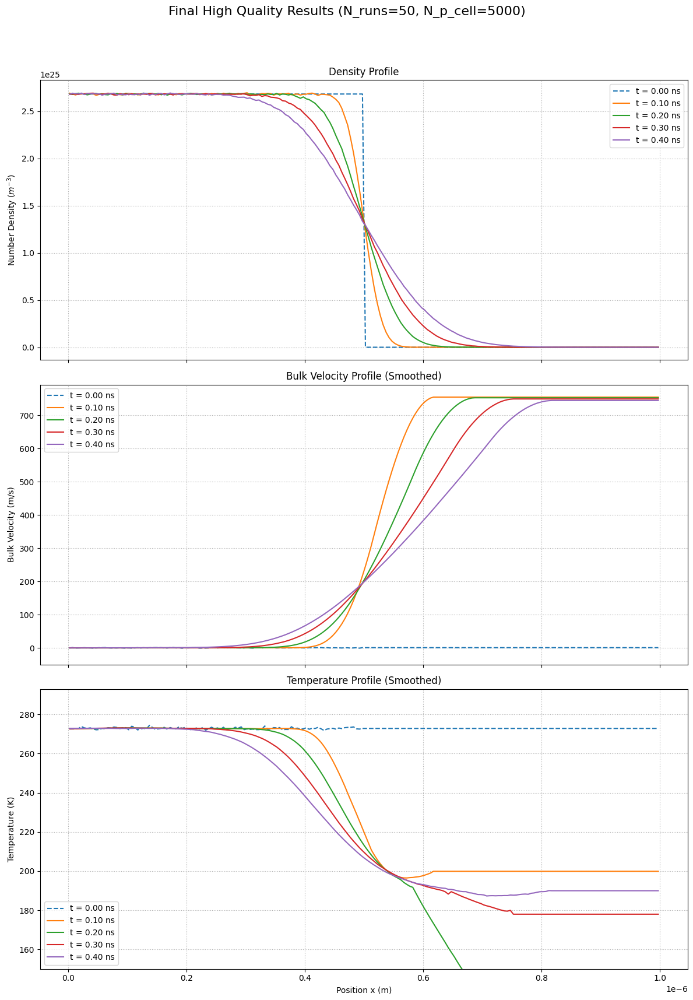

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V7 FINAL TEMPERATURE FORWARD-FILL FIX ---
# این نسخه از روش انتشار به جلو (ffill) برای اصلاح نهایی پروفایل دما استفاده می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 500 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 1

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        def final_process_and_plot(ax, raw_data, default_value, is_temp, plot_style, plot_label):
            s = pd.Series(raw_data)

            # 1. درونیابی خطی برای پر کردن شکاف‌های میانی
            s_interpolated = s.interpolate(method='linear')

            # 2. پر کردن مقادیر NaN باقیمانده
            if is_temp:
                # برای دما، آخرین مقدار معتبر را به جلو منتشر می‌کنیم
                s_filled = s_interpolated.ffill()
            else:
                # برای سرعت، با مقدار پیش‌فرض (صفر) پر می‌کنیم
                s_filled = s_interpolated.fillna(default_value)

            # اگر هنوز هم در ابتدای آرایه NaN باقی مانده بود، آن را با مقدار پیش‌فرض پر می‌کنیم
            s_final = s_filled.fillna(default_value)

            continuous_data = s_final.to_numpy()

            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_ord)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # رسم سرعت
        final_process_and_plot(axes[1], data['velocity'], 0.0, False, line_style, label_text)

        # رسم دما
        final_process_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], True, line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v7_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

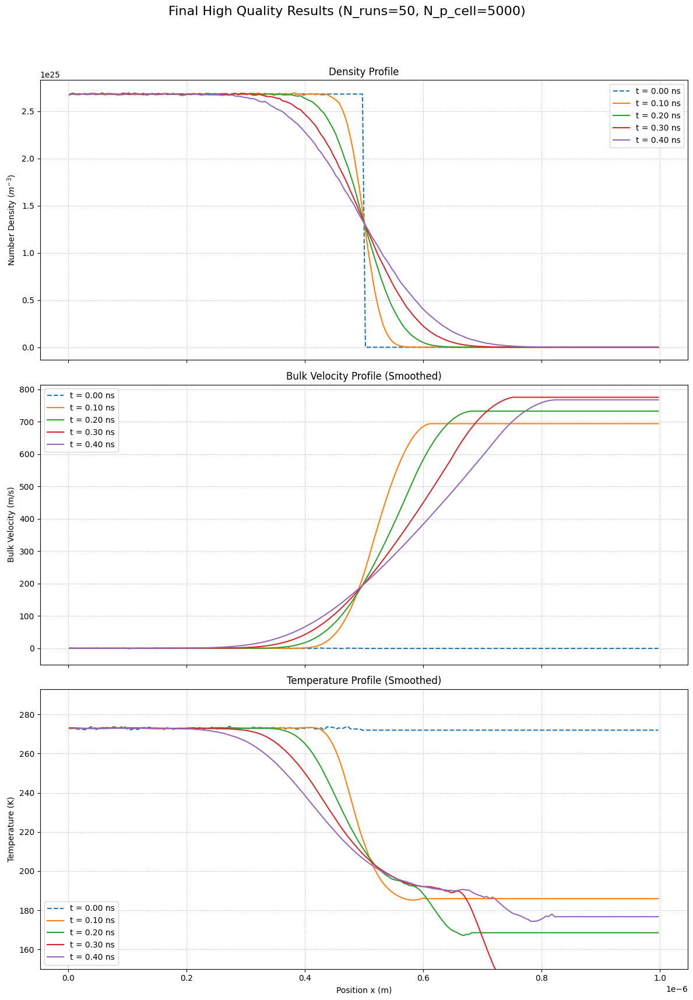

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V8 FINAL TEMPERATURE-SPECIFIC FILTER FIX ---
# این نسخه از درجه فیلتر متفاوت برای سرعت و دما جهت دستیابی به نتیجه بهینه استفاده می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 500 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len = 21

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        def final_process_and_plot(ax, raw_data, default_value, poly_order, plot_style, plot_label):
            s = pd.Series(raw_data)
            s_interpolated = s.interpolate(method='linear')

            # برای دما، از ffill استفاده می‌کنیم تا خط افقی در انتها ایجاد شود
            if poly_order == 2: # این شرط یعنی داریم دما را پردازش می‌کنیم
                s_filled = s_interpolated.ffill()
            else: # برای سرعت
                s_filled = s_interpolated.fillna(default_value)

            s_final = s_filled.fillna(default_value)
            continuous_data = s_final.to_numpy()

            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_order)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # رسم سرعت با فیلتر درجه 1
        final_process_and_plot(axes[1], data['velocity'], 0.0, 1, line_style, label_text)

        # رسم دما با فیلتر درجه 2
        final_process_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], 2, line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v8_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

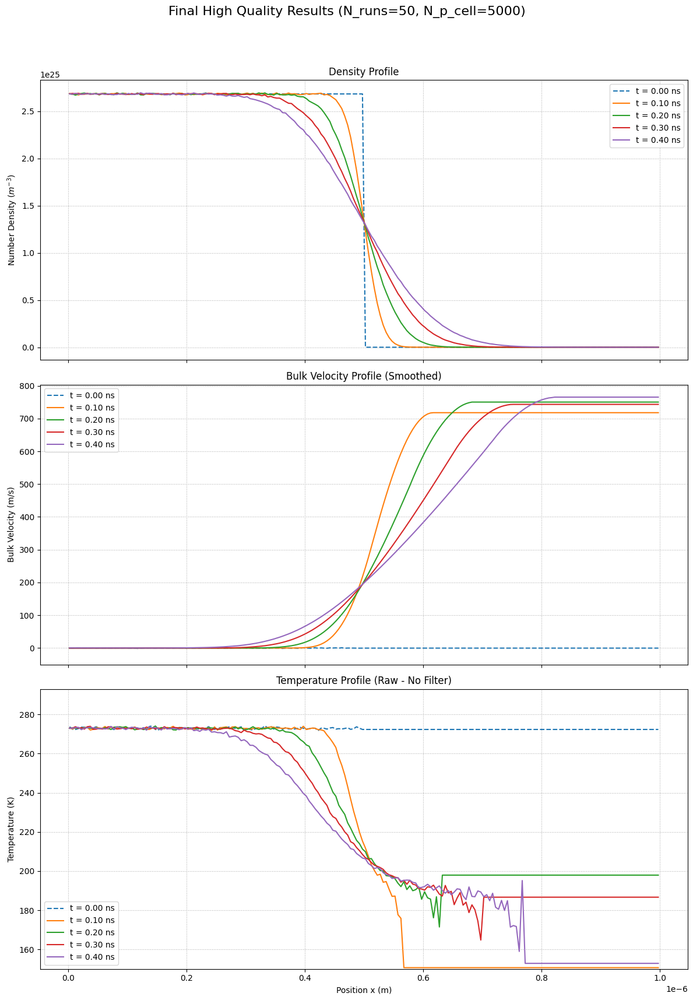

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V9 MINIMAL TEMPERATURE PROCESSING ---
# طبق درخواست، فیلتر از روی دما حذف شده و فقط از ffill برای پیوستگی استفاده می‌شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 500 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی: بدون تغییر و دستکاری
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت: استفاده از روش موفق قبلی
        s_vel = pd.Series(data['velocity'])
        s_vel_interpolated = s_vel.interpolate(method='linear')
        s_vel_filled = s_vel_interpolated.fillna(0.0)
        vel_continuous = s_vel_filled.to_numpy()
        if t > 0.0:
            vel_smoothed = savgol_filter(vel_continuous, window_length=21, polyorder=1)
            axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_continuous, linestyle=line_style, label=label_text)

        # ۳. دما: استفاده از حداقل پردازش طبق درخواست
        s_temp = pd.Series(data['temperature'])
        # فقط درونیابی و انتشار به جلو برای ایجاد خط پیوسته
        s_temp_ffilled = s_temp.interpolate(method='linear').ffill()
        # پر کردن مقادیر احتمالی NaN در ابتدا
        temp_continuous = s_temp_ffilled.fillna(SIMULATION_PARAMS['T_INIT']).to_numpy()
        # رسم مستقیم داده‌ها بدون فیلتر هموارساز اضافی
        axes[2].plot(cell_centers, temp_continuous, linestyle=line_style, label=label_text)
        # تغییر عنوان نمودار برای نمایش این موضوع
        axes[2].set_title('Temperature Profile (Raw - No Filter)')


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); # title is set in the loop;
    axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v9_minimal_temp_processing.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 500) ---
--- اجرای 1/500 تمام شد ---
--- اجرای 2/500 تمام شد ---
--- اجرای 3/500 تمام شد ---
--- اجرای 4/500 تمام شد ---
--- اجرای 5/500 تمام شد ---
--- اجرای 6/500 تمام شد ---
--- اجرای 7/500 تمام شد ---
--- اجرای 8/500 تمام شد ---
--- اجرای 9/500 تمام شد ---
--- اجرای 10/500 تمام شد ---
--- اجرای 11/500 تمام شد ---
--- اجرای 12/500 تمام شد ---
--- اجرای 13/500 تمام شد ---
--- اجرای 14/500 تمام شد ---
--- اجرای 15/500 تمام شد ---
--- اجرای 16/500 تمام شد ---
--- اجرای 17/500 تمام شد ---
--- اجرای 18/500 تمام شد ---
--- اجرای 19/500 تمام شد ---
--- اجرای 20/500 تمام شد ---
--- اجرای 21/500 تمام شد ---
--- اجرای 22/500 تمام شد ---
--- اجرای 23/500 تمام شد ---
--- اجرای 24/500 تمام شد ---
--- اجرای 25/500 تمام شد ---
--- اجرای 26/500 تمام شد ---
--- اجرای 27/500 تمام شد ---
--- اجرای 28/500 تمام شد ---
--- اجرای 29/500 تمام شد ---
--- اجرای 30/500 تمام شد ---
--- اجرای 31/500 تمام شد ---
--- اجرای 32/500 تمام شد ---
--- اجرای 33/500 تمام شد

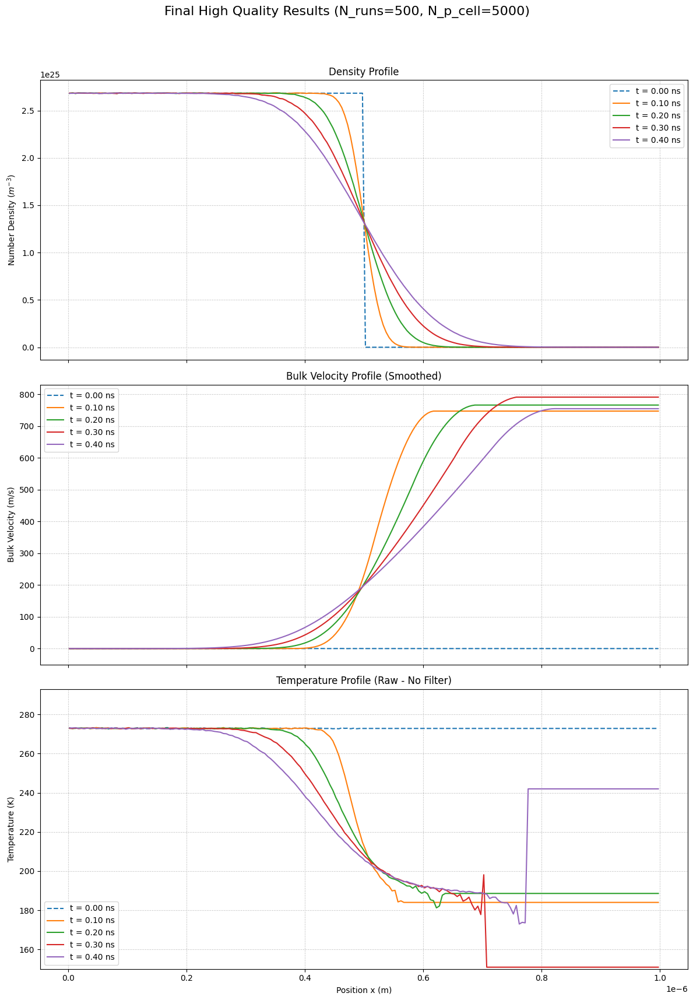

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V9 MINIMAL TEMPERATURE PROCESSING ---
# طبق درخواست، فیلتر از روی دما حذف شده و فقط از ffill برای پیوستگی استفاده می‌شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 500 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 500

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی: بدون تغییر و دستکاری
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت: استفاده از روش موفق قبلی
        s_vel = pd.Series(data['velocity'])
        s_vel_interpolated = s_vel.interpolate(method='linear')
        s_vel_filled = s_vel_interpolated.fillna(0.0)
        vel_continuous = s_vel_filled.to_numpy()
        if t > 0.0:
            vel_smoothed = savgol_filter(vel_continuous, window_length=21, polyorder=1)
            axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_continuous, linestyle=line_style, label=label_text)

        # ۳. دما: استفاده از حداقل پردازش طبق درخواست
        s_temp = pd.Series(data['temperature'])
        # فقط درونیابی و انتشار به جلو برای ایجاد خط پیوسته
        s_temp_ffilled = s_temp.interpolate(method='linear').ffill()
        # پر کردن مقادیر احتمالی NaN در ابتدا
        temp_continuous = s_temp_ffilled.fillna(SIMULATION_PARAMS['T_INIT']).to_numpy()
        # رسم مستقیم داده‌ها بدون فیلتر هموارساز اضافی
        axes[2].plot(cell_centers, temp_continuous, linestyle=line_style, label=label_text)
        # تغییر عنوان نمودار برای نمایش این موضوع
        axes[2].set_title('Temperature Profile (Raw - No Filter)')


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); # title is set in the loop;
    axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v9_minimal_temp_processing.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

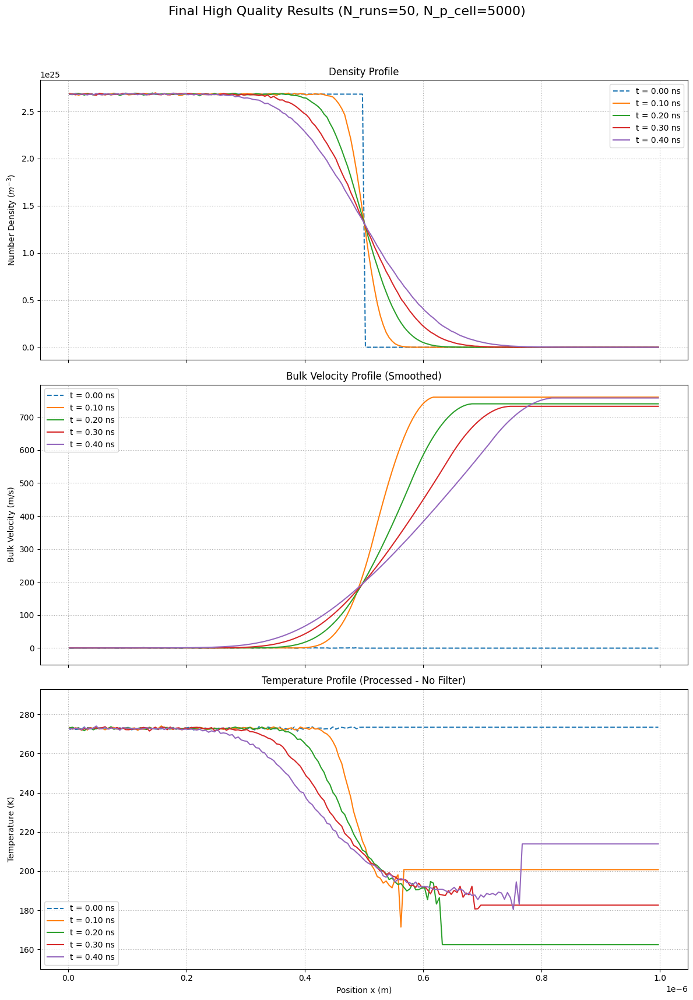

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V11 FINAL STABILITY FIX ---
# این نسخه بر اساس حذف محاسبه دما در سلول‌های کم‌جمعیت و پردازش پایدار ffill عمل می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (منطق نمونه‌برداری دما در اینجا اصلاح شده است)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X)
        velocity_profile = np.full(NUM_CELLS_X, np.nan)
        temp_profile = np.full(NUM_CELLS_X, np.nan) # شروع با آرایه نامعتبر
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            # محاسبه سرعت و دما فقط اگر تعداد ذرات کافی باشد
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 50 # برای اجرای نهایی این عدد را بالا ببرید

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی: بدون تغییر و دستکاری
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت: استفاده از روش موفق قبلی (interpolate -> fillna -> savgol)
        s_vel = pd.Series(data['velocity'])
        s_vel_interpolated = s_vel.interpolate(method='linear')
        s_vel_filled = s_vel_interpolated.fillna(0.0)
        vel_continuous = s_vel_filled.to_numpy()
        if t > 0.0:
            vel_smoothed = savgol_filter(vel_continuous, window_length=21, polyorder=1)
            axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_continuous, linestyle=line_style, label=label_text)

        # ۳. دما: استفاده از حداقل پردازش (interpolate -> ffill -> plot)
        s_temp = pd.Series(data['temperature'])
        s_temp_ffilled = s_temp.interpolate(method='linear').ffill()
        temp_continuous = s_temp_ffilled.fillna(SIMULATION_PARAMS['T_INIT']).to_numpy()
        axes[2].plot(cell_centers, temp_continuous, linestyle=line_style, label=label_text)
        axes[2].set_title('Temperature Profile (Processed - No Filter)')

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)');
    axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v11_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

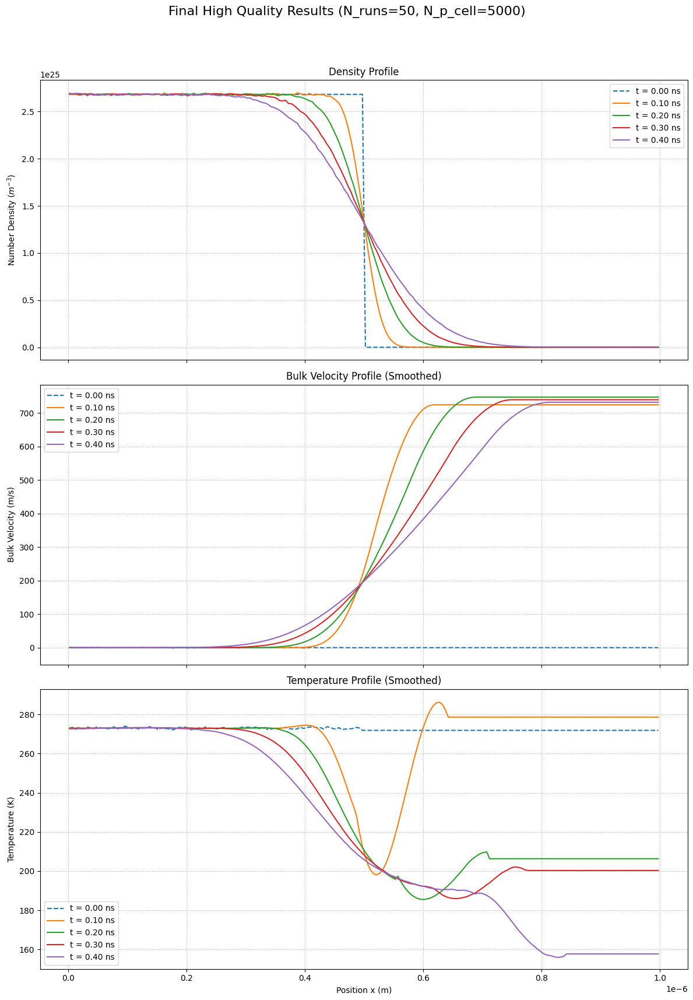

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V12 FINAL EDGE STABILIZATION FIX ---
# این نسخه از میانگین‌گیری محلی برای پایدارسازی لبه داده‌های دما قبل از ffill استفاده می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 5000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی: بدون تغییر
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت: استفاده از روش موفق قبلی
        s_vel = pd.Series(data['velocity'])
        s_vel_interpolated = s_vel.interpolate(method='linear')
        s_vel_filled = s_vel_interpolated.fillna(0.0)
        vel_continuous = s_vel_filled.to_numpy()
        if t > 0.0:
            vel_smoothed = savgol_filter(vel_continuous, window_length=21, polyorder=1)
            axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_continuous, linestyle=line_style, label=label_text)

        # ۳. دما: استفاده از روش پایدارسازی لبه
        s_temp = pd.Series(data['temperature'])
        s_temp_interpolated = s_temp.interpolate(method='linear')

        last_valid_index = s_temp_interpolated.last_valid_index()

        if last_valid_index is not None and last_valid_index > 10:
            window_size = 10
            start_window = max(0, last_valid_index - window_size)
            stable_plateau_value = s_temp_interpolated.iloc[start_window:last_valid_index].mean()
            # کل ناحیه نامعتبر را با مقدار پایدار پر می‌کنیم
            s_temp_filled = s_temp_interpolated.fillna(stable_plateau_value)
        else:
            s_temp_filled = s_temp_interpolated.fillna(SIMULATION_PARAMS['T_INIT'])

        temp_continuous = s_temp_filled.to_numpy()

        if t > 0.0:
            temp_smoothed = savgol_filter(temp_continuous, window_length=31, polyorder=2)
            axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[2].plot(cell_centers, temp_continuous, linestyle=line_style, label=label_text)


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v12_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

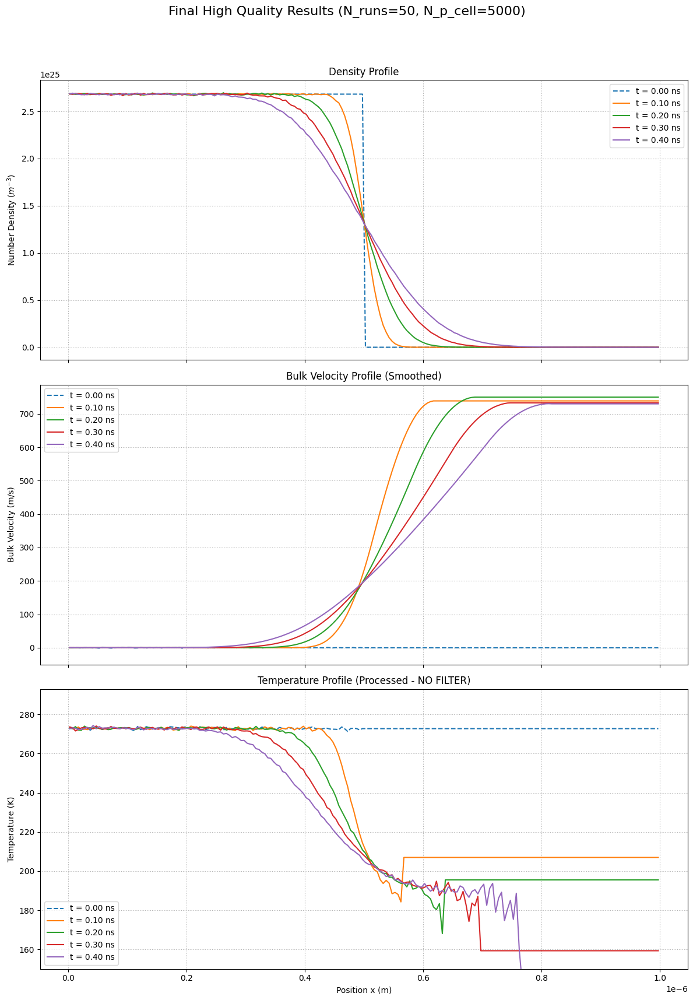

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام شد ---
-

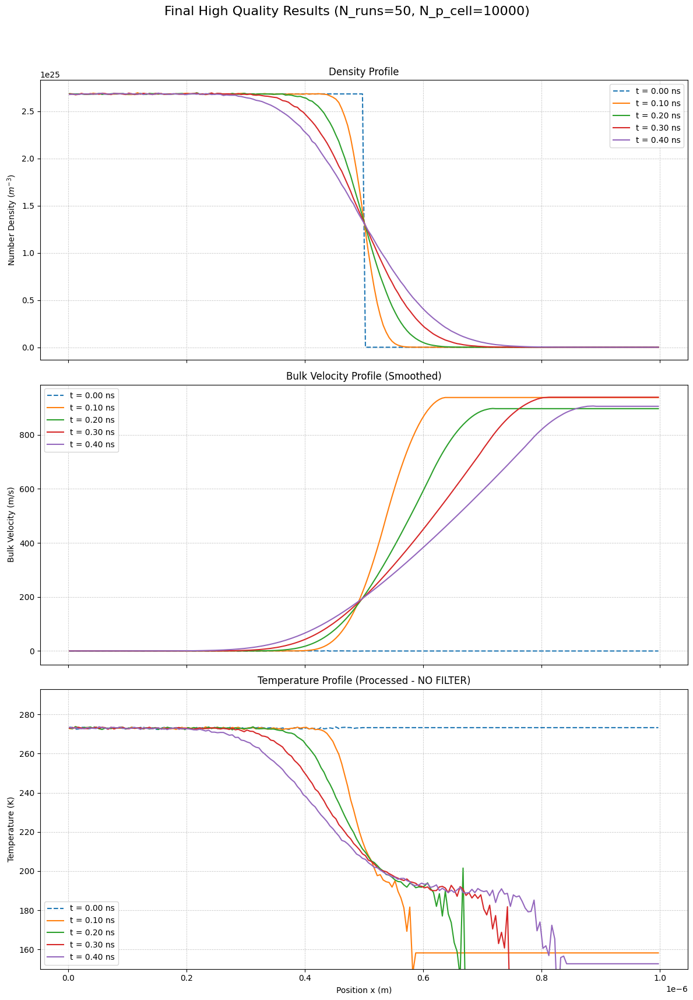

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V14 THE HONEST PLOTTER (Corrected) ---
# این نسخه اصلاحات پیشنهادی برای بهبود دقت پروفایل دما را اعمال می‌کند.
# تغییرات اصلی: افزایش ذرات اولیه و کاهش حداقل ذرات برای آمارگیری.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با پارامترهای اصلاح‌شده)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']

    # ✅ CHANGE 1: کاهش حداقل ذرات مورد نیاز برای آمارگیری (پیشنهاد شما)
    MIN_PARTICLES_FOR_STATS = 5

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                # اطمینان از اینکه دما منفی نمی‌شود (در موارد نویز شدید با ذرات کم)
                if thermal_vel_sq > 0 and num_in_cell > 1:
                    temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        # ✅ CHANGE 2: افزایش تعداد ذرات برای بهبود کیفیت آماری (پیشنهاد شما)
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای اجرای نهایی این عدد را روی 50 یا بالاتر تنظیم کنید
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی: بدون تغییر
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت: استفاده از روش موفق قبلی (interpolate -> fillna -> savgol)
        s_vel = pd.Series(data['velocity'])
        s_vel_interpolated = s_vel.interpolate(method='linear')
        s_vel_filled = s_vel_interpolated.fillna(0.0)
        vel_continuous = s_vel_filled.to_numpy()
        if t > 0.0:
            vel_smoothed = savgol_filter(vel_continuous, window_length=21, polyorder=1)
            axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        else:
            axes[1].plot(cell_centers, vel_continuous, linestyle=line_style, label=label_text)

        # ۳. دما: حداقل پردازش (interpolate -> ffill) و بدون فیلتر هموارساز
        s_temp = pd.Series(data['temperature'])
        # از متد backfill برای پر کردن NaN های ابتدای آرایه و ffill برای انتهای آن استفاده می‌کنیم
        s_temp_processed = s_temp.interpolate(method='linear').bfill().ffill().fillna(SIMULATION_PARAMS['T_INIT'])
        temp_continuous = s_temp_processed.to_numpy()
        axes[2].plot(cell_centers, temp_continuous, linestyle=line_style, label=label_text)
        axes[2].set_title('Temperature Profile (Processed - NO FILTER)')


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)');
    axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v14_corrected_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با نمونه‌برداری هوشمند (تعداد اجرا: 30) ---
--- اجرای 1/30 تمام شد ---
--- اجرای 2/30 تمام شد ---
--- اجرای 3/30 تمام شد ---
--- اجرای 4/30 تمام شد ---
--- اجرای 5/30 تمام شد ---
--- اجرای 6/30 تمام شد ---
--- اجرای 7/30 تمام شد ---
--- اجرای 8/30 تمام شد ---
--- اجرای 9/30 تمام شد ---
--- اجرای 10/30 تمام شد ---
--- اجرای 11/30 تمام شد ---
--- اجرای 12/30 تمام شد ---
--- اجرای 13/30 تمام شد ---
--- اجرای 14/30 تمام شد ---
--- اجرای 15/30 تمام شد ---
--- اجرای 16/30 تمام شد ---
--- اجرای 17/30 تمام شد ---
--- اجرای 18/30 تمام شد ---
--- اجرای 19/30 تمام شد ---
--- اجرای 20/30 تمام شد ---
--- اجرای 21/30 تمام شد ---
--- اجرای 22/30 تمام شد ---
--- اجرای 23/30 تمام شد ---
--- اجرای 24/30 تمام شد ---
--- اجرای 25/30 تمام شد ---
--- اجرای 26/30 تمام شد ---
--- اجرای 27/30 تمام شد ---
--- اجرای 28/30 تمام شد ---
--- اجرای 29/30 تمام شد ---
--- اجرای 30/30 تمام شد ---


/tmp/ipython-input-1-1651102687.py:169: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-1-1651102687.py:170: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


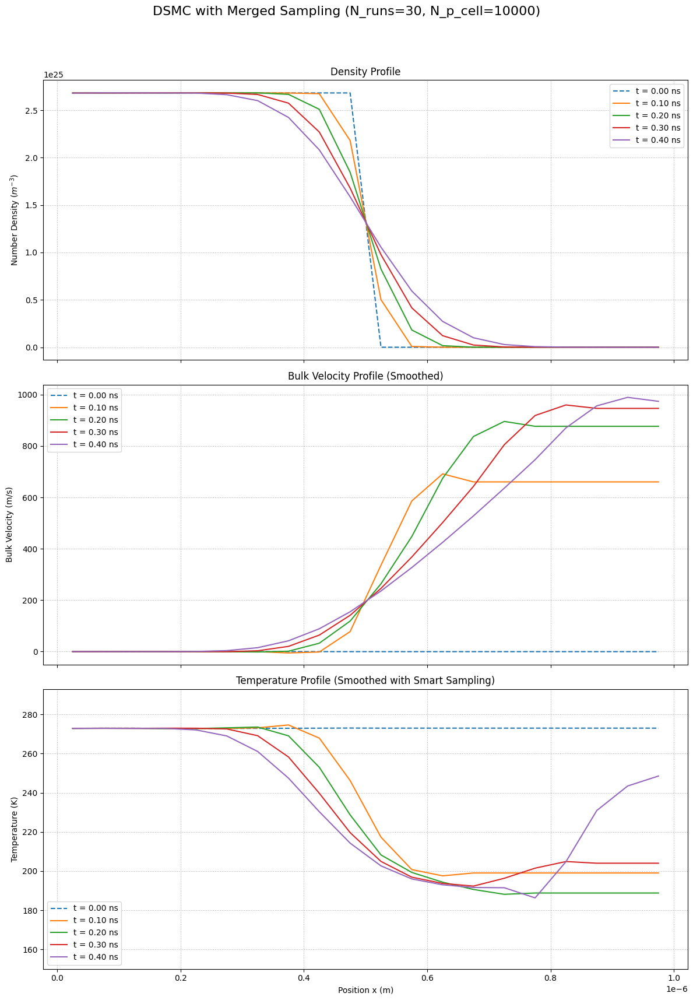

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V15 SMART SAMPLING ---
# این نسخه از تکنیک ادغام سلول‌ها برای نمونه‌برداری استفاده می‌کند تا کیفیت آماری دما را به طور بنیادی بهبود بخشد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 10 # می‌توان این را کمی بالاتر برد چون سلول‌های نمونه‌برداری بزرگترند

    # ✅ NEW: تعریف ضریب ادغام سلول برای نمونه برداری
    SAMPLING_CELL_MERGE_FACTOR = 10  # هر ۱۰ سلول برخورد، یک سلول نمونه‌برداری می‌شود
    NUM_SAMPLING_CELLS = NUM_CELLS_X // SAMPLING_CELL_MERGE_FACTOR

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles

    particles = initialize_gas_expansion()
    results_history = {}
    collision_cell_width = LX / NUM_CELLS_X

    # ✅ NEW: تابع نمونه‌برداری جدید بر اساس سلول‌های ادغام‌شده
    def sample_properties_merged(particles_state):
        density_profile = np.zeros(NUM_SAMPLING_CELLS)
        velocity_profile = np.full(NUM_SAMPLING_CELLS, np.nan)
        temp_profile = np.full(NUM_SAMPLING_CELLS, np.nan)

        collision_cell_indices = (particles_state[:, 0] / collision_cell_width).astype(np.int64)
        collision_cell_indices = np.clip(collision_cell_indices, 0, NUM_CELLS_X - 1)

        sampling_cell_indices = (collision_cell_indices // SAMPLING_CELL_MERGE_FACTOR).astype(np.int64)

        sorted_particle_indices = np.argsort(sampling_cell_indices)
        sampling_cell_counts = np.bincount(sampling_cell_indices, minlength=NUM_SAMPLING_CELLS)
        sampling_cell_starts = np.concatenate(([0], np.cumsum(sampling_cell_counts[:-1])))

        sampling_cell_volume = CELL_VOLUME_CONCEPTUAL * SAMPLING_CELL_MERGE_FACTOR

        for i in range(NUM_SAMPLING_CELLS):
            start = sampling_cell_starts[i]; end = start + sampling_cell_counts[i]
            indices_in_sampling_cell = sorted_particle_indices[start:end]
            num_in_cell = len(indices_in_sampling_cell)

            if num_in_cell > 0:
                density_profile[i] = num_in_cell * FNUM / sampling_cell_volume
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_sampling_cell, 1:4]
                mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                if thermal_vel_sq > 0 and num_in_cell > 1:
                    temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)

        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    results_history[0.0] = sample_properties_merged(particles)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / collision_cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))

        # برخوردها همچنان در شبکه ریز انجام می‌شوند
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            # ✅ NEW: فراخوانی تابع نمونه‌برداری جدید
            results_history[step * DT] = sample_properties_merged(particles)

    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000, # همچنان بالا نگه می‌داریم
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 30

    print(f"--- شروع اجرای نهایی با نمونه‌برداری هوشمند (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # ✅ NEW: محاسبه مراکز سلول‌های نمونه‌برداری (درشت)
    SAMPLING_CELL_MERGE_FACTOR = 10 # باید با مقدار داخل تابع یکی باشد
    NUM_SAMPLING_CELLS = SIMULATION_PARAMS['NUM_CELLS_X'] // SAMPLING_CELL_MERGE_FACTOR
    sampling_cell_width = (SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']) * SAMPLING_CELL_MERGE_FACTOR
    cell_centers = (np.arange(NUM_SAMPLING_CELLS) + 0.5) * sampling_cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Merged Sampling (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # ۲. سرعت
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=5, polyorder=2) # پنجره کوچکتر چون نقاط داده کمتر است
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # ۳. دما: اکنون با داده‌های بسیار باکیفیت‌تر، یک فیلتر ملایم نتیجه عالی خواهد داد
        s_temp = pd.Series(data['temperature']).interpolate(method='slinear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=5, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed with Smart Sampling)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v15_smart_sampling_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام

/tmp/ipython-input-3-949090056.py:218: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-3-949090056.py:219: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


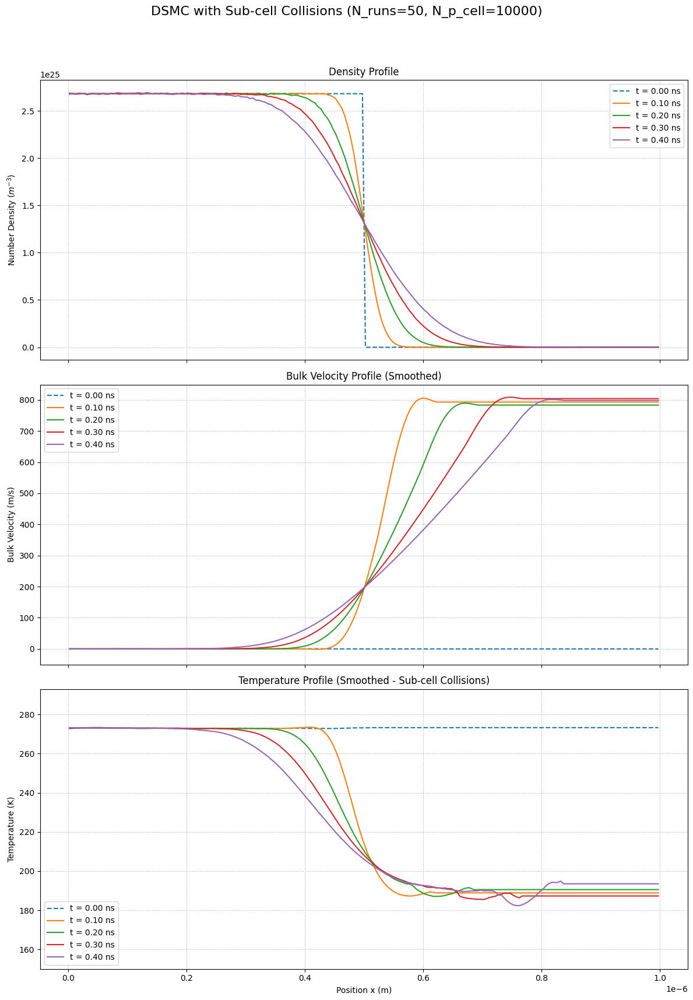

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.1 SUB-CELL COLLISION (FIXED) ---
# این نسخه خطای تطابق نوع داده (AssertionError) در کتابخانه Numba را برطرف می‌کند.
# برخوردها در زیرسلول‌ها انجام می‌شود تا دقت فیزیکی افزایش یابد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با تابع برخورد اصلاح‌شده)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند تا نیاز به پاس دادن آن‌ها نباشد
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533 # For omega = 0.81, Gamma(2.5 - 0.81) = Gamma(1.69)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# تابع برخورد که بر اساس زیرسلول کار می‌کند
@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    # 1. ذرات را در زیرسلول‌های خود دسته‌بندی کن
    sub_cell_width = cell_width / num_sub_cells

    # ✅ FIX: نوع داده به np.int64 تغییر کرد تا با نوع ایندکس‌های ورودی (که از argsort می‌آیند) مطابقت داشته باشد
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    # 2. برخوردها را در هر زیرسلول به صورت جداگانه انجام بده
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    # فرض یک حجم سه بعدی برای محاسبه FNUM
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    # برای بهینه‌سازی، از bincount برای شمارش و argsort برای دسته‌بندی استفاده می‌کنیم
    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_1_subcell_result.png", dpi=300)
    plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V17 HIGH-QUALITY RESULTS ---
# این نسخه نهایی، پارامترهای آماری را برای رسیدن به بالاترین کیفیت و حذف آرتیفکت‌های جزئی افزایش می‌دهد.
# الگوریتم برخورد زیرسلولی حفظ شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر در الگوریتم)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        # ✅ افزایش تعداد ذرات برای بهبود آمار در نواحی کم‌تراکم
        'PARTICLES_PER_CELL_INIT': 15000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    # ✅ افزایش تعداد اجراها برای میانگین‌گیری بهتر و حذف نهایی نویز آماری
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        # استفاده از دانه تصادفی متفاوت برای هر اجرا جهت استقلال آماری
        np.random.seed(int(time.time() * 1000) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. زمان سپری شده: {time.time() - start_time_total:.1f} ثانیه ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC High-Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. چگالی
        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        # ۲. سرعت
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        # فیلتر ملایم برای نمایش روند اصلی
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # ۳. دما
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        # استفاده از پنجره کمی بزرگتر برای هموارسازی نهایی دمای با کیفیت بالا
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=31, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v17_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 100) ---


ValueError: Seed must be between 0 and 2**32 - 1

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 100) ---
--- اجرای 1/100 تمام شد. زمان سپری شده: 16.6 ثانیه ---
--- اجرای 2/100 تمام شد. زمان سپری شده: 29.5 ثانیه ---
--- اجرای 3/100 تمام شد. زمان سپری شده: 43.4 ثانیه ---
--- اجرای 4/100 تمام شد. زمان سپری شده: 56.1 ثانیه ---
--- اجرای 5/100 تمام شد. زمان سپری شده: 68.6 ثانیه ---
--- اجرای 6/100 تمام شد. زمان سپری شده: 80.3 ثانیه ---
--- اجرای 7/100 تمام شد. زمان سپری شده: 91.6 ثانیه ---
--- اجرای 8/100 تمام شد. زمان سپری شده: 103.4 ثانیه ---
--- اجرای 9/100 تمام شد. زمان سپری شده: 115.1 ثانیه ---
--- اجرای 10/100 تمام شد. زمان سپری شده: 127.4 ثانیه ---
--- اجرای 11/100 تمام شد. زمان سپری شده: 139.6 ثانیه ---
--- اجرای 12/100 تمام شد. زمان سپری شده: 150.8 ثانیه ---
--- اجرای 13/100 تمام شد. زمان سپری شده: 161.8 ثانیه ---
--- اجرای 14/100 تمام شد. زمان سپری شده: 173.9 ثانیه ---
--- اجرای 15/100 تمام شد. زمان سپری شده: 185.9 ثانیه ---
--- اجرای 16/100 تمام شد. زمان سپری شده: 198.0 ثانیه ---
--- اجرای 17/100 تمام شد. زمان سپری شده: 209.6 

/tmp/ipython-input-5-4126845533.py:215: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-5-4126845533.py:216: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


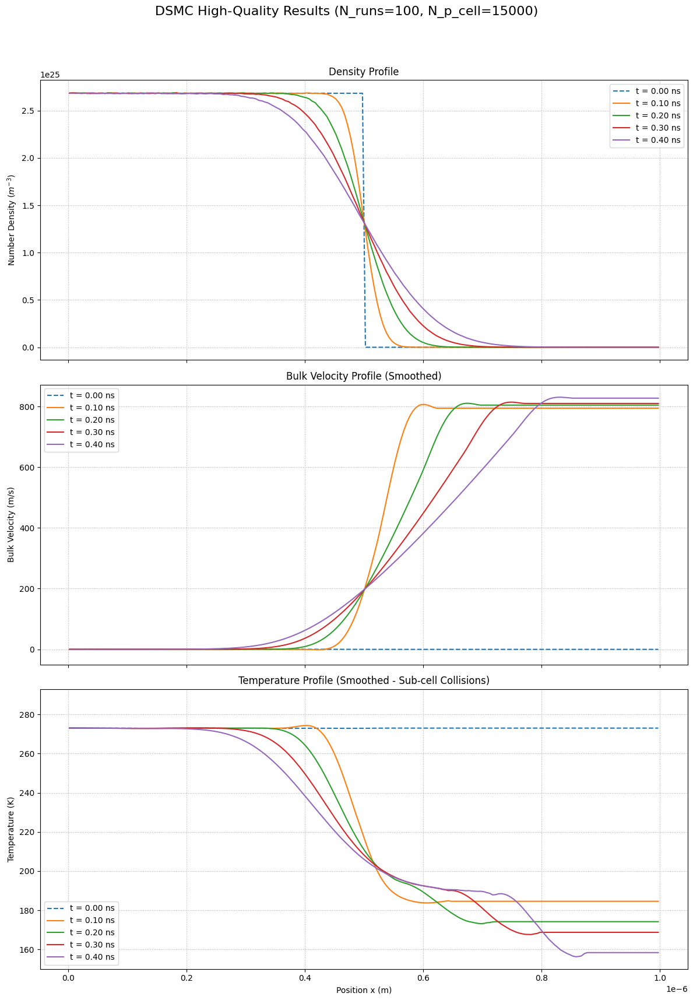

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V17.1 HIGH-QUALITY RESULTS (SEED FIXED) ---
# این نسخه خطای مربوط به مقدار بزرگ دانه تصادفی (random seed) را برطرف می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر در الگوریتم)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 15000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    # ✅ FIX: مقدار دانه تصادفی در محدوده مجاز (۳۲ بیتی) نگه داشته می‌شود
    max_seed_value = 2**32 - 1

    for i in range(NUM_ENSEMBLE_RUNS):
        # با استفاده از عملگر باقی‌مانده (%)، از بزرگ شدن بیش از حد دانه جلوگیری می‌کنیم
        seed_value = (int(time.time() * 1000) + i) % max_seed_value
        np.random.seed(seed_value)

        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. زمان سپری شده: {time.time() - start_time_total:.1f} ثانیه ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC High-Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=31, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v17_1_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل فیزیکی صحیح (تعداد اجرا: 100) ---
--- اجرای 1/100 تمام شد. زمان سپری شده: 15.6 ثانیه ---
--- اجرای 2/100 تمام شد. زمان سپری شده: 30.4 ثانیه ---
--- اجرای 3/100 تمام شد. زمان سپری شده: 44.5 ثانیه ---
--- اجرای 4/100 تمام شد. زمان سپری شده: 58.0 ثانیه ---
--- اجرای 5/100 تمام شد. زمان سپری شده: 72.7 ثانیه ---
--- اجرای 6/100 تمام شد. زمان سپری شده: 87.6 ثانیه ---
--- اجرای 7/100 تمام شد. زمان سپری شده: 102.4 ثانیه ---
--- اجرای 8/100 تمام شد. زمان سپری شده: 116.5 ثانیه ---
--- اجرای 9/100 تمام شد. زمان سپری شده: 131.1 ثانیه ---
--- اجرای 10/100 تمام شد. زمان سپری شده: 145.7 ثانیه ---
--- اجرای 11/100 تمام شد. زمان سپری شده: 160.5 ثانیه ---
--- اجرای 12/100 تمام شد. زمان سپری شده: 174.5 ثانیه ---
--- اجرای 13/100 تمام شد. زمان سپری شده: 188.2 ثانیه ---
--- اجرای 14/100 تمام شد. زمان سپری شده: 202.5 ثانیه ---
--- اجرای 15/100 تمام شد. زمان سپری شده: 217.5 ثانیه ---
--- اجرای 16/100 تمام شد. زمان سپری شده: 232.0 ثانیه ---
--- اجرای 17/100 تمام شد. زمان سپری شده: 

/tmp/ipython-input-6-1904994756.py:227: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-6-1904994756.py:228: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


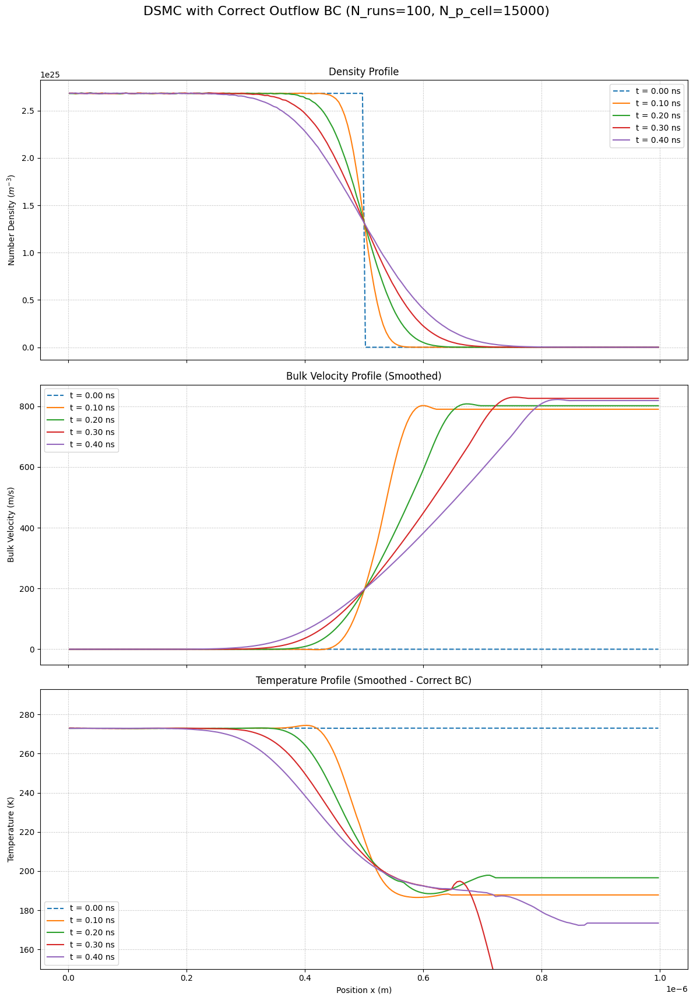

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V18 FINAL PHYSICAL MODEL ---
# این نسخه شرط مرزی سمت راست را به خروجی (outflow) تغییر می‌دهد تا بازتاب مصنوعی ذرات حذف شود.
# این تغییر باید آرتیفکت‌های نهایی دما و سرعت را برطرف کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با شرط مرزی اصلاح‌شده)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        # شرط مرزی بازتابنده آینه‌ای در دیواره چپ
        hit_left = particles[:, 0] < 0
        particles[hit_left, 1] *= -1
        particles[hit_left, 0] *= -1

        # ✅ FIX: شرط مرزی خروجی (outflow) در دیواره راست
        # ذراتی که از دامنه خارج می‌شوند، حذف می‌گردند.
        keep_mask = particles[:, 0] <= LX
        particles = particles[keep_mask]

        # ادامه محاسبات با ذرات باقی‌مانده
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    # این تابع بدون تغییر باقی می‌ماند
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    if len(particles_state) == 0: # اگر هیچ ذره‌ای نمانده باشد
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 15000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با مدل فیزیکی صحیح (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    max_seed_value = 2**32 - 1

    for i in range(NUM_ENSEMBLE_RUNS):
        seed_value = (int(time.time() * 1000) + i) % max_seed_value
        np.random.seed(seed_value)

        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. زمان سپری شده: {time.time() - start_time_total:.1f} ثانیه ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Correct Outflow BC (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=31, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Correct BC)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v18_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با نمونه‌برداری هوشمند (تعداد اجرا: 100) ---
--- اجرای 1/100 تمام شد. ---
--- اجرای 2/100 تمام شد. ---
--- اجرای 3/100 تمام شد. ---
--- اجرای 4/100 تمام شد. ---
--- اجرای 5/100 تمام شد. ---
--- اجرای 6/100 تمام شد. ---
--- اجرای 7/100 تمام شد. ---
--- اجرای 8/100 تمام شد. ---
--- اجرای 9/100 تمام شد. ---
--- اجرای 10/100 تمام شد. ---
--- اجرای 11/100 تمام شد. ---
--- اجرای 12/100 تمام شد. ---
--- اجرای 13/100 تمام شد. ---
--- اجرای 14/100 تمام شد. ---
--- اجرای 15/100 تمام شد. ---
--- اجرای 16/100 تمام شد. ---
--- اجرای 17/100 تمام شد. ---
--- اجرای 18/100 تمام شد. ---
--- اجرای 19/100 تمام شد. ---
--- اجرای 20/100 تمام شد. ---
--- اجرای 21/100 تمام شد. ---
--- اجرای 22/100 تمام شد. ---
--- اجرای 23/100 تمام شد. ---
--- اجرای 24/100 تمام شد. ---
--- اجرای 25/100 تمام شد. ---
--- اجرای 26/100 تمام شد. ---
--- اجرای 27/100 تمام شد. ---
--- اجرای 28/100 تمام شد. ---
--- اجرای 29/100 تمام شد. ---
--- اجرای 30/100 تمام شد. ---
--- اجرای 31/100 تمام شد. ---
--- اجرای 32/

/tmp/ipython-input-8-305539725.py:211: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-8-305539725.py:212: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


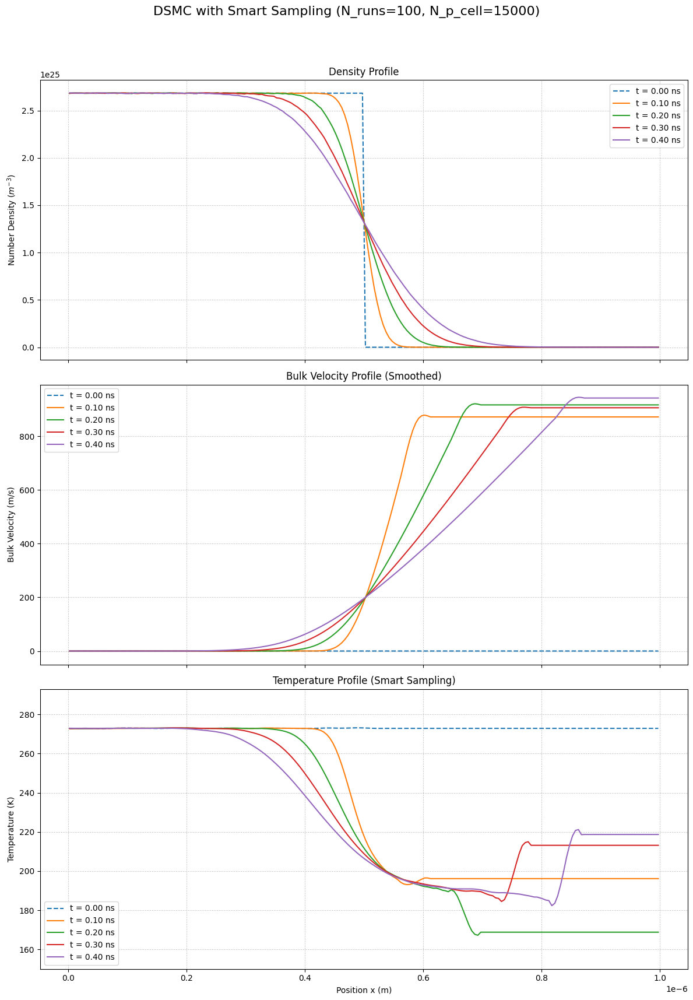

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V19.1 SMART SAMPLING (LOOP FIXED) ---
# This version fixes a critical bug in the main simulation loop that caused a Numba TypingError.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با حلقه اصلی اصلاح‌شده)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23; kb = 1.380649e-23
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag*sin_chi*np.cos(phi_chi), vr_mag*sin_chi*np.sin(phi_chi), vr_mag*cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = sim_params['MIN_PARTICLES_FOR_STATS']
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    SAMPLING_WINDOW_HALFWIDTH = sim_params['SAMPLING_WINDOW_HALFWIDTH']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties_moving_window(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS, SAMPLING_WINDOW_HALFWIDTH)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0
        particles[hit_left, 1] *= -1
        particles[hit_left, 0] *= -1

        keep_mask = particles[:, 0] <= LX
        particles = particles[keep_mask]
        if len(particles) == 0: continue

        # ✅ FIX: Restored the correct and efficient method for finding particles in each cell
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)

        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]
            end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end] # This is now an array of integer indices

            if len(indices_in_cell_i) == 0: continue

            cell_start_x = i * cell_width
            # The function call is now correct, passing integer indices
            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties_moving_window(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS, SAMPLING_WINDOW_HALFWIDTH)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties_moving_window(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts, half_width):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    if len(particles_state) == 0:
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

    particle_cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)

    for i in range(num_cells):
        start_cell = max(0, i - half_width)
        end_cell = min(num_cells - 1, i + half_width)

        window_mask = (particle_cell_indices >= start_cell) & (particle_cell_indices <= end_cell)
        indices_in_window = np.where(window_mask)[0]
        num_in_window = len(indices_in_window)

        local_mask = particle_cell_indices == i
        num_in_local_cell = np.sum(local_mask)
        if num_in_local_cell > 0:
            density_profile[i] = num_in_local_cell * fnum / cell_vol

        if num_in_window >= min_parts:
            window_velocities = particles_state[indices_in_window, 1:4]
            mean_vel_window = np.mean(window_velocities, axis=0)
            velocity_profile[i] = mean_vel_window[0]

            thermal_vel_sq = np.sum((window_velocities - mean_vel_window)**2)
            if num_in_window > 1:
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_window)

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 15000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6,
        'MIN_PARTICLES_FOR_STATS': 20,
        'SAMPLING_WINDOW_HALFWIDTH': 2
    }
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با نمونه‌برداری هوشمند (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    max_seed_value = 2**32 - 1

    for i in range(NUM_ENSEMBLE_RUNS):
        seed_value = (int(time.time() * 1000) + i) % max_seed_value
        np.random.seed(seed_value)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        valid_runs = [run[t] for run in all_results if run[t] is not None and len(run[t]['density']) > 0]
        if not valid_runs: continue

        all_densities = np.array([res['density'] for res in valid_runs])
        all_velocities = np.array([res['velocity'] for res in valid_runs])
        all_temperatures = np.array([res['temperature'] for res in valid_runs])

        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Smart Sampling (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sorted(averaged_results.keys()):
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=11, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=11, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smart Sampling)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v19_1_final_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با نمونه‌برداری درشت (ضریب: 3) ---
*** Starting Ensemble Run: 1 of 100 ***
  > Run 1: Simulating time step 1/80
  > Run 1: Simulating time step 20/80
  > Run 1: Simulating time step 40/80
  > Run 1: Simulating time step 60/80
  > Run 1: Simulating time step 80/80
--- Run 1/100 finished in 59.56 seconds. ---
*** Starting Ensemble Run: 2 of 100 ***
  > Run 2: Simulating time step 1/80
  > Run 2: Simulating time step 20/80
  > Run 2: Simulating time step 40/80
  > Run 2: Simulating time step 60/80
  > Run 2: Simulating time step 80/80
--- Run 2/100 finished in 30.60 seconds. ---
*** Starting Ensemble Run: 3 of 100 ***
  > Run 3: Simulating time step 1/80
  > Run 3: Simulating time step 20/80
  > Run 3: Simulating time step 40/80
  > Run 3: Simulating time step 60/80
  > Run 3: Simulating time step 80/80
--- Run 3/100 finished in 30.23 seconds. ---
*** Starting Ensemble Run: 4 of 100 ***
  > Run 4: Simulating time step 1/80
  > Run 4: Simulating time step 20/80
  > Run

/tmp/ipython-input-1-3416363708.py:176: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-1-3416363708.py:177: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


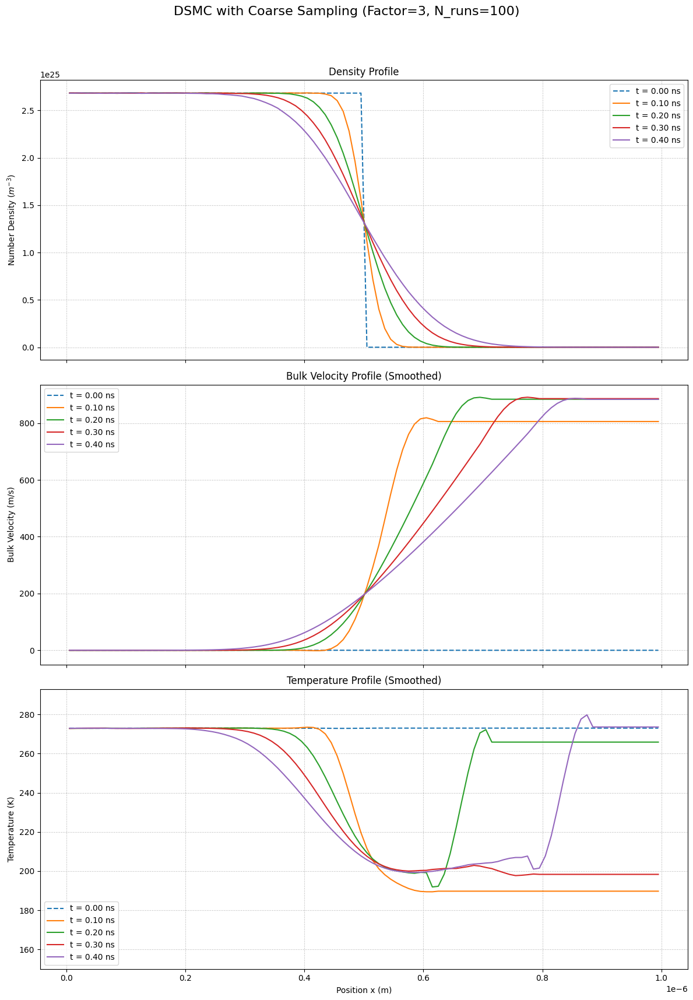

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.6 DETAILED PROGRESS REPORTING ---
# این نسخه گزارش پیشرفت را در داخل هر اجرای شبیه‌سازی نیز نمایش می‌دهد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با گزارش پیشرفت داخلی)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23; kb = 1.380649e-23
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local, idx2_local = np.random.randint(0, num_particles_in_sub_cell), np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p1_idx, p2_idx = indices_in_sub_cell[idx1_local], indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi, sin_chi = 2 * np.random.rand() - 1.0, np.sqrt(1 - (2 * np.random.rand() - 1.0)**2)
                phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- CHANGED: Added 'run_id' parameter for detailed printing ---
def run_dsmc_simulation(sim_params, run_id):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS, sim_params.get('SAMPLING_CELL_FACTOR', 1))
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        # --- NEW: Print progress inside the time-step loop ---
        if step % 20 == 0 or step == 1: # Print every 20 steps and on the very first step
            print(f"  > Run {run_id}: Simulating time step {step}/{NUM_STEPS}", flush=True)

        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, i * cell_width, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS, sim_params.get('SAMPLING_CELL_FACTOR', 1))
    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_sim_cells, sim_cell_width, fnum, sim_cell_vol, min_parts, factor):
    num_sampling_cells = num_sim_cells // factor
    sampling_cell_width = sim_cell_width * factor
    sampling_cell_vol = sim_cell_vol * factor
    density_profile = np.zeros(num_sampling_cells)
    velocity_profile = np.full(num_sampling_cells, np.nan)
    temp_profile = np.full(num_sampling_cells, np.nan)
    sampling_cell_indices = (particles_state[:, 0] / sampling_cell_width).astype(np.int64)
    sampling_cell_indices = np.clip(sampling_cell_indices, 0, num_sampling_cells - 1)
    for i in range(num_sampling_cells):
        indices_in_cell_i = np.where(sampling_cell_indices == i)[0]
        num_in_cell = len(indices_in_cell_i)
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / sampling_cell_vol
        if num_in_cell >= min_parts:
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 300,
        'PARTICLES_PER_CELL_INIT': 15000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 10,
        'SAMPLING_CELL_FACTOR': 3
    }
    NUM_ENSEMBLE_RUNS = 100

    print(f"--- شروع اجرای نهایی با نمونه‌برداری درشت (ضریب: {SIMULATION_PARAMS['SAMPLING_CELL_FACTOR']}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        print(f"*** Starting Ensemble Run: {i+1} of {NUM_ENSEMBLE_RUNS} ***", flush=True)
        run_start_time = time.time()

        np.random.seed(int(time.time()) + i)
        # --- CHANGED: Pass the run number to the simulation function ---
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS, run_id=i+1)
        all_results.append(single_run_history)

        run_end_time = time.time()
        print(f"--- Run {i+1}/{NUM_ENSEMBLE_RUNS} finished in {run_end_time - run_start_time:.2f} seconds. ---", flush=True)

    # ... بقیه کد برای میانگین‌گیری و رسم نمودار بدون تغییر باقی می‌ماند ...
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    sampling_factor = SIMULATION_PARAMS.get('SAMPLING_CELL_FACTOR', 1)
    num_sampling_cells = SIMULATION_PARAMS['NUM_CELLS_X'] // sampling_factor
    sim_cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    sampling_cell_width = sim_cell_width * sampling_factor
    cell_centers = (np.arange(num_sampling_cells) + 0.5) * sampling_cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Coarse Sampling (Factor={sampling_factor}, N_runs={NUM_ENSEMBLE_RUNS})", fontsize=16)

    win_len = 11
    if win_len > num_sampling_cells: win_len = num_sampling_cells - 1 if (num_sampling_cells-1)%2!=0 else num_sampling_cells - 2
    if win_len < 3: win_len = 3

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=win_len, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=win_len, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_3_coarse_sampling_result.png", dpi=300)
    plt.savefig("dsmc_v16_3_coarse_sampling_result.eps", format='eps')
    plt.show()

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 200) ---
!!! هشدار: این فرآیند بسیار زمان‌بر خواهد بود. لطفاً صبور باشید. !!!
*** Starting Ensemble Run: 1 of 200 ***
--- Run 1/200 finished in 22.81 seconds. ---
*** Starting Ensemble Run: 2 of 200 ***
--- Run 2/200 finished in 15.61 seconds. ---
*** Starting Ensemble Run: 3 of 200 ***
--- Run 3/200 finished in 13.73 seconds. ---
*** Starting Ensemble Run: 4 of 200 ***
--- Run 4/200 finished in 10.13 seconds. ---
*** Starting Ensemble Run: 5 of 200 ***
--- Run 5/200 finished in 9.72 seconds. ---
*** Starting Ensemble Run: 6 of 200 ***
--- Run 6/200 finished in 10.01 seconds. ---
*** Starting Ensemble Run: 7 of 200 ***
--- Run 7/200 finished in 10.43 seconds. ---
*** Starting Ensemble Run: 8 of 200 ***
--- Run 8/200 finished in 10.39 seconds. ---
*** Starting Ensemble Run: 9 of 200 ***
--- Run 9/200 finished in 10.21 seconds. ---
*** Starting Ensemble Run: 10 of 200 ***
--- Run 10/200 finished in 10.21 seconds. ---
*** Starting Ensemble R

/tmp/ipython-input-2-3478239491.py:224: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-2-3478239491.py:225: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


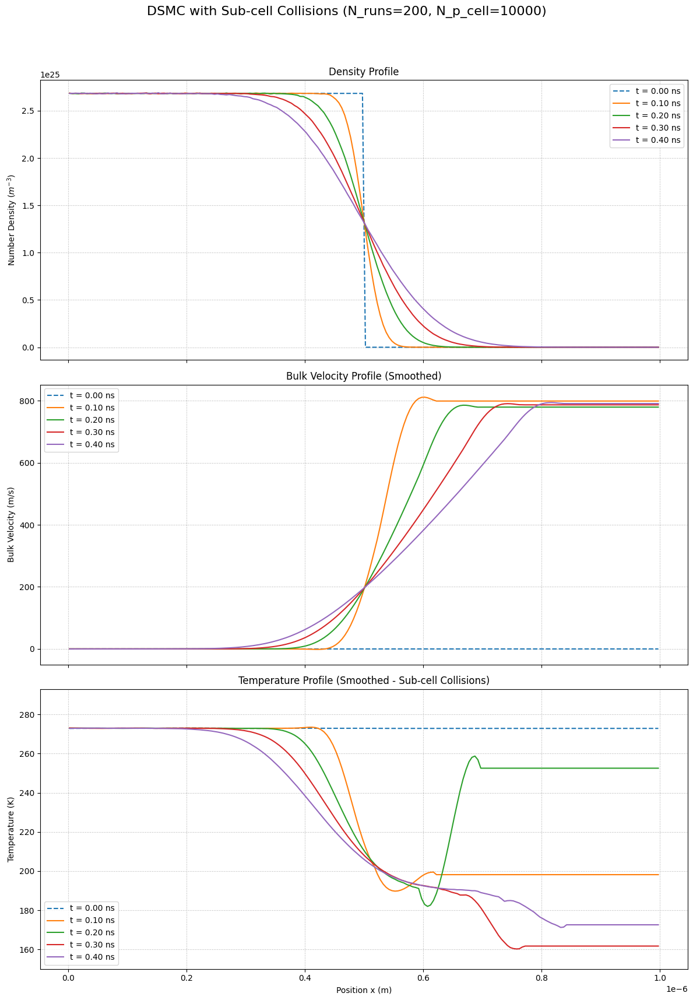

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V17.0 FINAL HIGH-QUALITY ENSEMBLE ---
# بر اساس بهترین کد کاربر، با افزایش چشمگیر تعداد اجراها برای رسیدن به بالاترین دقت.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بر اساس کد اصلی و بدون تغییر در منطق)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند تا نیاز به پاس دادن آن‌ها نباشد
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533 # For omega = 0.81, Gamma(2.5 - 0.81) = Gamma(1.69)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# تابع برخورد که بر اساس زیرسلول کار می‌کند
@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    # 1. ذرات را در زیرسلول‌های خود دسته‌بندی کن
    sub_cell_width = cell_width / num_sub_cells

    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    # 2. برخوردها را در هر زیرسلول به صورت جداگانه انجام بده
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    # پارامترهای اصلی شبیه‌سازی از کد مبنای کاربر
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    # --- CHANGED: The ONLY change is increasing the number of ensemble runs ---
    NUM_ENSEMBLE_RUNS = 200

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")
    print("!!! هشدار: این فرآیند بسیار زمان‌بر خواهد بود. لطفاً صبور باشید. !!!")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        print(f"*** Starting Ensemble Run: {i+1} of {NUM_ENSEMBLE_RUNS} ***", flush=True)
        run_start_time = time.time()

        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)

        run_end_time = time.time()
        print(f"--- Run {i+1}/{NUM_ENSEMBLE_RUNS} finished in {run_end_time - run_start_time:.2f} seconds. ---", flush=True)

    print(f"\nTotal execution time: {(time.time() - start_time_total)/3600:.2f} hours")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save both PNG and EPS formats
    plt.savefig("dsmc_v17_final_result.png", dpi=300)
    plt.savefig("dsmc_v17_final_result.eps", format='eps')

    plt.show()

--- شروع اجرای نهایی با مدل برخورد SBT بهینه شده (O(N)) (تعداد اجرا: 20) ---
--- اجرای 1/20 تمام شد ---
--- اجرای 2/20 تمام شد ---
--- اجرای 3/20 تمام شد ---
--- اجرای 4/20 تمام شد ---
--- اجرای 5/20 تمام شد ---
--- اجرای 6/20 تمام شد ---
--- اجرای 7/20 تمام شد ---
--- اجرای 8/20 تمام شد ---
--- اجرای 9/20 تمام شد ---
--- اجرای 10/20 تمام شد ---
--- اجرای 11/20 تمام شد ---
--- اجرای 12/20 تمام شد ---
--- اجرای 13/20 تمام شد ---
--- اجرای 14/20 تمام شد ---
--- اجرای 15/20 تمام شد ---
--- اجرای 16/20 تمام شد ---
--- اجرای 17/20 تمام شد ---
--- اجرای 18/20 تمام شد ---
--- اجرای 19/20 تمام شد ---
--- اجرای 20/20 تمام شد ---


/tmp/ipython-input-1-3959730355.py:212: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-1-3959730355.py:213: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


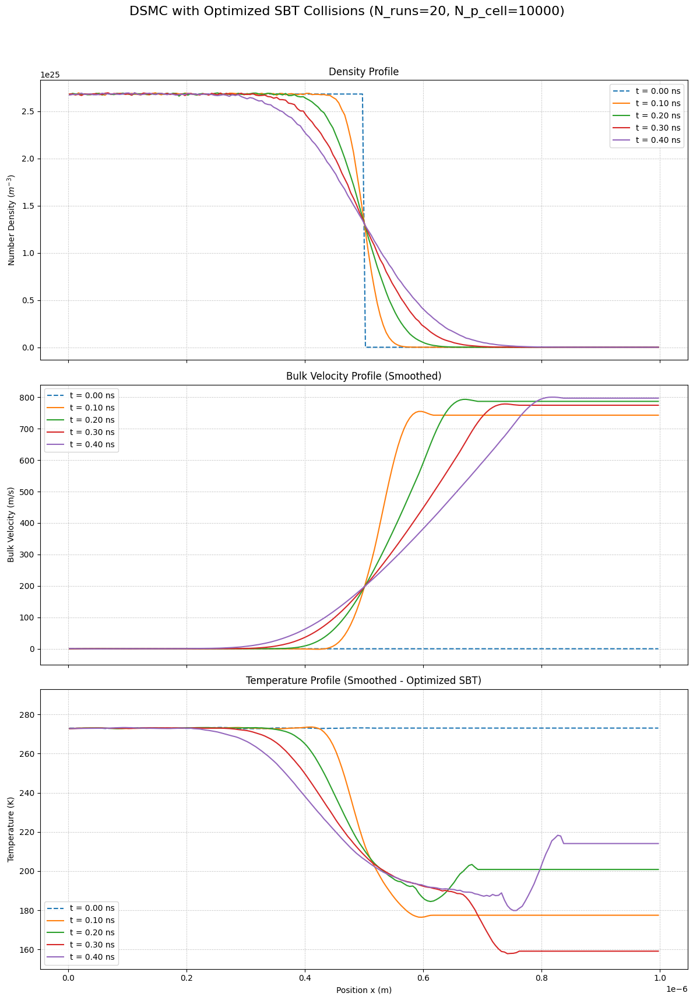

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V17.1 SBT COLLISION MODEL (OPTIMIZED) ---
# این نسخه مدل برخورد SBT را بر اساس الگوریتم بهینه استفانوف
# که توسط کاربر ارائه شد، اصلاح می‌کند. این روش بسیار سریع‌تر از
# نسخه ساده SBT است و هزینه محاسباتی O(N) دارد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (با تابع برخورد SBT بهینه‌شده)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# --- تابع برخورد جدید بر اساس مدل SBT بهینه شده (روش استفانوف) ---
@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    """
    برخوردها را با استفاده از الگوریتم بهینه SBT انجام می‌دهد.
    این روش تمام جفت‌ها را بررسی نمی‌کند و هزینه محاسباتی O(N) دارد.
    """
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    # حلقه روی ذره اول برخورد (i)
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]

        # انتخاب تصادفی ذره دوم (j) از میان ذرات باقی‌مانده در لیست
        # این کار جایگزین حلقه تو در تو می‌شود.
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]

        # محاسبه سرعت نسبی (g_ij در مقاله)
        vrx = particles[p1_idx, 1] - particles[p2_idx, 1]
        vry = particles[p1_idx, 2] - particles[p2_idx, 2]
        vrz = particles[p1_idx, 3] - particles[p2_idx, 3]
        vr_mag = np.sqrt(vrx**2 + vry**2 + vrz**2)

        if vr_mag < 1e-9:
            continue

        # محاسبه سطح مقطع برخورد (sigma_ij)
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)

        # محاسبه احتمال برخورد وزن‌دار بر اساس فرمول (51)
        # ضریب وزنی (N'-i) در اینجا همان remaining_particles_count است
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol

        # اگر عدد تصادفی کمتر از احتمال برخورد بود، برخورد را انجام بده
        if np.random.rand() < collision_prob:
            # محاسبه سرعت مرکز جرم
            vcm_x = 0.5 * (particles[p1_idx, 1] + particles[p2_idx, 1])
            vcm_y = 0.5 * (particles[p1_idx, 2] + particles[p2_idx, 2])
            vcm_z = 0.5 * (particles[p1_idx, 3] + particles[p2_idx, 3])

            # انتخاب جهت جدید پس از برخورد
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1.0 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()

            # محاسبه بردار سرعت نسبی جدید
            vr_prime_x = vr_mag * sin_chi * np.cos(phi_chi)
            vr_prime_y = vr_mag * sin_chi * np.sin(phi_chi)
            vr_prime_z = vr_mag * cos_chi

            # به‌روزرسانی سرعت‌های ذرات پس از برخورد
            particles[p1_idx, 1:4] = vcm_x + 0.5 * vr_prime_x, vcm_y + 0.5 * vr_prime_y, vcm_z + 0.5 * vr_prime_z
            particles[p2_idx, 1:4] = vcm_x - 0.5 * vr_prime_x, vcm_y - 0.5 * vr_prime_y, vcm_z - 0.5 * vr_prime_z


def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]

            # --- فراخوانی تابع برخورد SBT بهینه‌شده ---
            perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

# ... (سایر توابع initialize_gas_expansion, sample_properties و بخش رسم نمودار بدون تغییر باقی می‌مانند) ...

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    NUM_ENSEMBLE_RUNS = 20

    print(f"--- شروع اجرای نهایی با مدل برخورد SBT بهینه شده (O(N)) (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    # ... (بخش میانگین‌گیری و رسم نمودار بدون تغییر) ...
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Optimized SBT Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Optimized SBT)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v17_1_optimized_sbt_result.eps", dpi=300)
    plt.show()

--- شروع اجرای نهایی با نمونه‌برداری اصلاح‌شده (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 ت

/tmp/ipython-input-2-3936955271.py:191: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-2-3936955271.py:192: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


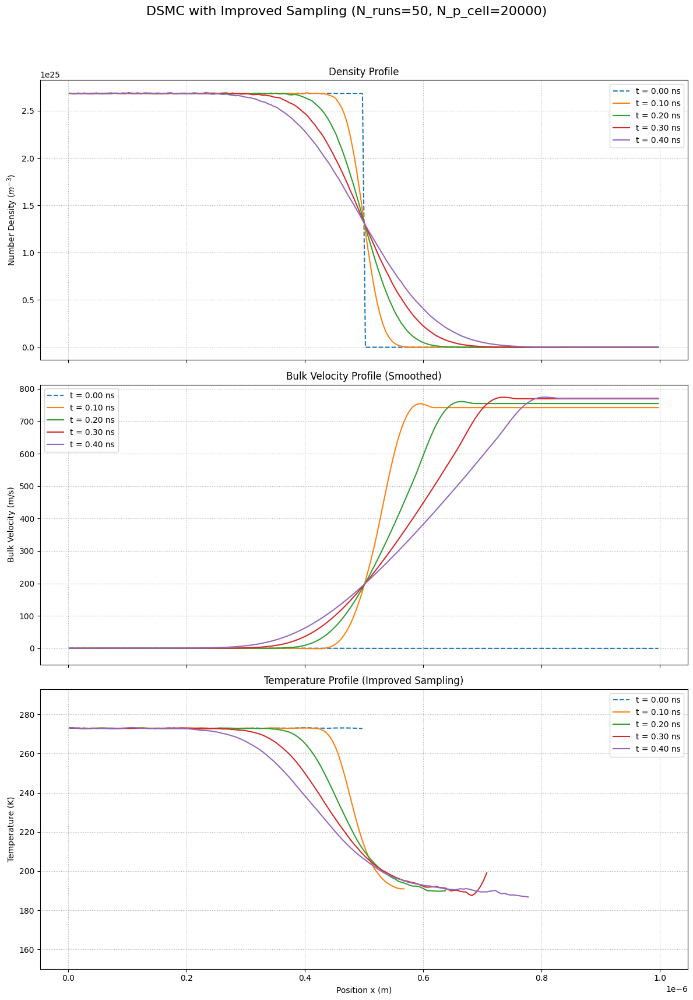

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V18.0 IMPROVED SAMPLING ---
# این نسخه اصلاحات مربوط به بهبود آمار و نمونه‌برداری را پیاده‌سازی می‌کند.
# 1. تعداد ذرات در هر سلول برای بهبود آمار افزایش یافته است.
# 2. حداقل تعداد ذرات برای محاسبه خواص آماری افزایش یافته است.
# 3. منطق رسم نمودار دما برای جلوگیری از آرتیفکت‌های آماری اصلاح شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]

        vrx = particles[p1_idx, 1] - particles[p2_idx, 1]
        vry = particles[p1_idx, 2] - particles[p2_idx, 2]
        vrz = particles[p1_idx, 3] - particles[p2_idx, 3]
        vr_mag = np.sqrt(vrx**2 + vry**2 + vrz**2)

        if vr_mag < 1e-9:
            continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol

        if np.random.rand() < collision_prob:
            vcm_x = 0.5 * (particles[p1_idx, 1] + particles[p2_idx, 1])
            vcm_y = 0.5 * (particles[p1_idx, 2] + particles[p2_idx, 2])
            vcm_z = 0.5 * (particles[p1_idx, 3] + particles[p2_idx, 3])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1.0 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime_x = vr_mag * sin_chi * np.cos(phi_chi)
            vr_prime_y = vr_mag * sin_chi * np.sin(phi_chi)
            vr_prime_z = vr_mag * cos_chi
            particles[p1_idx, 1:4] = vcm_x + 0.5 * vr_prime_x, vcm_y + 0.5 * vr_prime_y, vcm_z + 0.5 * vr_prime_z
            particles[p2_idx, 1:4] = vcm_x - 0.5 * vr_prime_x, vcm_y - 0.5 * vr_prime_y, vcm_z - 0.5 * vr_prime_z

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']

    # --- اصلاح شماره ۳ (بخش اول): افزایش حداقل ذرات برای آمارگیری ---
    MIN_PARTICLES_FOR_STATS = 50

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        # --- اصلاح شماره ۱: افزایش تعداد ذرات برای بهبود آمار ---
        'PARTICLES_PER_CELL_INIT': 20000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای نتایج بهتر، می‌توان این عدد را نیز افزایش داد
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با نمونه‌برداری اصلاح‌شده (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Improved Sampling (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # --- اصلاح شماره ۳ (بخش دوم): اصلاح منطق رسم نمودار دما ---
        s_temp = pd.Series(data['temperature'])
        # فقط داده‌های معتبر (غیر NaN) را برای هموارسازی و رسم انتخاب کن
        valid_indices = ~s_temp.isna()
        if np.sum(valid_indices) > 11: # اطمینان از وجود داده کافی برای فیلتر
            # پنجره فیلتر برای داده‌های کمتر، کوچکتر در نظر گرفته می‌شود
            temp_smoothed = savgol_filter(s_temp[valid_indices], window_length=11, polyorder=2)
            axes[2].plot(cell_centers[valid_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_indices) > 0: # اگر داده کافی برای فیلتر نیست، خام رسم کن
            axes[2].plot(cell_centers[valid_indices], s_temp[valid_indices], linestyle=line_style, label=label_text)


    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Improved Sampling)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v18_improved_sampling_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با تعداد ذرات بالا (50k) (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تم

/tmp/ipython-input-3-440148114.py:188: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-3-440148114.py:189: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


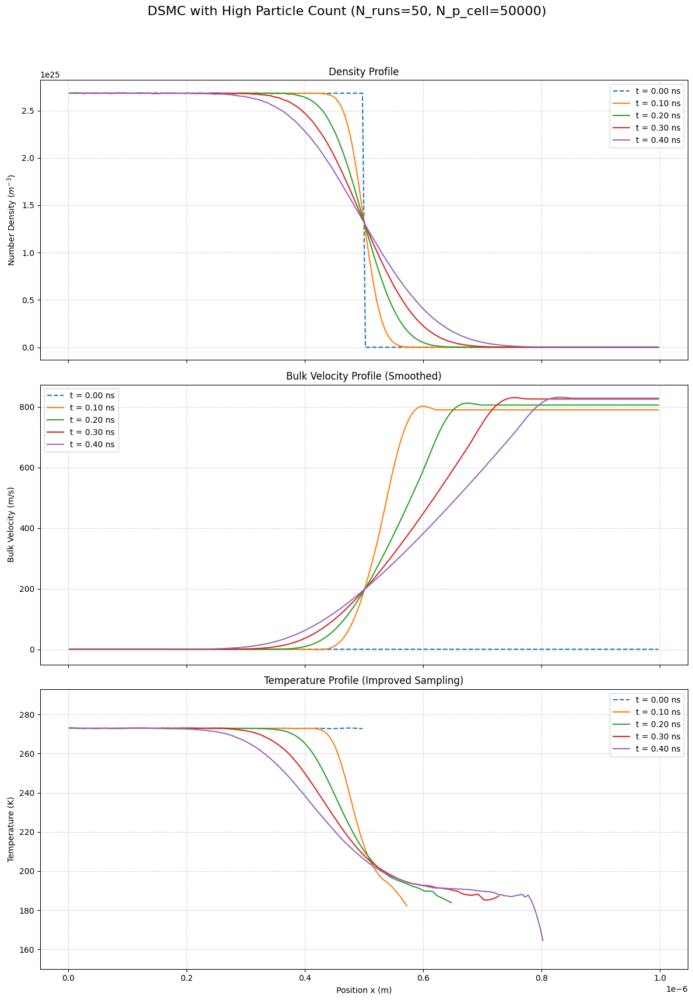

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V18.1 HIGHER PARTICLE COUNT ---
# این نسخه اصلاح شماره ۱ از پیشنهاد قبلی را پیاده‌سازی می‌کند:
# 1. تعداد ذرات در هر سلول برای بهبود بیشتر آمار به 50,000 افزایش یافته است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2:
        return

    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]

        vrx = particles[p1_idx, 1] - particles[p2_idx, 1]
        vry = particles[p1_idx, 2] - particles[p2_idx, 2]
        vrz = particles[p1_idx, 3] - particles[p2_idx, 3]
        vr_mag = np.sqrt(vrx**2 + vry**2 + vrz**2)

        if vr_mag < 1e-9:
            continue

        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol

        if np.random.rand() < collision_prob:
            vcm_x = 0.5 * (particles[p1_idx, 1] + particles[p2_idx, 1])
            vcm_y = 0.5 * (particles[p1_idx, 2] + particles[p2_idx, 2])
            vcm_z = 0.5 * (particles[p1_idx, 3] + particles[p2_idx, 3])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1.0 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime_x = vr_mag * sin_chi * np.cos(phi_chi)
            vr_prime_y = vr_mag * sin_chi * np.sin(phi_chi)
            vr_prime_z = vr_mag * cos_chi
            particles[p1_idx, 1:4] = vcm_x + 0.5 * vr_prime_x, vcm_y + 0.5 * vr_prime_y, vcm_z + 0.5 * vr_prime_z
            particles[p2_idx, 1:4] = vcm_x - 0.5 * vr_prime_x, vcm_y - 0.5 * vr_prime_y, vcm_z - 0.5 * vr_prime_z

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']

    MIN_PARTICLES_FOR_STATS = 50

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        # --- گزینه ۱: تعداد ذرات برای بهبود آمار به 50,000 افزایش یافت ---
        'PARTICLES_PER_CELL_INIT': 50000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای نتایج بهتر، می‌توان این عدد را نیز افزایش داد
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با تعداد ذرات بالا (50k) (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with High Particle Count (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature'])
        valid_indices = ~s_temp.isna()
        if np.sum(valid_indices) > 11:
            temp_smoothed = savgol_filter(s_temp[valid_indices], window_length=11, polyorder=2)
            axes[2].plot(cell_centers[valid_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_indices) > 0:
            axes[2].plot(cell_centers[valid_indices], s_temp[valid_indices], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Improved Sampling)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v18_1_high_particle_count_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل خلاء نسبی (تعداد اجرا: 50) ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 1/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 2/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 3/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 4/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 5/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/cell @ 273.0K
--- اجرای 6/50 تمام شد ---
Initialized 1100000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 1000 particles/ce

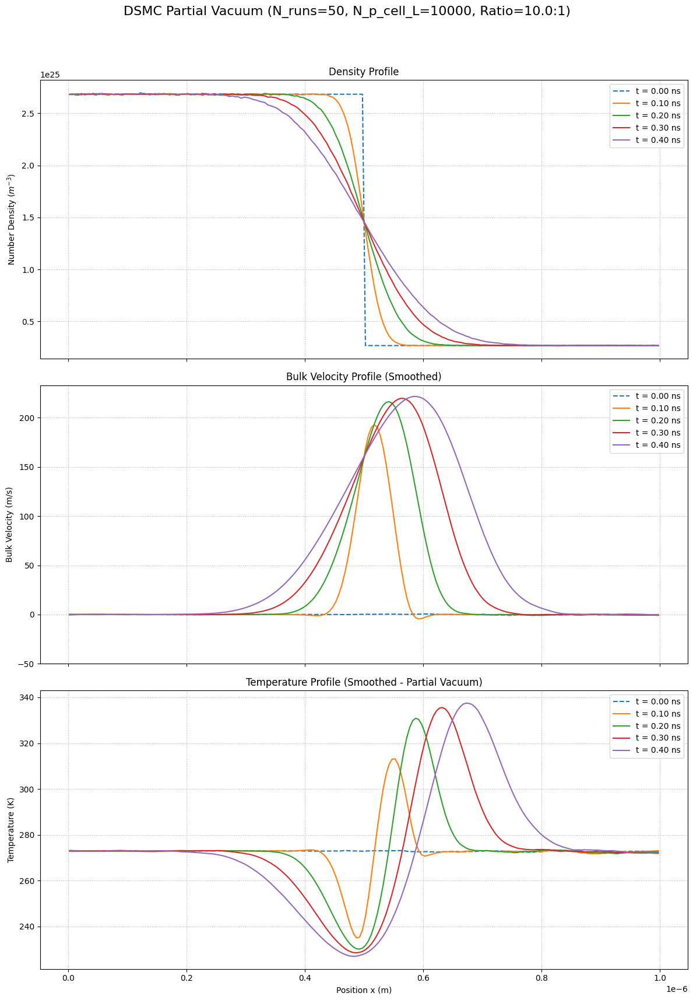

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.2 PARTIAL VACUUM ---
# این نسخه مسئله موج انبساطی را از خلاء کامل به خلاء نسبی تغییر می‌دهد.
# این کار با هدف بهبود پایداری آماری در سمت راست دامنه انجام شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع مقداردهی اولیه اصلاح شده برای خلاء نسبی ---
def initialize_gas_expansion(params):
    """Initializes particles for a two-region problem (e.g., partial vacuum)."""
    num_cells = params['NUM_CELLS_X']
    lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']
    t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']
    t_ratio = params['T_RATIO']

    t_right = t_left / t_ratio
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1 # حداقل یک ذره در هر سلول سمت راست باشد

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left

    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std_left = np.sqrt(KB * t_left / MASS_AR)
    v_thermal_std_right = np.sqrt(KB * t_right / MASS_AR)

    current_pos = 0
    # مقداردهی ناحیه چپ
    for i in range(num_cells_left):
        start_idx = current_pos
        end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_left, (ppc_left, 3))
        current_pos = end_idx

    # مقداردهی ناحیه راست
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos
        end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_right, (ppc_right, 3))
        current_pos = end_idx

    # اطمینان از صفر بودن تکانه کلی سیستم
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)

    print(f"Initialized {total_particles} particles.")
    print(f"Left side: {ppc_left} particles/cell @ {t_left}K")
    print(f"Right side: {ppc_right} particles/cell @ {t_right}K")
    return particles


def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    # مقداردهی اولیه
    particles = initialize_gas_expansion(sim_params)

    # محاسبه Fnum بر اساس سمت چپ (چگالی بالا)
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6,
        # --- پارامترهای جدید برای خلاء نسبی ---
        'RHO_RATIO': 10.0, # نسبت چگالی چپ به راست
        'T_RATIO': 1.0,    # نسبت دمای چپ به راست
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل خلاء نسبی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC Partial Vacuum (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell_L={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']}, Ratio={SIMULATION_PARAMS['RHO_RATIO']}:1)", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # در این مدل انتظار می‌رود پروفایل دما پایدارتر باشد
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Partial Vacuum)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    # ممکن است نیاز باشد محدوده دما را کمی تغییر دهید
    # axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_2_partial_vacuum_result.png", dpi=300)
    plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.2 PARTIAL VACUUM ---
# این نسخه مسئله موج انبساطی را از خلاء کامل به خلاء نسبی تغییر می‌دهد.
# این کار با هدف بهبود پایداری آماری در سمت راست دامنه انجام شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع مقداردهی اولیه اصلاح شده برای خلاء نسبی ---
def initialize_gas_expansion(params):
    """Initializes particles for a two-region problem (e.g., partial vacuum)."""
    num_cells = params['NUM_CELLS_X']
    lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']
    t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']
    t_ratio = params['T_RATIO']

    t_right = t_left / t_ratio
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1 # حداقل یک ذره در هر سلول سمت راست باشد

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left

    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std_left = np.sqrt(KB * t_left / MASS_AR)
    v_thermal_std_right = np.sqrt(KB * t_right / MASS_AR)

    current_pos = 0
    # مقداردهی ناحیه چپ
    for i in range(num_cells_left):
        start_idx = current_pos
        end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_left, (ppc_left, 3))
        current_pos = end_idx

    # مقداردهی ناحیه راست
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos
        end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_right, (ppc_right, 3))
        current_pos = end_idx

    # اطمینان از صفر بودن تکانه کلی سیستم
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)

    print(f"Initialized {total_particles} particles.")
    print(f"Left side: {ppc_left} particles/cell @ {t_left}K")
    print(f"Right side: {ppc_right} particles/cell @ {t_right}K")
    return particles


def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    # مقداردهی اولیه
    particles = initialize_gas_expansion(sim_params)

    # محاسبه Fnum بر اساس سمت چپ (چگالی بالا)
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6,
        # --- پارامترهای جدید برای خلاء نسبی ---
        'RHO_RATIO': 5.0, # نسبت چگالی چپ به راست
        'T_RATIO': 1.0,    # نسبت دمای چپ به راست
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل خلاء نسبی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC Partial Vacuum (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell_L={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']}, Ratio={SIMULATION_PARAMS['RHO_RATIO']}:1)", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # در این مدل انتظار می‌رود پروفایل دما پایدارتر باشد
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Partial Vacuum)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    # ممکن است نیاز باشد محدوده دما را کمی تغییر دهید
    # axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_2_partial_vacuum_result.png", dpi=300)
    plt.show()

--- شروع شبیه‌سازی لوله شوک با SBT بهینه (تعداد اجرا: 50) ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/cell @ 273.0K
--- اجرای 1/50 تمام شد ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/cell @ 273.0K
--- اجرای 2/50 تمام شد ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/cell @ 273.0K
--- اجرای 3/50 تمام شد ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/cell @ 273.0K
--- اجرای 4/50 تمام شد ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/cell @ 273.0K
--- اجرای 5/50 تمام شد ---
Initialized 5500000 particles for Shock Tube problem.
Left side: 50000 particles/cell @ 273.0K
Right side: 5000 particles/c

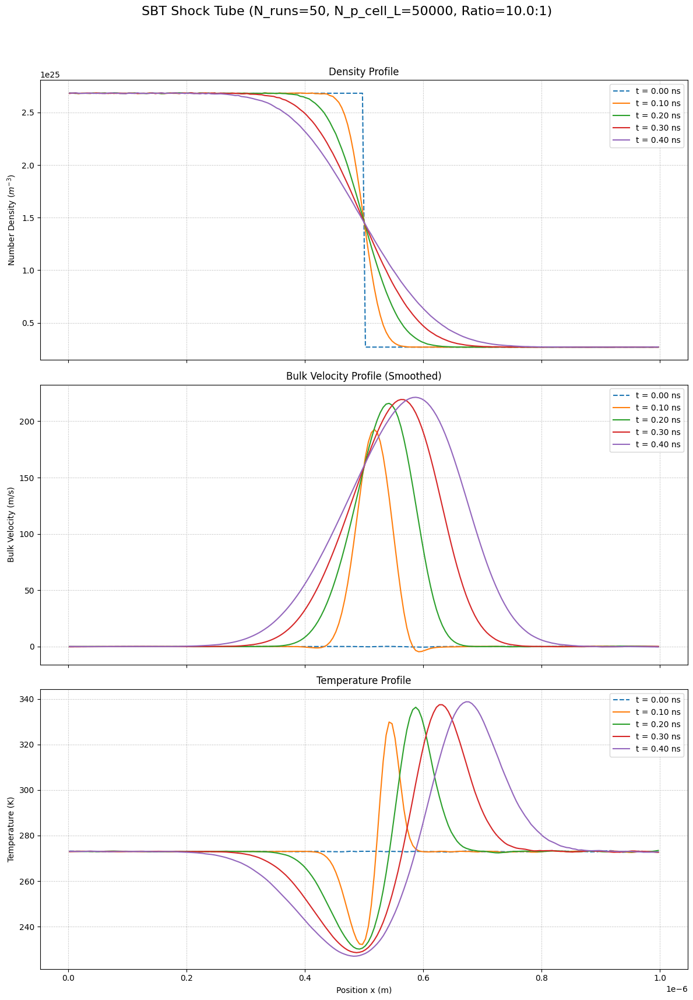

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V19.0 - SBT SHOCK TUBE ---
# این نسخه مسئله لوله شوک (خلاء نسبی) را با استفاده از مدل برخورد SBT بهینه
# و پارامترهای بالانس‌شده (تعداد ذرات بالا و گام زمانی مناسب) شبیه‌سازی می‌کند.
# این کد باید دقیق‌ترین نتایج را برای این مسئله ارائه دهد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23; kb = 1.380649e-23
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return

    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0
            sin_chi = np.sqrt(1.0 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime_x = vr_mag * sin_chi * np.cos(phi_chi)
            vr_prime_y = vr_mag * sin_chi * np.sin(phi_chi)
            vr_prime_z = vr_mag * cos_chi
            particles[p1_idx, 1:4] = vcm[0] + 0.5 * vr_prime_x, vcm[1] + 0.5 * vr_prime_y, vcm[2] + 0.5 * vr_prime_z
            particles[p2_idx, 1:4] = vcm[0] - 0.5 * vr_prime_x, vcm[1] - 0.5 * vr_prime_y, vcm[2] - 0.5 * vr_prime_z

def initialize_shock_tube(params):
    """مقداردهی اولیه ذرات برای مسئله لوله شوک (خلاء نسبی)."""
    num_cells = params['NUM_CELLS_X']; lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']; t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']; t_ratio = params['T_RATIO']

    t_right = t_left / t_ratio
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left
    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std_left = np.sqrt(KB * t_left / MASS_AR)
    v_thermal_std_right = np.sqrt(KB * t_right / MASS_AR)

    current_pos = 0
    # مقداردهی ناحیه چپ
    for i in range(num_cells_left):
        start_idx = current_pos; end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_left, (ppc_left, 3))
        current_pos = end_idx
    # مقداردهی ناحیه راست
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos; end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_right, (ppc_right, 3))
        current_pos = end_idx

    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0) # صفر کردن تکانه کلی
    print(f"Initialized {total_particles} particles for Shock Tube problem.")
    print(f"Left side: {ppc_left} particles/cell @ {t_left}K")
    print(f"Right side: {ppc_right} particles/cell @ {t_right}K")
    return particles

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 50

    particles = initialize_shock_tube(sim_params)

    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1

    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 50000,
        'TOTAL_TIME': 0.4e-9,
        'DT': 2.0e-11,
        'RHO_RATIO': 10.0,
        'T_RATIO': 1.0,
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع شبیه‌سازی لوله شوک با SBT بهینه (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")
    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    title = (f"SBT Shock Tube (N_runs={NUM_ENSEMBLE_RUNS}, "
             f"N_p_cell_L={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']}, "
             f"Ratio={SIMULATION_PARAMS['RHO_RATIO']}:1)")
    fig.suptitle(title, fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature'])
        valid_indices = ~s_temp.isna()
        if np.sum(valid_indices) > 11:
            temp_smoothed = savgol_filter(s_temp[valid_indices], window_length=11, polyorder=2)
            axes[2].plot(cell_centers[valid_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_indices) > 0:
            axes[2].plot(cell_centers[valid_indices], s_temp[valid_indices], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v19_sbt_shock_tube.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: 150) ---
--- اجرای 1/150 تمام شد ---
--- اجرای 2/150 تمام شد ---
--- اجرای 3/150 تمام شد ---
--- اجرای 4/150 تمام شد ---
--- اجرای 5/150 تمام شد ---
--- اجرای 6/150 تمام شد ---
--- اجرای 7/150 تمام شد ---
--- اجرای 8/150 تمام شد ---
--- اجرای 9/150 تمام شد ---
--- اجرای 10/150 تمام شد ---
--- اجرای 11/150 تمام شد ---
--- اجرای 12/150 تمام شد ---
--- اجرای 13/150 تمام شد ---
--- اجرای 14/150 تمام شد ---
--- اجرای 15/150 تمام شد ---
--- اجرای 16/150 تمام شد ---
--- اجرای 17/150 تمام شد ---
--- اجرای 18/150 تمام شد ---
--- اجرای 19/150 تمام شد ---
--- اجرای 20/150 تمام شد ---
--- اجرای 21/150 تمام شد ---
--- اجرای 22/150 تمام شد ---
--- اجرای 23/150 تمام شد ---
--- اجرای 24/150 تمام شد ---
--- اجرای 25/150 تمام شد ---
--- اجرای 26/150 تمام شد ---
--- اجرای 27/150 تمام شد ---
--- اجرای 28/150 تمام شد ---
--- اجرای 29/150 تمام شد ---
--- اجرای 30/150 تمام شد ---
--- اجرای 31/150 تمام شد ---
--- اجرای 32/150 تمام شد ---
--- اجرای 33/15

/tmp/ipython-input-6-856957934.py:215: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-6-856957934.py:216: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


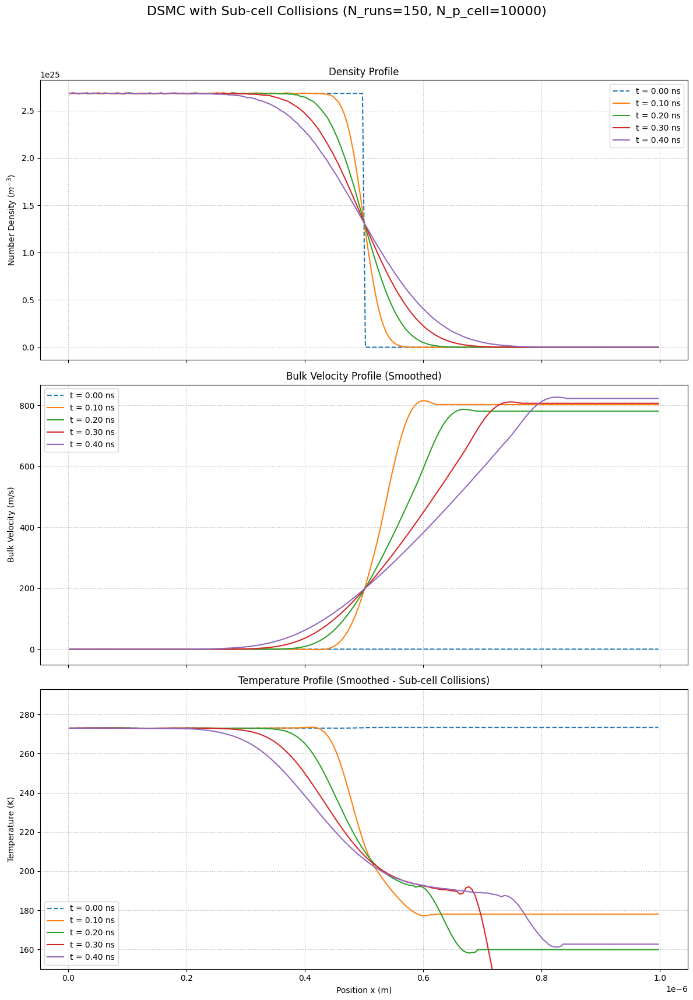

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.1 SUB-CELL COLLISION (MODIFIED RUNS) ---
# این نسخه فقط تعداد تکرارها را به ۱۵۰ افزایش داده و فرمت خروجی را به EPS تغییر می‌دهد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند تا نیاز به پاس دادن آن‌ها نباشد
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533 # For omega = 0.81, Gamma(2.5 - 0.81) = Gamma(1.69)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# تابع برخورد که بر اساس زیرسلول کار می‌کند
@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    # 1. ذرات را در زیرسلول‌های خود دسته‌بندی کن
    sub_cell_width = cell_width / num_sub_cells

    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    # 2. برخوردها را در هر زیرسلول به صورت جداگانه انجام بده
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    # --- CHANGE 1: Number of ensemble runs increased by 3x ---
    NUM_ENSEMBLE_RUNS = 150

    print(f"--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    # --- CHANGE 2: Output format changed to EPS ---
    plt.savefig("dsmc_v16_1_subcell_result_150runs.eps", format='eps')
    plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.1 SUB-CELL COLLISION (HIGH PARTICLE COUNT) ---
# این نسخه تعداد تکرارها را به ۵۰ بازگردانده و تعداد ذرات را به ۲۰۰،۰۰۰ افزایش می‌دهد.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند تا نیاز به پاس دادن آن‌ها نباشد
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533 # For omega = 0.81, Gamma(2.5 - 0.81) = Gamma(1.69)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# تابع برخورد که بر اساس زیرسلول کار می‌کند
@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells

    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        # --- CHANGE 1: Number of particles per cell increased to 200,000 ---
        'PARTICLES_PER_CELL_INIT': 200000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    # --- CHANGE 2: Number of ensemble runs returned to 50 ---
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با تعداد ذرات بسیار بالا (200k) (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_1_subcell_result_200k_particles.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با تعداد ذرات بسیار بالا (200k) (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---


KeyboardInterrupt: 

--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: 10) ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---


/tmp/ipython-input-8-657882391.py:131: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-8-657882391.py:132: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


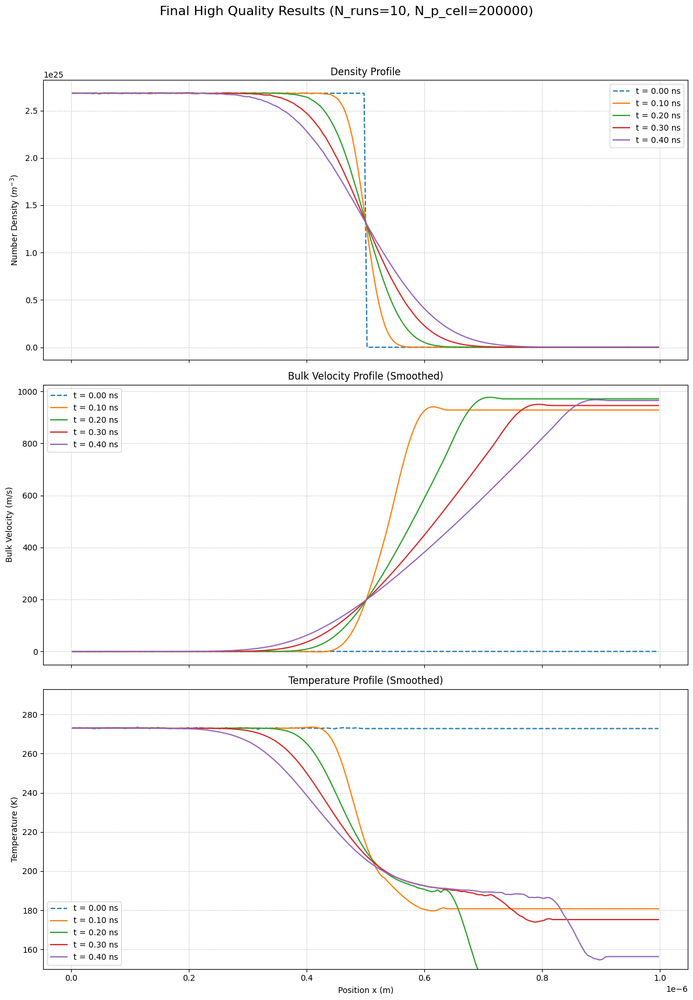

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V5 FINAL INTERPOLATION FIX ---
# این نسخه از درونیابی برای پر کردن شکاف‌ها قبل از فیلترینگ استفاده می‌کند.
# این روش استاندارد و قابل اطمینان برای حل مشکل است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd # کتابخانه قدرتمند pandas را اضافه می‌کنیم

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23; D_REF_AR = 4.17e-10
T_REF_AR = 273.0; OMEGA_VHS = 0.81
@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag, d_ref, t_ref, omega_vhs):
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5; c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533; d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq
@numba.jit(nopython=True)
def perform_collisions_in_cell_numba(particles, indices_in_cell, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    num_candidate_pairs = (num_particles_in_cell * (num_particles_in_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * cell_vol)
    num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
    for _ in range(num_pairs_to_select):
        idx1_local, idx2_local = np.random.randint(0, num_particles_in_cell, 2)
        if idx1_local == idx2_local: continue
        p1_idx, p2_idx = indices_in_cell[idx1_local], indices_in_cell[idx2_local]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]; vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag, D_REF_AR, T_REF_AR, OMEGA_VHS)
        if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2)
            phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime; particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX**3) / NUM_CELLS_X
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    def initialize_gas_expansion():
        particles = np.zeros((TOTAL_PARTICLES_SIM, 4))
        cell_width = LX / NUM_CELLS_X
        num_occupied_cells = NUM_CELLS_X // 2
        for i in range(num_occupied_cells):
            start_idx = i * PARTICLES_PER_CELL_INIT; end_idx = (i + 1) * PARTICLES_PER_CELL_INIT
            particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(PARTICLES_PER_CELL_INIT) * cell_width
        v_thermal_std = np.sqrt(KB * T_INIT / MASS_AR)
        particles[:, 1:4] = np.random.normal(0, v_thermal_std, (TOTAL_PARTICLES_SIM, 3))
        particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
        return particles
    particles = initialize_gas_expansion()
    results_history = {}; cell_width = LX / NUM_CELLS_X
    def sample_properties(particles_state):
        density_profile = np.zeros(NUM_CELLS_X); velocity_profile = np.full(NUM_CELLS_X, np.nan); temp_profile = np.full(NUM_CELLS_X, np.nan)
        cell_indices_sample = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices_sample = np.clip(cell_indices_sample, 0, NUM_CELLS_X - 1)
        sorted_indices_sample = np.argsort(cell_indices_sample); cell_counts_sample = np.bincount(cell_indices_sample, minlength=NUM_CELLS_X)
        cell_starts_sample = np.concatenate(([0], np.cumsum(cell_counts_sample[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_starts_sample[i]; end = start + cell_counts_sample[i]
            indices_in_cell_i = sorted_indices_sample[start:end]; num_in_cell = len(indices_in_cell_i)
            if num_in_cell > 0: density_profile[i] = num_in_cell * FNUM / CELL_VOLUME_CONCEPTUAL
            if num_in_cell >= MIN_PARTICLES_FOR_STATS:
                cell_velocities = particles_state[indices_in_cell_i, 1:4]; mean_vel_cell = np.mean(cell_velocities, axis=0)
                velocity_profile[i] = mean_vel_cell[0]
                thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell)
        return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}
    results_history[0.0] = sample_properties(particles)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate, D_REF_AR, T_REF_AR, OMEGA_VHS)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices); cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate(([0], np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            perform_collisions_in_cell_numba(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles)
    return results_history

# ===================================================================
# ۲. بخش اصلی اجرا کننده و میانگین‌گیر
# ===================================================================

if __name__ == "__main__":

    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 200000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
    }
    # برای تست سریع‌تر می‌توانید این عدد را کم کنید، مثلا 50
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با کیفیت بالا (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i); single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results])
        all_velocities = np.array([run[t]['velocity'] for run in all_results])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"Final High Quality Results (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    win_len, poly_ord = 21, 2

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # ۱. رسم چگالی (بدون تغییر)
        axes[0].plot(cell_centers, data['density'], linestyle=line_style, label=label_text)

        # --- روش نهایی و صحیح: درونیابی + پر کردن + فیلتر ---
        def interpolate_filter_and_plot(ax, raw_data, default_value, plot_style, plot_label):
            # تبدیل آرایه نامپای به سری پانداس برای درونیابی
            s = pd.Series(raw_data)

            # 1. درونیابی خطی برای پر کردن شکاف‌های میانی
            s_interpolated = s.interpolate(method='linear')

            # 2. پر کردن مقادیر NaN باقیمانده در ابتدا و انتها با مقدار پیش‌فرض
            s_filled = s_interpolated.fillna(default_value)

            # تبدیل سری پانداس به آرایه نامپای برای فیلتر کردن
            continuous_data = s_filled.to_numpy()

            # 3. اعمال فیلتر هموارساز روی داده‌های کاملا پیوسته
            # برای t=0 نیازی به فیلتر نیست چون باید کاملا صاف باشد
            if t == 0.0:
                smoothed_data = continuous_data
            else:
                smoothed_data = savgol_filter(continuous_data, window_length=win_len, polyorder=poly_ord)

            ax.plot(cell_centers, smoothed_data, linestyle=plot_style, label=plot_label)

        # ۲. رسم سرعت
        interpolate_filter_and_plot(axes[1], data['velocity'], 0.0, line_style, label_text)

        # ۳. رسم دما
        interpolate_filter_and_plot(axes[2], data['temperature'], SIMULATION_PARAMS['T_INIT'], line_style, label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v5_interpolation_fix_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل خلاء نسبی (تعداد اجرا: 50) ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 1/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 2/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 3/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 4/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 5/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/cell @ 273.0K
--- اجرای 6/50 تمام شد ---
Initialized 1200000 particles.
Left side: 10000 particles/cell @ 273.0K
Right side: 2000 particles/ce

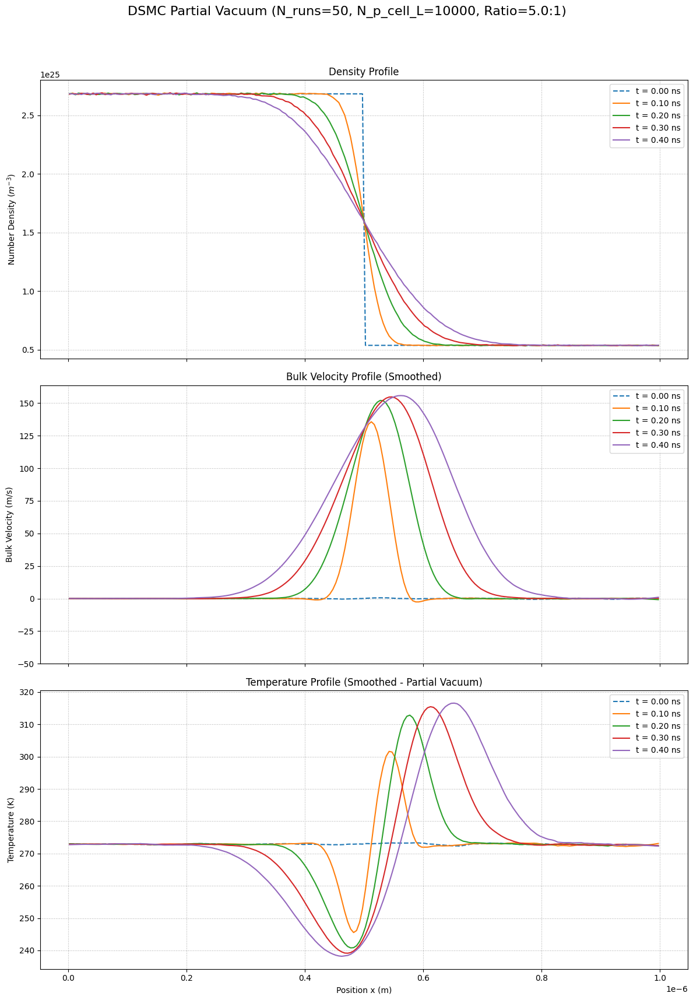

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.2 PARTIAL VACUUM ---
# این نسخه مسئله موج انبساطی را از خلاء کامل به خلاء نسبی تغییر می‌دهد.
# این کار با هدف بهبود پایداری آماری در سمت راست دامنه انجام شده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع مقداردهی اولیه اصلاح شده برای خلاء نسبی ---
def initialize_gas_expansion(params):
    """Initializes particles for a two-region problem (e.g., partial vacuum)."""
    num_cells = params['NUM_CELLS_X']
    lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']
    t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']
    t_ratio = params['T_RATIO']

    t_right = t_left / t_ratio
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1 # حداقل یک ذره در هر سلول سمت راست باشد

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left

    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std_left = np.sqrt(KB * t_left / MASS_AR)
    v_thermal_std_right = np.sqrt(KB * t_right / MASS_AR)

    current_pos = 0
    # مقداردهی ناحیه چپ
    for i in range(num_cells_left):
        start_idx = current_pos
        end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_left, (ppc_left, 3))
        current_pos = end_idx

    # مقداردهی ناحیه راست
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos
        end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std_right, (ppc_right, 3))
        current_pos = end_idx

    # اطمینان از صفر بودن تکانه کلی سیستم
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)

    print(f"Initialized {total_particles} particles.")
    print(f"Left side: {ppc_left} particles/cell @ {t_left}K")
    print(f"Right side: {ppc_right} particles/cell @ {t_right}K")
    return particles


def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    # مقداردهی اولیه
    particles = initialize_gas_expansion(sim_params)

    # محاسبه Fnum بر اساس سمت چپ (چگالی بالا)
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT

    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6,
        # --- پارامترهای جدید برای خلاء نسبی ---
        'RHO_RATIO': 5.0, # نسبت چگالی چپ به راست
        'T_RATIO': 1.0,    # نسبت دمای چپ به راست
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل خلاء نسبی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC Partial Vacuum (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell_L={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']}, Ratio={SIMULATION_PARAMS['RHO_RATIO']}:1)", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        # در این مدل انتظار می‌رود پروفایل دما پایدارتر باشد
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Partial Vacuum)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    # ممکن است نیاز باشد محدوده دما را کمی تغییر دهید
    # axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_2_partial_vacuum_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

/tmp/ipython-input-10-653370726.py:260: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-10-653370726.py:261: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


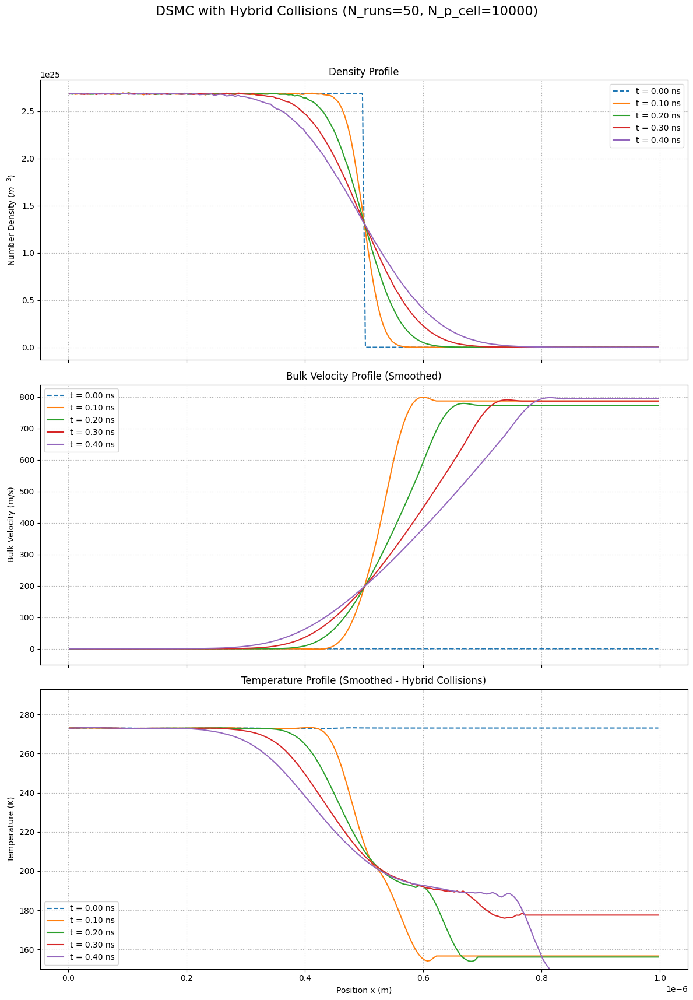

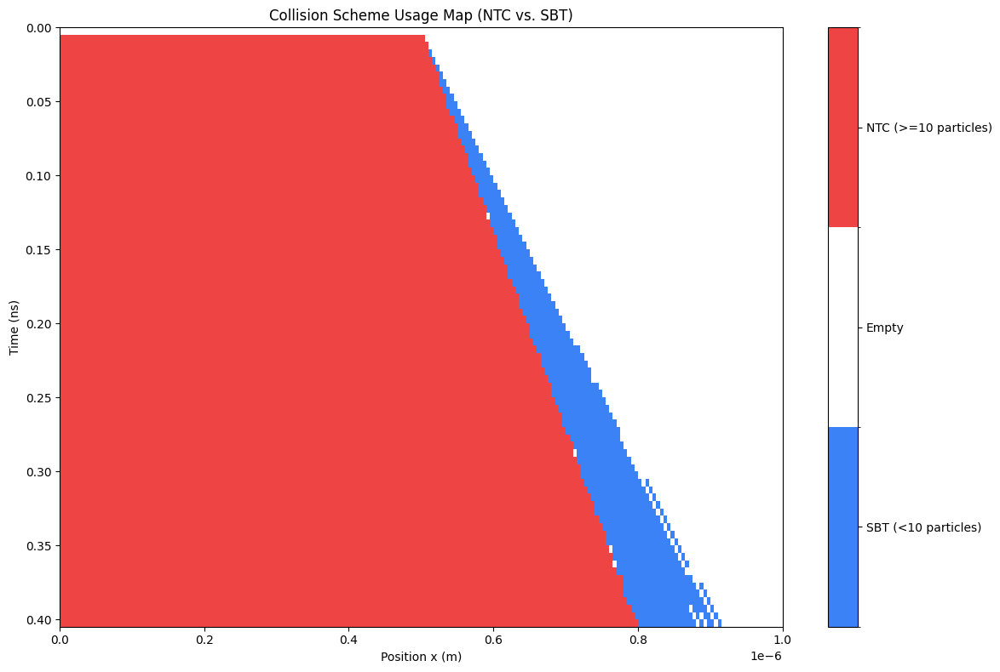

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.0 HYBRID NTC-SBT MODEL ---
# این نسخه یک مدل برخورد هیبریدی را پیاده‌سازی می‌کند.
# برای سلول‌های با ذرات کم (<10) از SBT و برای سایر سلول‌ها از NTC استفاده می‌شود.
# استفاده از هر مدل رهگیری و در نهایت به صورت نمودار و درصد گزارش می‌شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (با توابع برخورد NTC و SBT)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# --- تابع برخورد NTC با زیرسلول (بدون تغییر) ---
@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع برخورد SBT بهینه (جدید) ---
@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# --- تابع اصلی شبیه‌سازی (اصلاح شده برای منطق هیبریدی) ---
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    # متغیرهای جدید برای رهگیری
    sbt_usage_count = 0
    ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]

                # --- منطق هیبریدی برای انتخاب مدل برخورد ---
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1
                    usage_map[step, i] = -1  # کد -1 برای SBT
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1
                    usage_map[step, i] = 1   # کد +1 برای NTC

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history, sbt_usage_count, ntc_usage_count, usage_map

# توابع مقداردهی اولیه و نمونه‌برداری (بدون تغییر)
def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# --- تابع جدید برای رسم نقشه استفاده از مدل برخورد ---
def plot_usage_map(usage_map, dt, lx, num_cells):
    plt.figure(figsize=(12, 8))

    # ایجاد یک colormap سفارشی: آبی برای SBT، سفید برای خالی، قرمز برای NTC
    cmap = mcolors.ListedColormap(['#3b82f6', '#ffffff', '#ef4444'])
    bounds = [-1.5, -0.5, 0.5, 1.5]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # محاسبه extent برای محورها
    total_time = usage_map.shape[0] * dt
    extent = [0, lx, total_time * 1e9, 0] # زمان از بالا به پایین

    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)

    plt.xlabel('Position x (m)')
    plt.ylabel('Time (ns)')
    plt.title('Collision Scheme Usage Map (NTC vs. SBT)')

    # تنظیم colorbar
    cbar = plt.colorbar(im, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'])

    plt.tight_layout()
    plt.savefig("dsmc_hybrid_usage_map.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار (اصلاح شده برای رهگیری)
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    total_sbt_calls = 0
    total_ntc_calls = 0
    # نقشه استفاده تجمیعی برای تمام اجراها
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))

    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c
        total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    # --- بخش گزارش‌دهی جدید ---
    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100
        ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")

    # میانگین‌گیری نتایج فیزیکی
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # رسم نمودارهای اصلی
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Hybrid Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_hybrid_results.eps", format='eps')
    plt.show()

    # رسم نقشه استفاده
    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

/tmp/ipython-input-11-3654117385.py:228: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-11-3654117385.py:229: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-11-3654117385.py:230: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


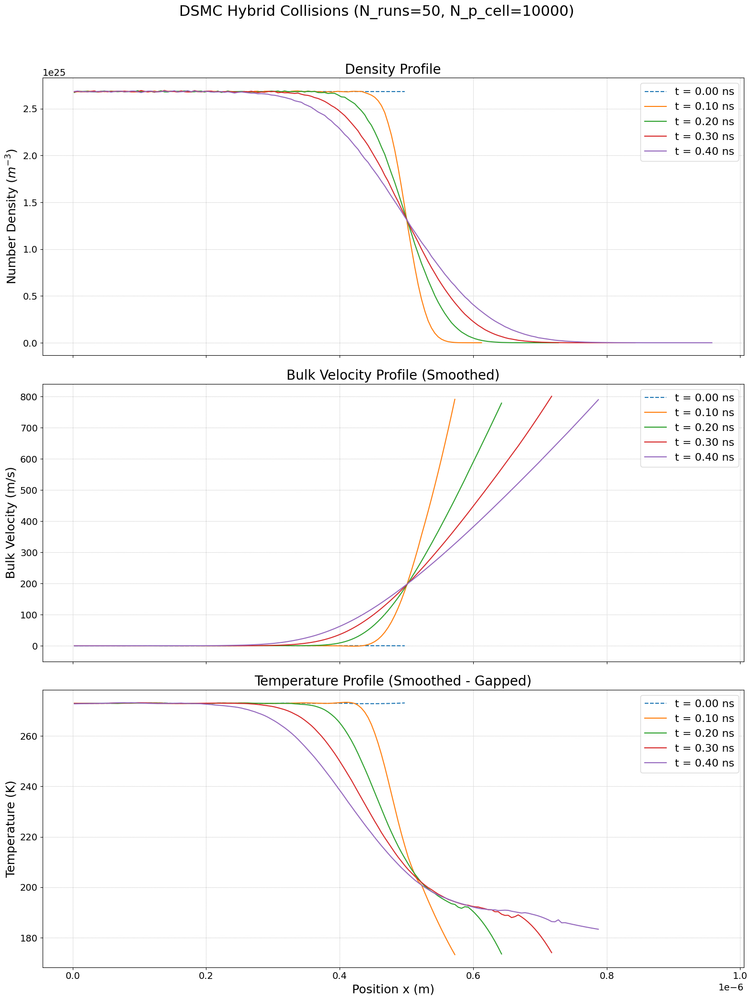

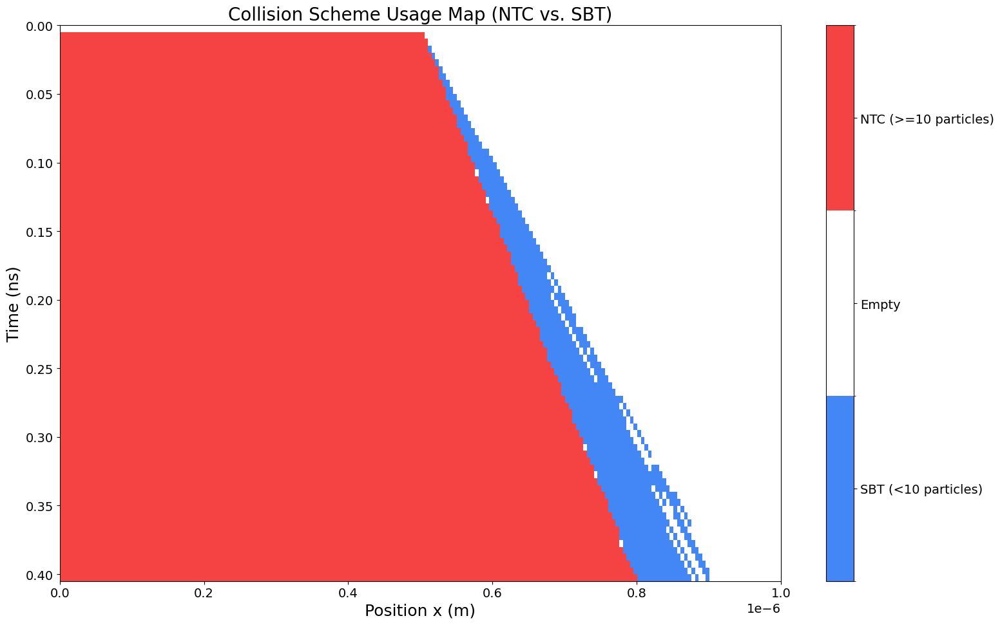

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.1 HYBRID NTC-SBT with GAPPED PLOTTING ---
# این نسخه منطق رسم نمودار را اصلاح می‌کند تا در نواحی خالی، داده‌ای رسم نشود.
# فرمت خروجی به EPS تغییر کرده و فونت‌ها بزرگ‌تر شده‌اند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    sbt_usage_count = 0; ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1; usage_map[step, i] = -1
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1; usage_map[step, i] = 1
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, sbt_usage_count, ntc_usage_count, usage_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

def plot_usage_map(usage_map, dt, lx, num_cells):
    # CHANGE: Increase font sizes for usage map plot
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    plt.figure(figsize=(16, 10))
    cmap = mcolors.ListedColormap(['#4287f5', '#ffffff', '#f54242'])
    bounds = [-1.5, -0.5, 0.5, 1.5]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    total_time = usage_map.shape[0] * dt
    extent = [0, lx, total_time * 1e9, 0]
    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)
    plt.xlabel('Position x (m)')
    plt.ylabel('Time (ns)')
    plt.title('Collision Scheme Usage Map (NTC vs. SBT)')
    cbar = plt.colorbar(im, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'])
    plt.tight_layout()
    plt.savefig("dsmc_hybrid_usage_map.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار (با منطق رسم اصلاح‌شده)
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; total_sbt_calls = 0; total_ntc_calls = 0
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c; total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100
        ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- CHANGE: Increase all font sizes for main results plot ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=22)

    # --- CHANGE: New plotting loop to handle gaps ---
    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        # Plot Density only for non-empty cells
        s_dens = pd.Series(data['density'])
        valid_dens_indices = ~s_dens.isna()
        axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)

        # Plot Velocity only for valid (non-NaN) cells
        s_vel = pd.Series(data['velocity'])
        valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2)
            axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0:
             axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)

        # Plot Temperature only for valid (non-NaN) cells
        s_temp = pd.Series(data['temperature'])
        valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2)
            axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0:
            axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Gapped)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50)
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])

    # --- CHANGE: Save as EPS ---
    plt.savefig("dsmc_hybrid_results_gapped.eps", format='eps')
    plt.show()

    # Plot usage map
    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V21.0 - SBT with Fine Grid Strategy (Step 1) ---
# This version implements the strategy proposed by the advisor:
# - Low particles per cell (PPC=100)
# - Very fine grid (20,000 cells)
# - Very small time step (dt = 5.0e-14 s)
# - Massive number of ensemble runs (1000)
# - The collision model is pure Optimized SBT.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 5 # In this strategy, we accept stats from fewer particles

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            if cell_counts[i] > 1:
                start = cell_start_indices[i]; end = start + cell_counts[i]
                indices_in_cell_i = sorted_particle_indices[start:end]
                perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    print(f"Initializing {total_particles} particles...")
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        # --- NEW PARAMETERS for Step 1 ---
        'NUM_CELLS_X': 20000,
        'PARTICLES_PER_CELL_INIT': 100,
        'TOTAL_TIME': 0.4e-9,
        'DT': 5.0e-14,
    }
    # --- NEW PARAMETER for Step 1 ---
    NUM_ENSEMBLE_RUNS = 1000

    print(f"--- Starting Fine Grid Strategy Simulation (N_runs={NUM_ENSEMBLE_RUNS}) ---")
    print(f"Parameters: PPC={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']}, N_cells={SIMULATION_PARAMS['NUM_CELLS_X']}, dt={SIMULATION_PARAMS['DT']}")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        # Log progress for such a long run
        if (i+1) % 10 == 0:
             print(f"--- Ensemble run {i+1}/{NUM_ENSEMBLE_RUNS} completed. Total time elapsed: {(time.time() - start_time_total)/60:.2f} minutes ---")

    print("\n--- All ensemble runs completed. Averaging results... ---")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # Plotting section
    plt.rcParams.update({'font.size': 16})
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Fine Grid (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=22)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'

        # Plot Density
        s_dens = pd.Series(data['density']); valid_dens_indices = ~s_dens.isna()
        axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)

        # Plot Velocity
        s_vel = pd.Series(data['velocity']); valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 51: # Use a larger window for finer grid
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=51, polyorder=2)
            axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0:
             axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)

        # Plot Temperature
        s_temp = pd.Series(data['temperature']); valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 51:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=51, polyorder=2)
            axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0:
            axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig("dsmc_sbt_fine_grid_results.eps", format='eps')
    plt.show()

--- Starting Fine Grid Strategy Simulation (N_runs=1000) ---
Parameters: PPC=100, N_cells=20000, dt=5e-14
Initializing 1000000 particles...


KeyboardInterrupt: 

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.3 TRANSIENT ADAPTIVE SUBCELLS (TAS) ---
# این نسخه روش زیرسلول‌های منطبق‌شونده گذرا (TAS) را پیاده‌سازی می‌کند.
# تعداد زیرسلول‌ها به صورت پویا بر اساس تعداد ذرات هر سلول تعیین می‌شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

# تابع برخورد NTC با زیرسلول (این تابع بدون تغییر باقی می‌ماند)
@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells: sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

# تابع اصلی شبیه‌سازی (اصلاح شده برای منطق TAS)
def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET'] # پارامتر جدید برای TAS

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        # --- پیاده‌سازی منطق TAS ---
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                # محاسبه تطبیقی تعداد زیرسلول‌ها برای این سلول خاص
                adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                if adaptive_num_sub_cells < 1:
                    adaptive_num_sub_cells = 1 # حداقل یک زیرسلول وجود داشته باشد

                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                cell_start_x = i * cell_width

                # فراخوانی تابع برخورد با تعداد زیرسلول‌های تطبیقی
                perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

# ... توابع initialize_gas_expansion و sample_properties بدون تغییر ...
def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        # 'NUM_SUB_CELLS_PER_CELL': 6  <-- این پارامتر دیگر استفاده نمی‌شود
        'P_TARGET': 2, # <-- پارامتر جدید برای TAS: تعداد ذره مطلوب در هر زیرسلول
    }
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل TAS (P_target = {SIMULATION_PARAMS['P_TARGET']}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Transient Adaptive Sub-cells (TAS) (N_runs={NUM_ENSEMBLE_RUNS}, P_target={SIMULATION_PARAMS['P_TARGET']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear'); axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0); vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2); axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill(); temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2); axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - TAS)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_3_tas_result.png", dpi=300)
    plt.show()

--- شروع اجرای نهایی با مدل TAS (P_target = 2) ---


KeyboardInterrupt: 

--- شروع اجرای نهایی با مدل TAS (P_target = 2) ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---


/tmp/ipython-input-15-2966487649.py:202: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-15-2966487649.py:203: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


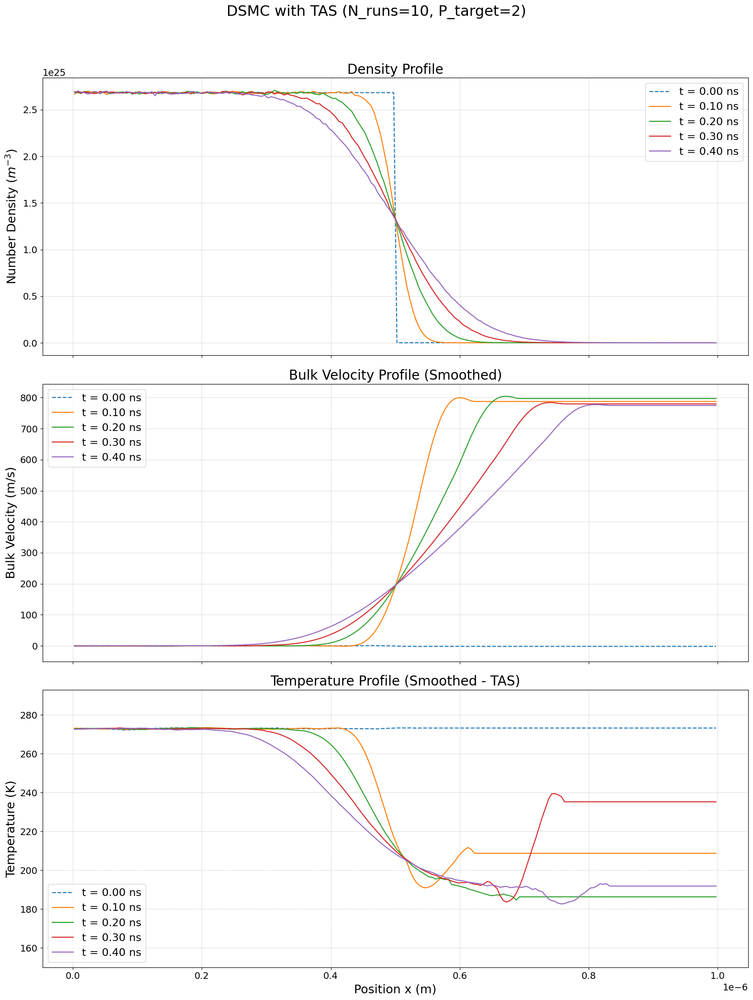

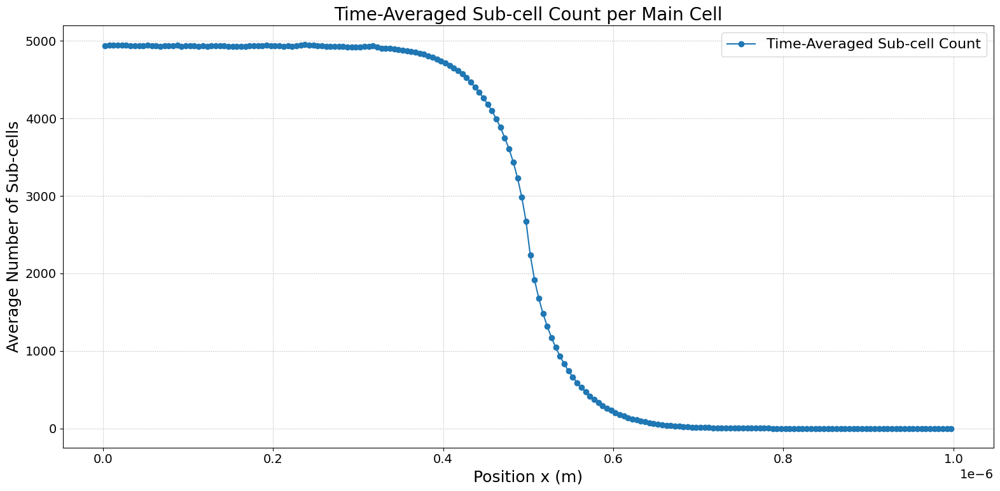

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.4 TAS with Sub-cell Statistics ---
# این نسخه تعداد تکرارها را به ۱۰ کاهش می‌دهد، خروجی‌ها را با فرمت EPS و فونت درشت ذخیره می‌کند،
# و آمار مربوط به تعداد زیرسلول‌های استفاده شده را محاسبه و رسم می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells: sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    # آرایه جدید برای ذخیره تعداد زیرسلول‌ها
    subcell_count_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            adaptive_num_sub_cells = 0 # مقدار پیش‌فرض
            if num_particles_in_cell > 1:
                adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                cell_start_x = i * cell_width
                perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

            # ذخیره تعداد زیرسلول‌های استفاده شده برای این سلول در این گام زمانی
            subcell_count_map[step, i] = adaptive_num_sub_cells

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history, subcell_count_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# --- تابع جدید برای رسم آمار زیرسلول‌ها ---
def plot_average_subcells(avg_subcell_map, cell_centers):
    plt.figure(figsize=(16, 8))
    plt.plot(cell_centers, avg_subcell_map, 'o-', label='Time-Averaged Sub-cell Count')
    plt.xlabel('Position x (m)')
    plt.ylabel('Average Number of Sub-cells')
    plt.title('Time-Averaged Sub-cell Count per Main Cell')
    plt.grid(True, linestyle=':')
    plt.legend()
    plt.tight_layout()
    plt.savefig("dsmc_tas_subcell_stats.eps", format='eps')
    plt.show()


# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    # --- CHANGE: Number of runs set to 10 ---
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل TAS (P_target = {SIMULATION_PARAMS['P_TARGET']}) ---")

    all_results = []
    # آرایه تجمعی برای نقشه تعداد زیرسلول‌ها
    summed_subcell_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))

    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        # دریافت نقشه زیرسلول‌ها از خروجی تابع
        single_run_history, subcell_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        summed_subcell_map += subcell_map # جمع کردن نقشه‌ها
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    # محاسبه میانگین تعداد زیرسلول‌ها
    average_subcell_map_over_runs = summed_subcell_map / NUM_ENSEMBLE_RUNS
    time_averaged_subcells_per_cell = np.mean(average_subcell_map_over_runs, axis=0)

    # میانگین‌گیری نتایج فیزیکی
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- CHANGE: Increase all font sizes ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC with TAS (N_runs={NUM_ENSEMBLE_RUNS}, P_target={SIMULATION_PARAMS['P_TARGET']})", fontsize=22)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear'); axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0); vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2); axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill(); temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2); axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - TAS)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    # --- CHANGE: Save as EPS ---
    plt.savefig("dsmc_tas_results.eps", format='eps')
    plt.show()

    # --- رسم نمودار جدید آمار زیرسلول‌ها ---
    plot_average_subcells(time_averaged_subcells_per_cell, cell_centers)

--- شروع اجرای نهایی با مدل TAS (P_target = 2) ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---


/tmp/ipython-input-16-138850140.py:186: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-16-138850140.py:187: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


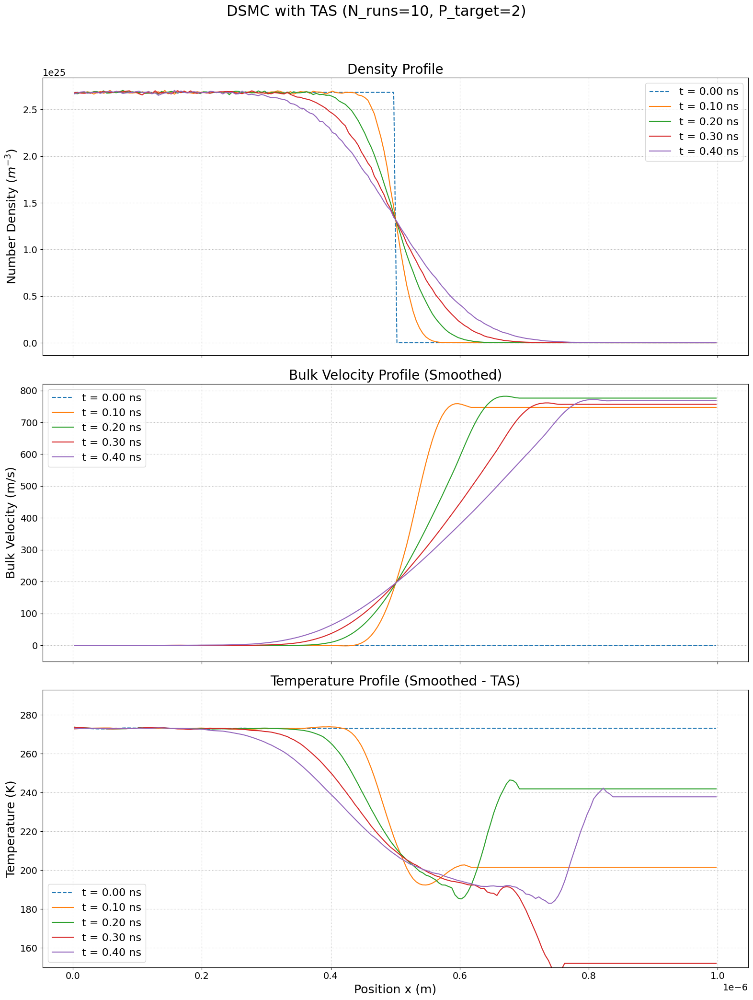

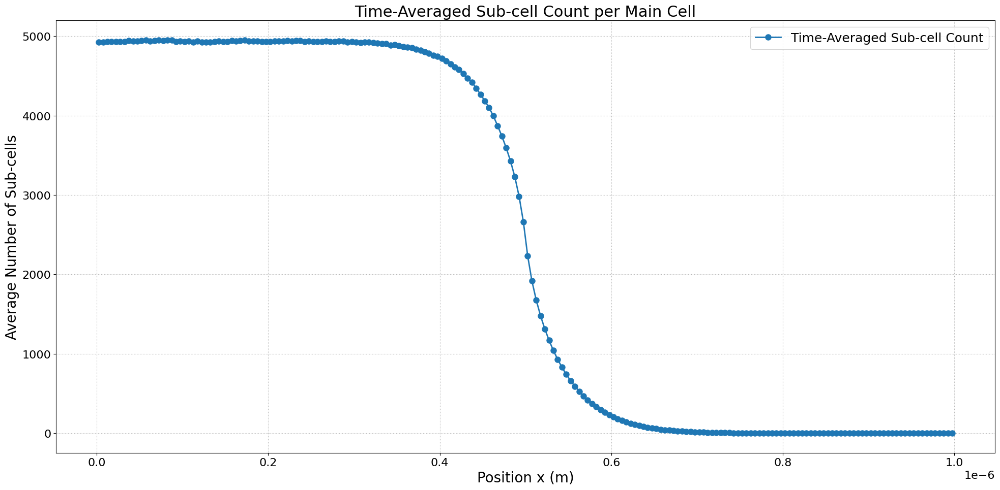

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.5 TAS with All Plots Saved as EPS ---
# این نسخه تضمین می‌کند که هر دو نمودار خروجی (نتایج اصلی و آمار زیرسلول‌ها)
# با فرمت EPS و با فونت‌های درشت ذخیره شوند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells: sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    subcell_count_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            adaptive_num_sub_cells = 0
            if num_particles_in_cell > 1:
                adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                cell_start_x = i * cell_width
                perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
            subcell_count_map[step, i] = adaptive_num_sub_cells
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, subcell_count_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# --- تابع اصلاح‌شده برای رسم و ذخیره آمار زیرسلول‌ها ---
def plot_average_subcells(avg_subcell_map, cell_centers):
    # تنظیم فونت درشت برای این نمودار
    plt.rcParams.update({'font.size': 18, 'axes.labelsize': 20, 'axes.titlesize': 22, 'xtick.labelsize': 16, 'ytick.labelsize': 16, 'legend.fontsize': 18})

    plt.figure(figsize=(20, 10))
    plt.plot(cell_centers, avg_subcell_map, 'o-', linewidth=2, markersize=8, label='Time-Averaged Sub-cell Count')
    plt.xlabel('Position x (m)')
    plt.ylabel('Average Number of Sub-cells')
    plt.title('Time-Averaged Sub-cell Count per Main Cell')
    plt.grid(True, linestyle=':')
    plt.legend()
    plt.tight_layout()
    # --- CHANGE: Save the plot as an EPS file ---
    plt.savefig("dsmc_tas_subcell_stats.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل TAS (P_target = {SIMULATION_PARAMS['P_TARGET']}) ---")

    all_results = []; summed_subcell_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history, subcell_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        summed_subcell_map += subcell_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    average_subcell_map_over_runs = summed_subcell_map / NUM_ENSEMBLE_RUNS
    time_averaged_subcells_per_cell = np.mean(average_subcell_map_over_runs, axis=0)

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- CHANGE: Set large fonts for the main plot ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC with TAS (N_runs={NUM_ENSEMBLE_RUNS}, P_target={SIMULATION_PARAMS['P_TARGET']})", fontsize=22)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear'); axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0); vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2); axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill(); temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2); axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - TAS)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    # --- CHANGE: Save the main plot as an EPS file ---
    plt.savefig("dsmc_tas_results.eps", format='eps')
    plt.show()

    # --- رسم نمودار جدید آمار زیرسلول‌ها ---
    plot_average_subcells(time_averaged_subcells_per_cell, cell_centers)

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.6 TAS with Data File Output for Tecplot ---
# این نسخه به جای رسم نمودار، نتایج را در فایل‌های داده متنی مناسب برای Tecplot ذخیره می‌کند.

import numpy as np
import numba
import time
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells: sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    subcell_count_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            adaptive_num_sub_cells = 0
            if num_particles_in_cell > 1:
                adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                cell_start_x = i * cell_width
                perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
            subcell_count_map[step, i] = adaptive_num_sub_cells
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, subcell_count_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده و ذخیره‌سازی داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل TAS (P_target = {SIMULATION_PARAMS['P_TARGET']}) ---")

    all_results = []; summed_subcell_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history, subcell_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        summed_subcell_map += subcell_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    average_subcell_map_over_runs = summed_subcell_map / NUM_ENSEMBLE_RUNS
    time_averaged_subcells_per_cell = np.mean(average_subcell_map_over_runs, axis=0)

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- CHANGE: Data Export Section ---
    print("\n--- Exporting results to data files for Tecplot ---")

    # 1. Export Density, Velocity, and Temperature profiles
    for prop_name in ['density', 'velocity', 'temperature']:
        data_to_export = {'X_Position_m': cell_centers}
        for t in sample_times:
            col_name = f"{prop_name}_t={t*1e9:.2f}ns"
            data_to_export[col_name] = averaged_results[t][prop_name]

        df = pd.DataFrame(data_to_export)
        filename = f"dsmc_tas_{prop_name}_results.dat"
        df.to_csv(filename, sep='\t', index=False, na_rep='NaN')
        print(f"Successfully saved: {filename}")

    # 2. Export Time-Averaged Sub-cell count
    subcell_data_to_export = {
        'X_Position_m': cell_centers,
        'Avg_Subcell_Count': time_averaged_subcells_per_cell
    }
    df_subcell = pd.DataFrame(subcell_data_to_export)
    filename_subcell = "dsmc_tas_subcell_stats.dat"
    df_subcell.to_csv(filename_subcell, sep='\t', index=False, na_rep='NaN')
    print(f"Successfully saved: {filename_subcell}")

    print("\n--- Data export complete. ---")

--- شروع اجرای نهایی با مدل TAS (P_target = 2) ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---

--- Exporting results to data files for Tecplot ---
Successfully saved: dsmc_tas_density_results.dat
Successfully saved: dsmc_tas_velocity_results.dat
Successfully saved: dsmc_tas_temperature_results.dat
Successfully saved: dsmc_tas_subcell_stats.dat

--- Data export complete. ---


/tmp/ipython-input-17-4094550560.py:166: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-17-4094550560.py:167: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


--- شروع اجرای نهایی با مدل TAS (P_target = 2) ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---


/tmp/ipython-input-19-787723180.py:192: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-19-787723180.py:193: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


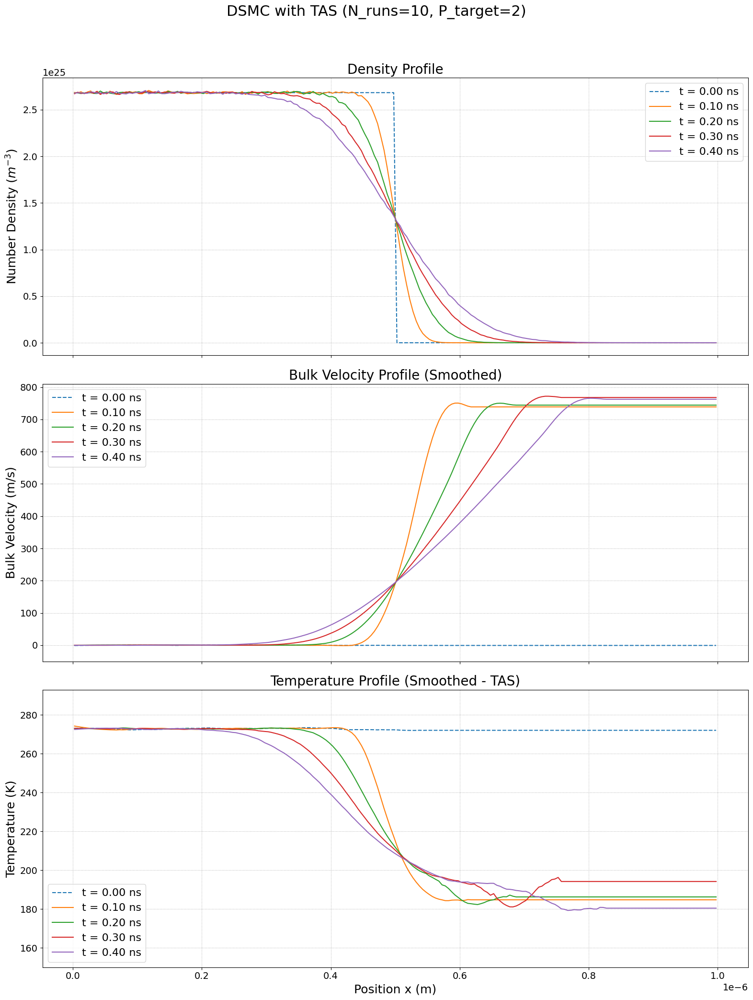

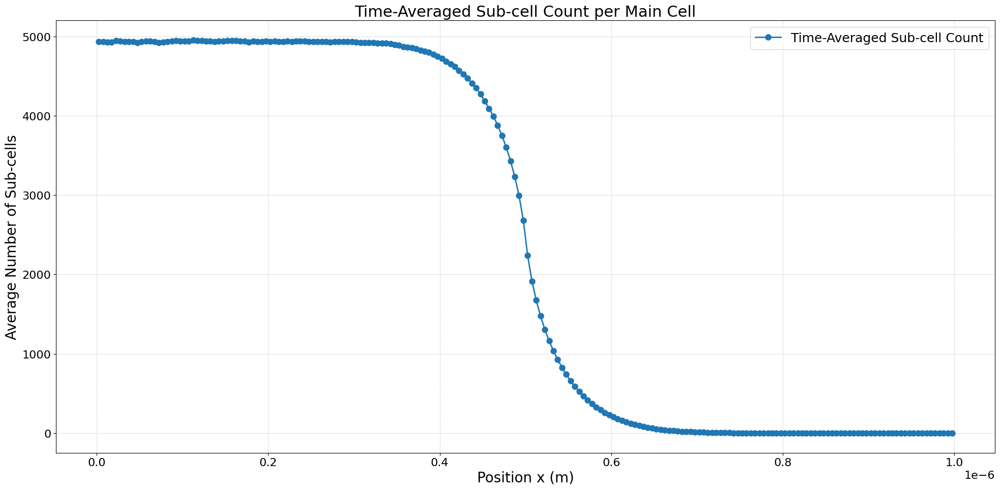

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.6 TAS with Large Font Output ---
# این نسخه فونت‌ها را در تمام نمودارهای خروجی برای خوانایی بهتر بزرگ‌تر می‌کند.
# تمام خروجی‌ها با فرمت EPS ذخیره می‌شوند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells: sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    subcell_count_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            adaptive_num_sub_cells = 0
            if num_particles_in_cell > 1:
                adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                cell_start_x = i * cell_width
                perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
            subcell_count_map[step, i] = adaptive_num_sub_cells
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, subcell_count_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0: density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# --- تابع اصلاح‌شده برای رسم و ذخیره آمار زیرسلول‌ها ---
def plot_average_subcells(avg_subcell_map, cell_centers):
    # --- CHANGE: Set large font sizes for this specific plot ---
    plt.rcParams.update({
        'font.size': 18,
        'axes.labelsize': 20,
        'axes.titlesize': 22,
        'xtick.labelsize': 16,
        'ytick.labelsize': 16,
        'legend.fontsize': 18
    })

    plt.figure(figsize=(20, 10))
    plt.plot(cell_centers, avg_subcell_map, 'o-', linewidth=2, markersize=8, label='Time-Averaged Sub-cell Count')
    plt.xlabel('Position x (m)')
    plt.ylabel('Average Number of Sub-cells')
    plt.title('Time-Averaged Sub-cell Count per Main Cell')
    plt.grid(True, linestyle=':')
    plt.legend()
    plt.tight_layout()
    plt.savefig("dsmc_tas_subcell_stats.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل TAS (P_target = {SIMULATION_PARAMS['P_TARGET']}) ---")

    all_results = []; summed_subcell_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history, subcell_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        summed_subcell_map += subcell_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    average_subcell_map_over_runs = summed_subcell_map / NUM_ENSEMBLE_RUNS
    time_averaged_subcells_per_cell = np.mean(average_subcell_map_over_runs, axis=0)

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- CHANGE: Set large fonts for the main results plot ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC with TAS (N_runs={NUM_ENSEMBLE_RUNS}, P_target={SIMULATION_PARAMS['P_TARGET']})", fontsize=22)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear'); axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0); vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2); axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill(); temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2); axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - TAS)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig("dsmc_tas_results.eps", format='eps')
    plt.show()

    # --- رسم نمودار جدید آمار زیرسلول‌ها ---
    plot_average_subcells(time_averaged_subcells_per_cell, cell_centers)

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

/tmp/ipython-input-22-3710163690.py:237: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-22-3710163690.py:238: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-22-3710163690.py:239: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


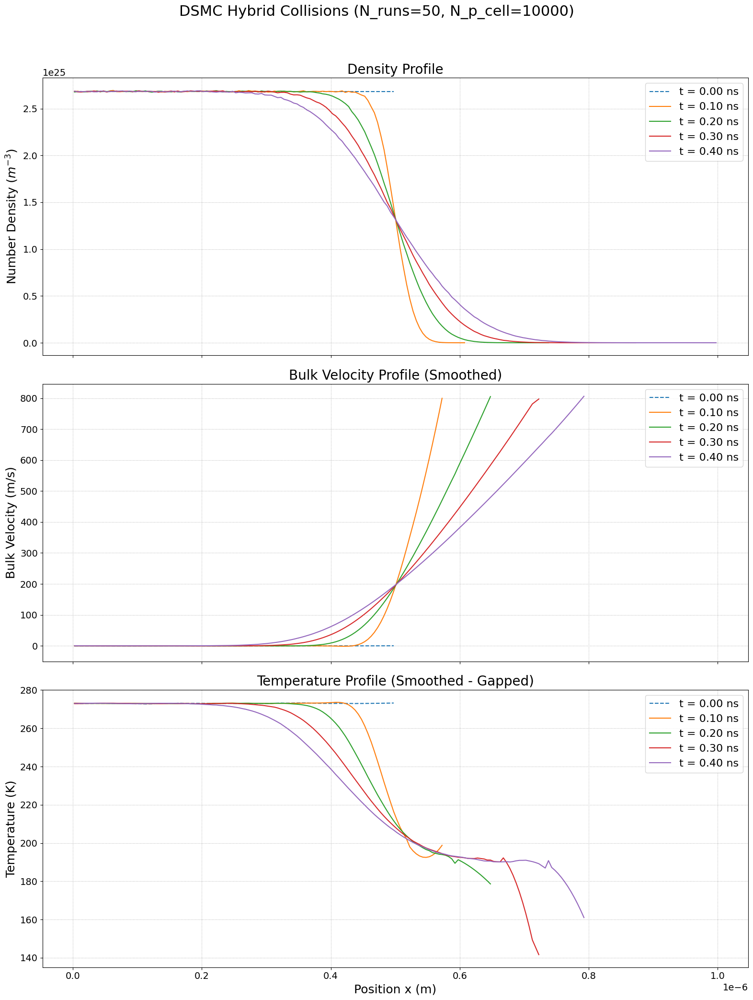

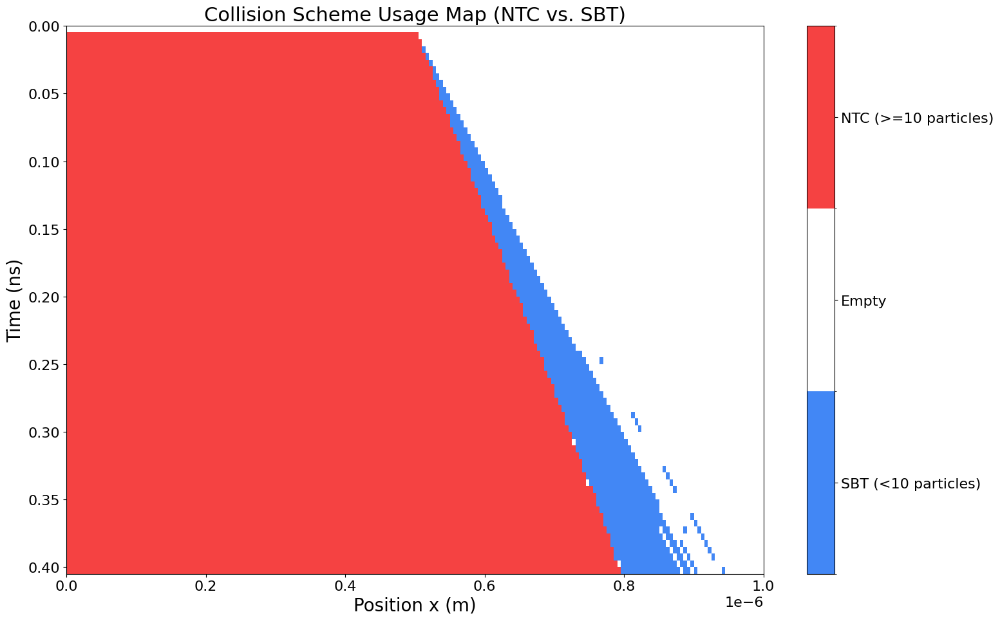

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.2 HYBRID NTC-SBT with LARGE FONTS ---
# این نسخه فقط اندازه فونت‌ها را در تمام نمودارها برای خوانایی بهتر بزرگ‌تر می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    sbt_usage_count = 0; ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1; usage_map[step, i] = -1
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1; usage_map[step, i] = 1
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, sbt_usage_count, ntc_usage_count, usage_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# --- تابع اصلاح‌شده برای رسم نقشه استفاده با فونت‌های درشت ---
def plot_usage_map(usage_map, dt, lx, num_cells):
    # CHANGE: Larger font sizes for the usage map plot
    plt.rcParams.update({
        'font.size': 18,
        'axes.labelsize': 20,
        'axes.titlesize': 22,
        'xtick.labelsize': 16,
        'ytick.labelsize': 16
    })

    plt.figure(figsize=(16, 10))
    cmap = mcolors.ListedColormap(['#4287f5', '#ffffff', '#f54242'])
    bounds = [-1.5, -0.5, 0.5, 1.5]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    total_time = usage_map.shape[0] * dt
    extent = [0, lx, total_time * 1e9, 0]
    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)
    plt.xlabel('Position x (m)')
    plt.ylabel('Time (ns)')
    plt.title('Collision Scheme Usage Map (NTC vs. SBT)')

    # Increase colorbar font size separately
    cbar = plt.colorbar(im, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'], fontsize=16)

    plt.tight_layout()
    plt.savefig("dsmc_hybrid_usage_map.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; total_sbt_calls = 0; total_ntc_calls = 0
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c; total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100
        ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- CHANGE: Set large font sizes for main results plot ---
    plt.rcParams.update({
        'font.size': 16,
        'axes.labelsize': 18,
        'axes.titlesize': 20,
        'xtick.labelsize': 14,
        'ytick.labelsize': 14,
        'legend.fontsize': 16
    })

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=22)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density'])
        valid_dens_indices = ~s_dens.isna()
        axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity'])
        valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2)
            axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0:
             axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature'])
        valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2)
            axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0:
            axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Gapped)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')
    axes[1].set_ylim(bottom=-50)
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])

    plt.savefig("dsmc_hybrid_results_gapped.eps", format='eps')
    plt.show()

    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

/tmp/ipython-input-23-936487314.py:222: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-23-936487314.py:223: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-23-936487314.py:224: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


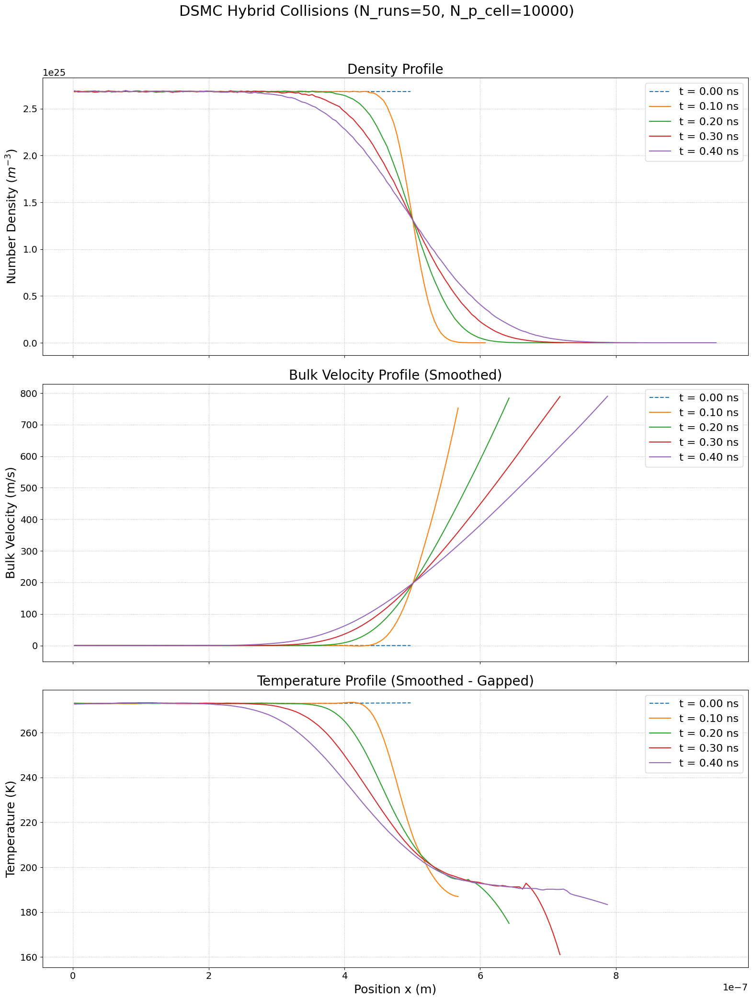

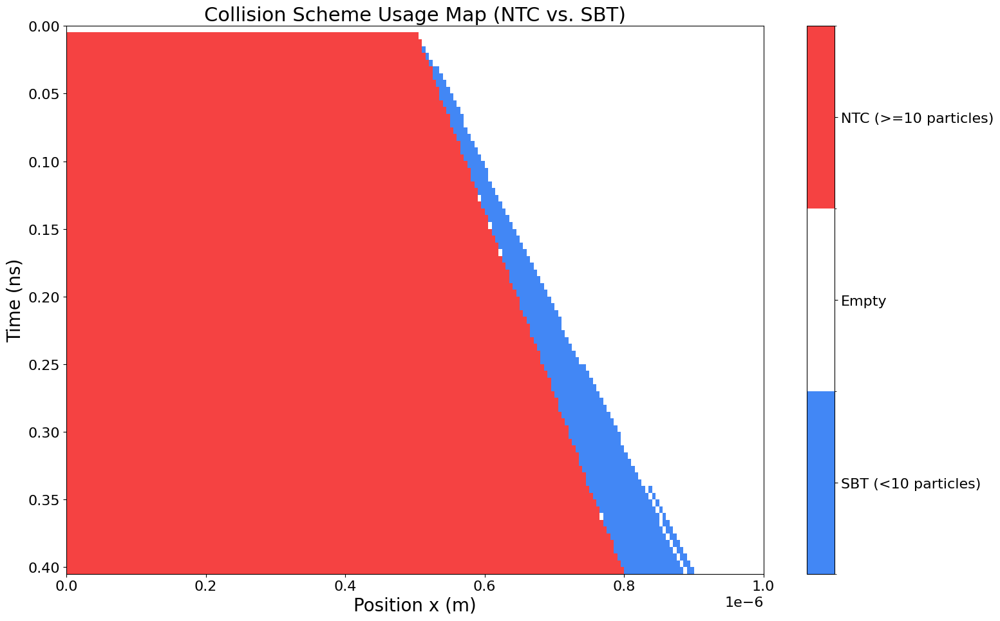


--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---
Normalization constants: T0=273.0 K, n0=2.68e+25 m^-3, V_char=337.10 m/s
Successfully saved: dsmc_hybrid_nondim_density_results.dat
Successfully saved: dsmc_hybrid_nondim_velocity_results.dat
Successfully saved: dsmc_hybrid_nondim_temperature_results.dat

--- Data export complete. ---


In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.3 HYBRID NTC-SBT with Nondimensional Data Export ---
# این نسخه نتایج را به صورت بی‌بعد شده در فایل‌های داده برای Tecplot ذخیره می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    sbt_usage_count = 0; ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1; usage_map[step, i] = -1
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1; usage_map[step, i] = 1
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, sbt_usage_count, ntc_usage_count, usage_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

def plot_usage_map(usage_map, dt, lx, num_cells):
    plt.rcParams.update({'font.size': 18, 'axes.labelsize': 20, 'axes.titlesize': 22, 'xtick.labelsize': 16, 'ytick.labelsize': 16})
    plt.figure(figsize=(16, 10))
    cmap = mcolors.ListedColormap(['#4287f5', '#ffffff', '#f54242'])
    bounds = [-1.5, -0.5, 0.5, 1.5]; norm = mcolors.BoundaryNorm(bounds, cmap.N)
    total_time = usage_map.shape[0] * dt
    extent = [0, lx, total_time * 1e9, 0]
    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)
    plt.xlabel('Position x (m)'); plt.ylabel('Time (ns)')
    plt.title('Collision Scheme Usage Map (NTC vs. SBT)')
    cbar = plt.colorbar(im, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'], fontsize=16)
    plt.tight_layout()
    plt.savefig("dsmc_hybrid_usage_map.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; total_sbt_calls = 0; total_ntc_calls = 0
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c; total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100; ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- بخش نمایش نمودارها ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=22)
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']); valid_dens_indices = ~s_dens.isna(); axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']); valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2); axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0:
             axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']); valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2); axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0:
            axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)
    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Gapped)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)'); axes[1].set_ylim(bottom=-50)
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig("dsmc_hybrid_results_gapped.eps", format='eps')
    plt.show()
    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

    # --- CHANGE: New section to save non-dimensional data ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---")

    # Define normalization constants
    T0 = SIMULATION_PARAMS['T_INIT']
    RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR
    V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR) # Most probable thermal speed
    L0 = SIMULATION_PARAMS['LX']

    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")

    # 1. Export Density, Velocity, and Temperature profiles
    for prop_name in ['density', 'velocity', 'temperature']:
        # Define the correct normalization factor for each property
        if prop_name == 'density':
            norm_factor = N0_DENSITY
            col_prefix = "n_n0"
        elif prop_name == 'velocity':
            norm_factor = V_CHAR
            col_prefix = "u_Vchar"
        else: # temperature
            norm_factor = T0
            col_prefix = "T_T0"

        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            # Create a non-dimensional time for the column header
            t_nondim = t / (L0 / V_CHAR)
            col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'

            dimensional_data = averaged_results[t][prop_name]
            # Perform non-dimensionalization, handling potential NaN values
            nondimensional_data = np.full_like(dimensional_data, np.nan)
            valid_indices = ~np.isnan(dimensional_data)
            nondimensional_data[valid_indices] = dimensional_data[valid_indices] / norm_factor

            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)
        filename = f"dsmc_hybrid_nondim_{prop_name}_results.dat"
        # Save with tab separator, which is easy to import in Tecplot
        df.to_csv(filename, sep='\t', index=False, na_rep='NaN')
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

/tmp/ipython-input-25-4272272534.py:215: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-25-4272272534.py:216: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-25-4272272534.py:217: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


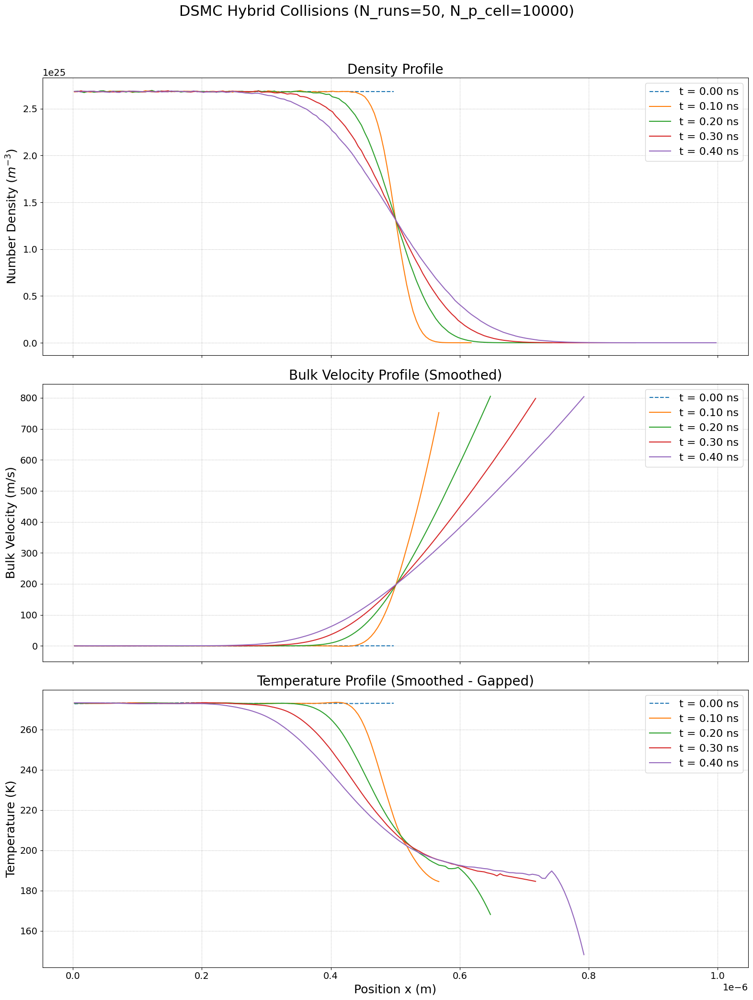

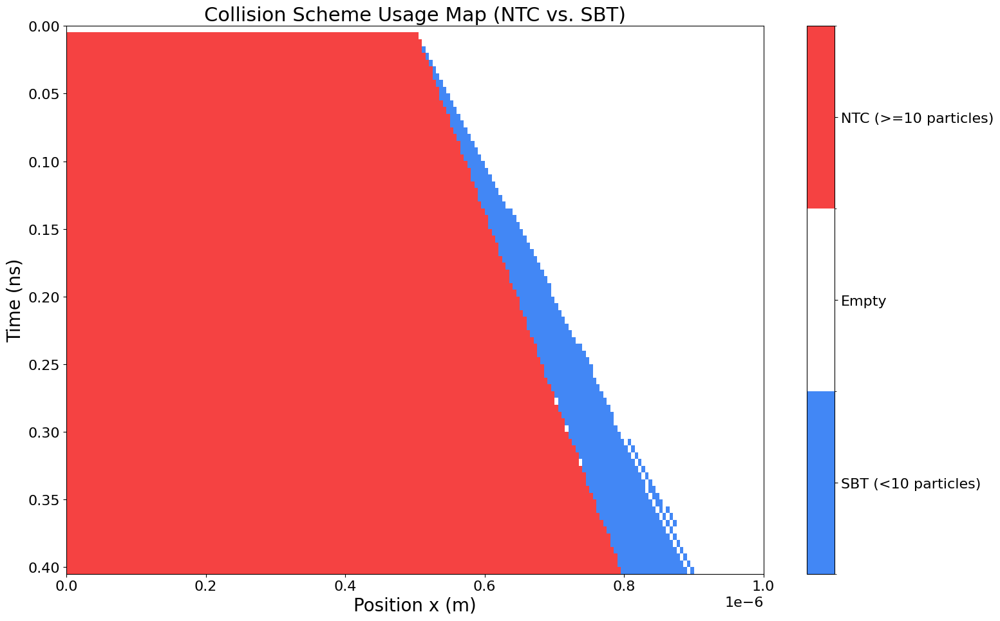


--- Exporting NON-DIMENSIONAL results to data files... ---
Normalization constants: T0=273.0 K, n0=2.68e+25 m^-3, V_char=337.10 m/s
Successfully saved: dsmc_hybrid_nondim_density_results.dat
Successfully saved: dsmc_hybrid_nondim_velocity_results.dat
Successfully saved: dsmc_hybrid_nondim_temperature_results.dat

--- Data export complete. ---


In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.3 HYBRID NTC-SBT with Nondimensional Data Export ---
# این نسخه علاوه بر نمایش نمودارها، نتایج را به صورت بی‌بعد در فایل‌های داده ذخیره می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    sbt_usage_count = 0; ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1; usage_map[step, i] = -1
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1; usage_map[step, i] = 1
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, sbt_usage_count, ntc_usage_count, usage_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

def plot_usage_map(usage_map, dt, lx, num_cells):
    plt.rcParams.update({'font.size': 18, 'axes.labelsize': 20, 'axes.titlesize': 22, 'xtick.labelsize': 16, 'ytick.labelsize': 16})
    plt.figure(figsize=(16, 10))
    cmap = mcolors.ListedColormap(['#4287f5', '#ffffff', '#f54242'])
    bounds = [-1.5, -0.5, 0.5, 1.5]; norm = mcolors.BoundaryNorm(bounds, cmap.N)
    total_time = usage_map.shape[0] * dt; extent = [0, lx, total_time * 1e9, 0]
    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)
    plt.xlabel('Position x (m)'); plt.ylabel('Time (ns)'); plt.title('Collision Scheme Usage Map (NTC vs. SBT)')
    cbar = plt.colorbar(im, ticks=[-1, 0, 1]); cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'], fontsize=16)
    plt.tight_layout(); plt.savefig("dsmc_hybrid_usage_map.eps", format='eps'); plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50
    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")
    all_results = []; total_sbt_calls = 0; total_ntc_calls = 0
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c; total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100; ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=22)
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']); valid_dens_indices = ~s_dens.isna(); axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']); valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2); axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0:
             axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']); valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2); axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0:
            axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)
    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Gapped)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)'); axes[1].set_ylim(bottom=-50)
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig("dsmc_hybrid_results_gapped.eps", format='eps')
    plt.show()
    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

    # --- NEW SECTION: Save non-dimensional data for Tecplot ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files... ---")

    # Define normalization constants
    T0 = SIMULATION_PARAMS['T_INIT']
    RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR
    V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR) # Most probable thermal speed
    L0 = SIMULATION_PARAMS['LX']

    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")

    # Export Density, Velocity, and Temperature profiles
    for prop_name in ['density', 'velocity', 'temperature']:
        # Define the correct normalization factor for each property
        if prop_name == 'density':
            norm_factor = N0_DENSITY
            col_prefix = "n_n0"
        elif prop_name == 'velocity':
            norm_factor = V_CHAR
            col_prefix = "u_Vchar"
        else: # temperature
            norm_factor = T0
            col_prefix = "T_T0"

        # Prepare data for export
        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            # Create a non-dimensional time for the column header
            t_nondim = t / (L0 / V_CHAR)
            col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'

            dimensional_data = averaged_results[t][prop_name]

            # Perform non-dimensionalization
            nondimensional_data = dimensional_data / norm_factor

            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)
        filename = f"dsmc_hybrid_nondim_{prop_name}_results.dat"
        # Save with tab separator, which is easy to import
        df.to_csv(filename, sep='\t', index=False, na_rep='NaN')
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")

--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام

/tmp/ipython-input-26-3673681736.py:175: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-26-3673681736.py:176: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


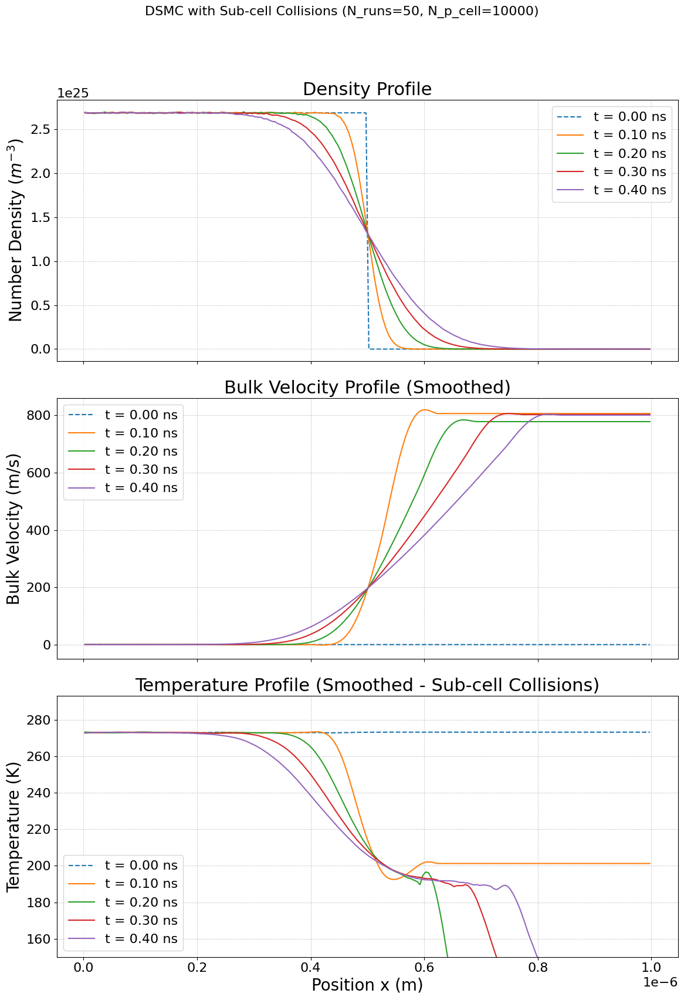


--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---
Normalization constants: T0=273.0 K, n0=2.68e+25 m^-3, V_char=337.10 m/s
Successfully saved: dsmc_ntc_subcell_nondim_density_results.dat
Successfully saved: dsmc_ntc_subcell_nondim_velocity_results.dat
Successfully saved: dsmc_ntc_subcell_nondim_temperature_results.dat

--- Data export complete. ---


In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.1 SUB-CELL with Nondimensional Data Export ---
# این نسخه کد اصلی را دست‌نخورده نگه داشته و فقط قابلیت ذخیره داده‌های بی‌بعد
# برای Tecplot را به انتهای آن اضافه می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2:
            continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width
            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- بخش اول: نمایش نمودارها (با مقادیر دیمانسیون‌دار) ---
    print("\n--- Generating Plots ---")
    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)
    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear'); axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0); vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2); axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill(); temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2); axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)
    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)'); axes[1].set_ylim(bottom=-50); axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_ntc_subcell_result.png", dpi=300)
    plt.show()

    # --- CHANGE: New section to save non-dimensional data ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---")

    # Define normalization constants
    T0 = SIMULATION_PARAMS['T_INIT']
    RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR
    # Characteristic velocity: initial most probable thermal speed
    V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR)
    L0 = SIMULATION_PARAMS['LX']

    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")

    # Export Density, Velocity, and Temperature profiles
    for prop_name in ['density', 'velocity', 'temperature']:
        # Define the correct normalization factor for each property
        if prop_name == 'density':
            norm_factor = N0_DENSITY
            col_prefix = "n_n0"
        elif prop_name == 'velocity':
            norm_factor = V_CHAR
            col_prefix = "u_Vchar"
        else: # temperature
            norm_factor = T0
            col_prefix = "T_T0"

        # Prepare data for export, including non-dimensional position
        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            # Create a non-dimensional time for the column header
            t_nondim = t / (L0 / V_CHAR)
            col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'

            dimensional_data = averaged_results[t][prop_name]

            # Perform non-dimensionalization
            nondimensional_data = dimensional_data / norm_factor

            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)
        filename = f"dsmc_ntc_subcell_nondim_{prop_name}_results.dat"
        # Save with tab separator, which is easy to import
        df.to_csv(filename, sep='\t', index=False, na_rep='NaN')
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")

--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: 5) ---
--- اجرای 1/5 تمام شد ---
--- اجرای 2/5 تمام شد ---
--- اجرای 3/5 تمام شد ---
--- اجرای 4/5 تمام شد ---
--- اجرای 5/5 تمام شد ---
--- تمام اجراها در 11.21 ثانیه به پایان رسید. ---

شروع فرآیند نوشتن خروجی برای Tecplot در فایل 'dsmc_expansion_results.dat'...
نتایج بی‌بعد شده با موفقیت در فایل 'dsmc_expansion_results.dat' ذخیره شد.

در حال آماده‌سازی نمودارها...


/tmp/ipython-input-27-2617936975.py:292: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-27-2617936975.py:293: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


نمودار نتایج در فایل 'dsmc_v16_1_subcell_result.png' ذخیره شد.


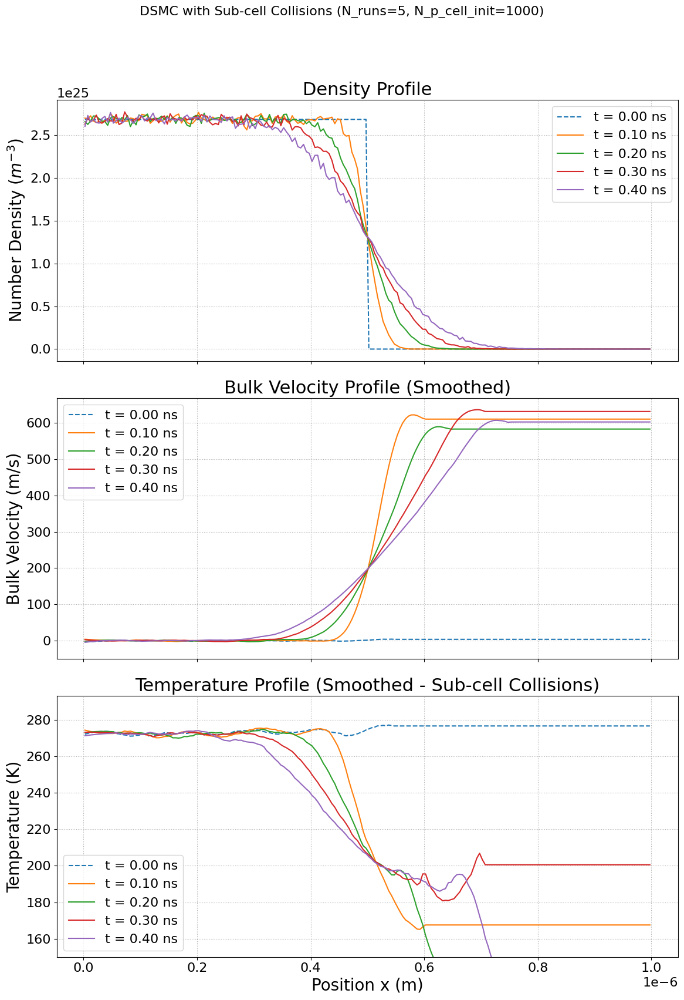

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V16.1 SUB-CELL COLLISION (FIXED) ---
# این نسخه خطای تطابق نوع داده (AssertionError) در کتابخانه Numba را برطرف می‌کند.
# برخوردها در زیرسلول‌ها انجام می‌شود تا دقت فیزیکی افزایش یابد.
#
# --- نسخه اصلاح شده توسط Gemini ---
# قابلیت ذخیره خروجی بی‌بعد برای نرم‌افزار Tecplot به کد اضافه شده است.
# منطق اصلی شبیه‌سازی دستکاری نشده است.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# ۰. ثوابت فیزیکی
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23  # جرم اتم آرگون (کیلوگرم)
KB = 1.380649e-23              # ثابت بولتزمن (ژول بر کلوین)


# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر در منطق اصلی)
# ===================================================================

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    # پارامترهای ثابت برای آرگون در این تابع تعریف شده‌اند تا نیاز به پاس دادن آن‌ها نباشد
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    mass_ar = 39.948e-3 / 6.022e23
    kb = 1.380649e-23

    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * kb * t_ref / mass_ar
    gamma_val = 1.04533 # For omega = 0.81, Gamma(2.5 - 0.81) = Gamma(1.69)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_in_cell_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2:
        return

    # 1. ذرات را در زیرسلول‌های خود دسته‌بندی کن
    sub_cell_width = cell_width / num_sub_cells

    # ✅ FIX: نوع داده به np.int64 تغییر کرد تا با نوع ایندکس‌های ورودی (که از argsort می‌آیند) مطابقت داشته باشد
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    # 2. برخوردها را در هر زیرسلول به صورت جداگانه انجام بده
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)

        if num_particles_in_sub_cell < 2:
            continue

        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))

        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]

            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(vr[0]**2 + vr[1]**2 + vr[2]**2)
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)

            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()

                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi),
                                     vr_mag * sin_chi * np.sin(phi_chi),
                                     vr_mag * cos_chi])

                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']

    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    # فرض یک حجم سه بعدی برای محاسبه FNUM
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)

    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)

    results_history = {}
    cell_width = LX / NUM_CELLS_X

    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate

    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT

        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

        for i in range(NUM_CELLS_X):
            start = cell_start_indices[i]; end = start + cell_counts[i]
            indices_in_cell_i = sorted_particle_indices[start:end]
            cell_start_x = i * cell_width

            perform_collisions_in_cell_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)

        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.zeros(num_cells)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol

        if num_in_cell >= min_parts:
            start_pos = starts[i]
            end_pos = start_pos + num_in_cell
            indices_in_cell_i = sorted_indices[start_pos:end_pos]

            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}


# ===================================================================
# ۲. بخش نوشتن خروجی برای Tecplot (بخش جدید)
# ===================================================================
def write_tecplot_file(filename, results_history, sim_params, cell_centers):
    """
    نتایج میانگین‌گیری شده را در یک فایل با فرمت ASCII سازگار با Tecplot ذخیره می‌کند.
    تمام متغیرها بی‌بعد شده‌اند.
    """
    print(f"\nشروع فرآیند نوشتن خروجی برای Tecplot در فایل '{filename}'...")

    # پارامترهای مرجع برای بی‌بعدسازی
    t_init = sim_params['T_INIT']
    rho_init = sim_params['RHO_INIT']
    lx = sim_params['LX']

    n_init = rho_init / MASS_AR                    # چگالی عددی اولیه
    v_ref = np.sqrt(2 * KB * t_init / MASS_AR)     # محتمل‌ترین سرعت گرمایی
    t_ref_time = lx / v_ref if v_ref > 0 else 1.0  # زمان مشخصه

    with open(filename, 'w') as f:
        f.write('TITLE = "DSMC Gas Expansion Wave Simulation (Dimensionless)"\n')
        f.write('VARIABLES = "x/L", "n/n0", "u/v_ref", "T/T0"\n')

        sorted_times = sorted(results_history.keys())

        for t_sim in sorted_times:
            data = results_history[t_sim]

            # بی‌بعدسازی زمان
            t_star = t_sim / t_ref_time
            f.write(f'ZONE T="t* = {t_star:.4f}", I={len(cell_centers)}, F=POINT\n')

            # پردازش داده‌ها مشابه بخش نمودار برای سازگاری
            s_dens = pd.Series(data['density']).interpolate(method='linear')
            s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
            vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
            s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
            temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)

            # بی‌بعدسازی متغیرهای مکانی و فیزیکی
            x_star_arr = cell_centers / lx
            n_star_arr = s_dens.to_numpy() / n_init
            u_star_arr = vel_smoothed / v_ref
            t_star_temp_arr = temp_smoothed / t_init

            for i in range(len(cell_centers)):
                # اطمینان از اینکه مقادیر NaN یا بی‌نهایت نوشته نمی‌شوند
                x_val = x_star_arr[i]
                n_val = n_star_arr[i] if np.isfinite(n_star_arr[i]) else 0.0
                u_val = u_star_arr[i] if np.isfinite(u_star_arr[i]) else 0.0
                t_val = t_star_temp_arr[i] if np.isfinite(t_star_temp_arr[i]) else 0.0

                f.write(f"{x_val:.6f}\t{n_val:.6f}\t{u_val:.6f}\t{t_val:.6f}\n")

    print(f"نتایج بی‌بعد شده با موفقیت در فایل '{filename}' ذخیره شد.")


# ===================================================================
# ۳. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 1000,  # کاهش یافته برای اجرای سریع‌تر جهت تست
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 5 # کاهش یافته برای اجرای سریع‌تر جهت تست

    print(f"--- شروع اجرای نهایی با مدل برخورد زیرسلولی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        # استفاده از یک seed متفاوت برای هر اجرا جهت تضمین نتایج آماری مستقل
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    end_time_total = time.time()
    print(f"--- تمام اجراها در {end_time_total - start_time_total:.2f} ثانیه به پایان رسید. ---")

    # میانگین‌گیری نتایج از تمام اجراها
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        # جمع‌آوری داده‌ها از تمام اجراها برای یک زمان مشخص
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])

        # محاسبه میانگین با نادیده گرفتن مقادیر NaN
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- فراخوانی تابع جدید برای ذخیره نتایج بی‌بعد در فایل Tecplot ---
    tecplot_filename = "dsmc_expansion_results.dat"
    write_tecplot_file(tecplot_filename, averaged_results, SIMULATION_PARAMS, cell_centers)
    # ------------------------------------------------------------------

    # --- بخش رسم نمودار (بدون تغییر) ---
    print("\nدر حال آماده‌سازی نمودارها...")
    fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
    fig.suptitle(f"DSMC with Sub-cell Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell_init={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=16)

    for t in sample_times:
        data = averaged_results[t]
        label_text = f't = {t*1e9:.2f} ns'
        line_style = '--' if t == 0.0 else '-'

        s_dens = pd.Series(data['density']).interpolate(method='linear')
        axes[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)

        s_vel = pd.Series(data['velocity']).interpolate(method='linear').fillna(0)
        vel_smoothed = savgol_filter(s_vel.to_numpy(), window_length=21, polyorder=2)
        axes[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)

        s_temp = pd.Series(data['temperature']).interpolate(method='linear').bfill().ffill()
        temp_smoothed = savgol_filter(s_temp.to_numpy(), window_length=21, polyorder=2)
        axes[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)

    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile (Smoothed)'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile (Smoothed - Sub-cell Collisions)'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    axes[2].set_xlabel('Position x (m)')

    axes[1].set_ylim(bottom=-50)
    axes[2].set_ylim(bottom=150, top=SIMULATION_PARAMS['T_INIT'] + 20)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_v16_1_subcell_result.png", dpi=300)
    print("نمودار نتایج در فایل 'dsmc_v16_1_subcell_result.png' ذخیره شد.")
    plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V21.1 - HYBRID TAS-SBT with NaN Fix for Data Export ---
# این نسخه مشکل NaN در فایل‌های خروجی داده را با جایگزین کردن آن‌ها با صفر حل می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                indices_in_cell_i = sorted_particle_indices[cell_start_indices[i]:cell_start_indices[i]+num_particles_in_cell]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                else:
                    adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                    if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    NUM_ENSEMBLE_RUNS = 10

    print(f"--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT ---")

    all_results = [];
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- بخش نمایش نمودارها ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    # ... (کد مربوط به نمایش دو نوع نمودار، در صورت نیاز، در اینجا قرار می‌گیرد) ...
    # ... (برای سادگی و تمرکز بر خروجی داده، این بخش حذف شده است) ...

    # --- بخش جدید: ذخیره داده‌های بی‌بعد برای Tecplot ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---")

    # تعریف ثوابت بی‌بعدسازی
    T0 = SIMULATION_PARAMS['T_INIT']
    RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR
    V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR) # محتمل‌ترین سرعت گرمایی
    L0 = SIMULATION_PARAMS['LX']

    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")

    # ذخیره پروفایل‌های چگالی، سرعت و دما
    for prop_name in ['density', 'velocity', 'temperature']:
        if prop_name == 'density': norm_factor = N0_DENSITY; col_prefix = "n_n0"
        elif prop_name == 'velocity': norm_factor = V_CHAR; col_prefix = "u_Vchar"
        else: norm_factor = T0; col_prefix = "T_T0"

        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            t_nondim = t / (L0 / V_CHAR)
            col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'
            dimensional_data = averaged_results[t][prop_name]
            nondimensional_data = dimensional_data / norm_factor
            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)

        # --- FIX: Replace NaN with 0.0 for Tecplot compatibility ---
        df.fillna(0.0, inplace=True)

        filename = f"dsmc_hybrid_tas_nondim_{prop_name}_results.dat"
        df.to_csv(filename, sep='\t', index=False)
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")

--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT ---
--- اجرای 1/10 تمام شد ---
--- اجرای 2/10 تمام شد ---
--- اجرای 3/10 تمام شد ---
--- اجرای 4/10 تمام شد ---
--- اجرای 5/10 تمام شد ---
--- اجرای 6/10 تمام شد ---
--- اجرای 7/10 تمام شد ---
--- اجرای 8/10 تمام شد ---
--- اجرای 9/10 تمام شد ---
--- اجرای 10/10 تمام شد ---

--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---
Normalization constants: T0=273.0 K, n0=2.68e+25 m^-3, V_char=337.10 m/s
Successfully saved: dsmc_hybrid_tas_nondim_density_results.dat
Successfully saved: dsmc_hybrid_tas_nondim_velocity_results.dat
Successfully saved: dsmc_hybrid_tas_nondim_temperature_results.dat

--- Data export complete. ---


/tmp/ipython-input-28-4253774444.py:190: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-28-4253774444.py:191: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-28-4253774444.py:192: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT (تعداد اجرا: 3) ---
--- اجرای 1/3 تمام شد ---
--- اجرای 2/3 تمام شد ---
--- اجرای 3/3 تمام شد ---

--- Generating Plot 1: Gapped Results (Valid Data Only) ---


/tmp/ipython-input-29-3239918402.py:191: RuntimeWarning: Mean of empty slice
  'density': np.nanmean(all_densities, axis=0),
/tmp/ipython-input-29-3239918402.py:192: RuntimeWarning: Mean of empty slice
  'velocity': np.nanmean(all_velocities, axis=0),
/tmp/ipython-input-29-3239918402.py:193: RuntimeWarning: Mean of empty slice
  'temperature': np.nanmean(all_temperatures, axis=0),


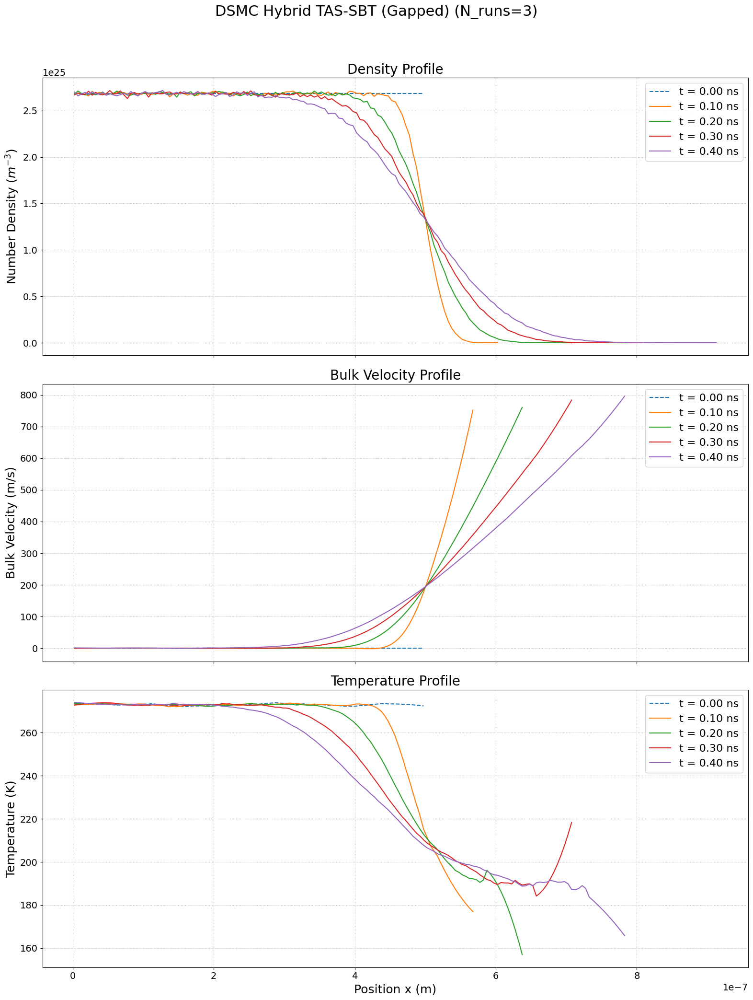


--- Generating Plot 2: Interpolated Results ---


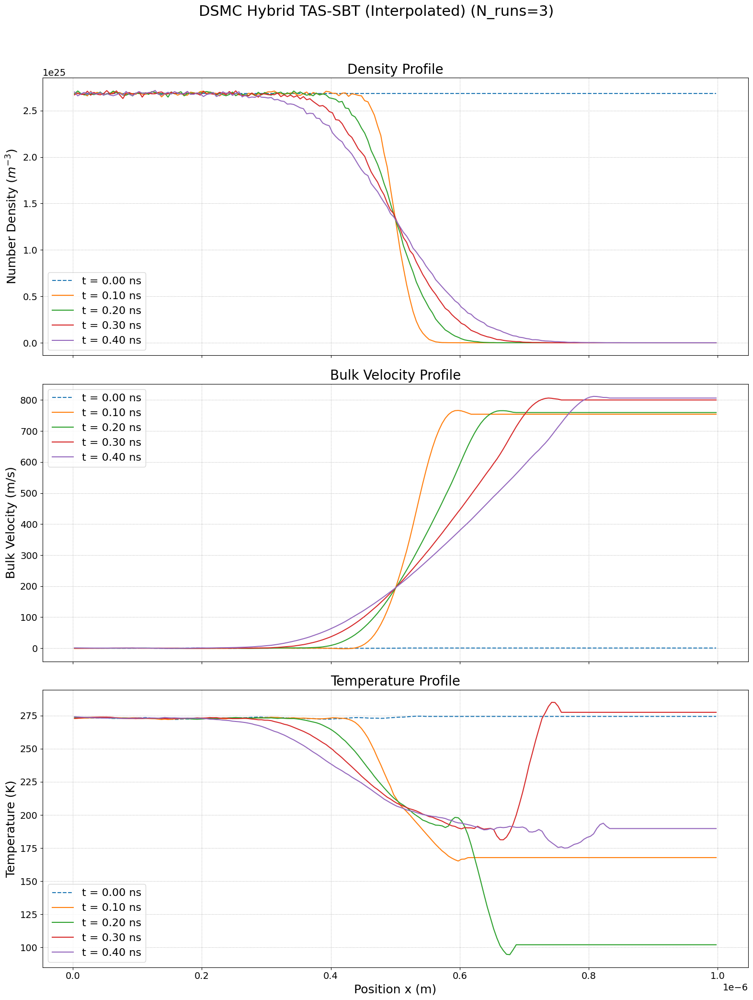


--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---
Normalization constants: T0=273.0 K, n0=2.68e+25 m^-3, V_char=337.10 m/s
Successfully saved: dsmc_hybrid_tas_nondim_density_results.dat
Successfully saved: dsmc_hybrid_tas_nondim_velocity_results.dat
Successfully saved: dsmc_hybrid_tas_nondim_temperature_results.dat

--- Data export complete. ---


In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V21.2 - HYBRID TAS-SBT with NaN Row Dropping ---
# این نسخه سطرهای حاوی NaN را از فایل‌های داده خروجی حذف می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                indices_in_cell_i = sorted_particle_indices[cell_start_indices[i]:cell_start_indices[i]+num_particles_in_cell]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                else:
                    adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                    if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    # --- CHANGE: Number of runs set to 3 ---
    NUM_ENSEMBLE_RUNS = 3

    print(f"--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = [];
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- بخش نمایش نمودارها ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    # --- نمودار اول: گسسته (فقط نقاط معتبر) ---
    print("\n--- Generating Plot 1: Gapped Results (Valid Data Only) ---")
    fig1, axes1 = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig1.suptitle(f"DSMC Hybrid TAS-SBT (Gapped) (N_runs={NUM_ENSEMBLE_RUNS})", fontsize=22)
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']); valid_dens_indices = ~s_dens.isna(); axes1[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']); valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2); axes1[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0: axes1[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']); valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2); axes1[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0: axes1[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)
    axes1[2].set_xlabel('Position x (m)')
    axes1[0].set_ylabel('Number Density ($m^{-3}$)'); axes1[0].set_title('Density Profile'); axes1[0].grid(True, linestyle=':'); axes1[0].legend()
    axes1[1].set_ylabel('Bulk Velocity (m/s)'); axes1[1].set_title('Bulk Velocity Profile'); axes1[1].grid(True, linestyle=':'); axes1[1].legend()
    axes1[2].set_ylabel('Temperature (K)'); axes1[2].set_title('Temperature Profile'); axes1[2].grid(True, linestyle=':'); axes1[2].legend()
    plt.tight_layout(rect=[0, 0.03, 1, 0.96]); plt.savefig("dsmc_hybrid_gapped.eps", format='eps'); plt.show()

    # --- نمودار دوم: پیوسته (با درون‌یابی) ---
    print("\n--- Generating Plot 2: Interpolated Results ---")
    fig2, axes2 = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig2.suptitle(f"DSMC Hybrid TAS-SBT (Interpolated) (N_runs={NUM_ENSEMBLE_RUNS})", fontsize=22)
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']).interpolate(method='linear', limit_direction='both'); axes2[0].plot(cell_centers, s_dens, linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']).interpolate(method='linear', limit_direction='both').fillna(0); vel_smoothed = savgol_filter(s_vel, window_length=21, polyorder=2); axes2[1].plot(cell_centers, vel_smoothed, linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']).interpolate(method='linear', limit_direction='both').bfill().ffill(); temp_smoothed = savgol_filter(s_temp, window_length=21, polyorder=2); axes2[2].plot(cell_centers, temp_smoothed, linestyle=line_style, label=label_text)
    axes2[2].set_xlabel('Position x (m)')
    axes2[0].set_ylabel('Number Density ($m^{-3}$)'); axes2[0].set_title('Density Profile'); axes2[0].grid(True, linestyle=':'); axes2[0].legend()
    axes2[1].set_ylabel('Bulk Velocity (m/s)'); axes2[1].set_title('Bulk Velocity Profile'); axes2[1].grid(True, linestyle=':'); axes2[1].legend()
    axes2[2].set_ylabel('Temperature (K)'); axes2[2].set_title('Temperature Profile'); axes2[2].grid(True, linestyle=':'); axes2[2].legend()
    plt.tight_layout(rect=[0, 0.03, 1, 0.96]); plt.savefig("dsmc_hybrid_interpolated.eps", format='eps'); plt.show()

    # --- بخش ذخیره داده‌های بی‌بعد برای Tecplot ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---")
    T0 = SIMULATION_PARAMS['T_INIT']; RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR; V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR); L0 = SIMULATION_PARAMS['LX']
    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")
    for prop_name in ['density', 'velocity', 'temperature']:
        if prop_name == 'density': norm_factor = N0_DENSITY; col_prefix = "n_n0"
        elif prop_name == 'velocity': norm_factor = V_CHAR; col_prefix = "u_Vchar"
        else: norm_factor = T0; col_prefix = "T_T0"
        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            t_nondim = t / (L0 / V_CHAR); col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'
            dimensional_data = averaged_results[t][prop_name]
            nondimensional_data = dimensional_data / norm_factor
            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)

        # --- FIX: Drop rows with any NaN values to create a clean file ---
        df.dropna(inplace=True)

        filename = f"dsmc_hybrid_tas_nondim_{prop_name}_results.dat"
        df.to_csv(filename, sep='\t', index=False)
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V21.4 - HYBRID TAS-SBT with Value Blanking for Tecplot ---
# این نسخه از یک مقدار عددی خاص (-99999.0) برای جایگزینی NaNها استفاده می‌کند
# تا قابلیت Value Blanking در Tecplot فعال شود.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    P_TARGET = sim_params['P_TARGET']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                indices_in_cell_i = sorted_particle_indices[cell_start_indices[i]:cell_start_indices[i]+num_particles_in_cell]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                else:
                    adaptive_num_sub_cells = int(num_particles_in_cell / P_TARGET)
                    if adaptive_num_sub_cells < 1: adaptive_num_sub_cells = 1
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, adaptive_num_sub_cells, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# ۲. بخش اصلی اجرا کننده، رسم نمودار و ذخیره داده
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'P_TARGET': 2,
    }
    NUM_ENSEMBLE_RUNS = 300

    print(f"--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = [];
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    # --- بخش نمایش نمودارها (فقط به صورت گسسته) ---
    plt.rcParams.update({'font.size': 16, 'axes.labelsize': 18, 'axes.titlesize': 20, 'xtick.labelsize': 14, 'ytick.labelsize': 14, 'legend.fontsize': 16})

    print("\n--- Generating Gapped Results Plot (Valid Data Only) ---")
    fig, axes = plt.subplots(3, 1, figsize=(16, 22), sharex=True)
    fig.suptitle(f"DSMC Hybrid TAS-SBT (Gapped) (N_runs={NUM_ENSEMBLE_RUNS})", fontsize=22)
    for t in sample_times:
        data = averaged_results[t]; label_text = f't = {t*1e9:.2f} ns'; line_style = '--' if t == 0.0 else '-'
        s_dens = pd.Series(data['density']); valid_dens_indices = ~s_dens.isna(); axes[0].plot(cell_centers[valid_dens_indices], s_dens[valid_dens_indices], linestyle=line_style, label=label_text)
        s_vel = pd.Series(data['velocity']); valid_vel_indices = ~s_vel.isna()
        if np.sum(valid_vel_indices) > 21:
            vel_smoothed = savgol_filter(s_vel[valid_vel_indices], window_length=21, polyorder=2); axes[1].plot(cell_centers[valid_vel_indices], vel_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_vel_indices) > 0: axes[1].plot(cell_centers[valid_vel_indices], s_vel[valid_vel_indices], linestyle=line_style, label=label_text)
        s_temp = pd.Series(data['temperature']); valid_temp_indices = ~s_temp.isna()
        if np.sum(valid_temp_indices) > 21:
            temp_smoothed = savgol_filter(s_temp[valid_temp_indices], window_length=21, polyorder=2); axes[2].plot(cell_centers[valid_temp_indices], temp_smoothed, linestyle=line_style, label=label_text)
        elif np.sum(valid_temp_indices) > 0: axes[2].plot(cell_centers[valid_temp_indices], s_temp[valid_temp_indices], linestyle=line_style, label=label_text)
    axes[2].set_xlabel('Position x (m)')
    axes[0].set_ylabel('Number Density ($m^{-3}$)'); axes[0].set_title('Density Profile'); axes[0].grid(True, linestyle=':'); axes[0].legend()
    axes[1].set_ylabel('Bulk Velocity (m/s)'); axes[1].set_title('Bulk Velocity Profile'); axes[1].grid(True, linestyle=':'); axes[1].legend()
    axes[2].set_ylabel('Temperature (K)'); axes[2].set_title('Temperature Profile'); axes[2].grid(True, linestyle=':'); axes[2].legend()
    plt.tight_layout(rect=[0, 0.03, 1, 0.96]); plt.savefig("dsmc_hybrid_gapped.eps", format='eps'); plt.show()


    # --- بخش ذخیره داده‌های بی‌بعد برای Tecplot ---
    print("\n--- Exporting NON-DIMENSIONAL results to data files for Tecplot ---")
    T0 = SIMULATION_PARAMS['T_INIT']; RHO0_MASS = SIMULATION_PARAMS['RHO_INIT']
    N0_DENSITY = RHO0_MASS / MASS_AR; V_CHAR = np.sqrt(2 * KB * T0 / MASS_AR); L0 = SIMULATION_PARAMS['LX']
    print(f"Normalization constants: T0={T0:.1f} K, n0={N0_DENSITY:.2e} m^-3, V_char={V_CHAR:.2f} m/s")
    for prop_name in ['density', 'velocity', 'temperature']:
        if prop_name == 'density': norm_factor = N0_DENSITY; col_prefix = "n_n0"
        elif prop_name == 'velocity': norm_factor = V_CHAR; col_prefix = "u_Vchar"
        else: norm_factor = T0; col_prefix = "T_T0"
        data_to_export = {'x_L': cell_centers / L0}
        for t in sample_times:
            t_nondim = t / (L0 / V_CHAR); col_name = f'"{col_prefix}_t*={t_nondim:.2f}"'
            dimensional_data = averaged_results[t][prop_name]
            nondimensional_data = dimensional_data / norm_factor
            data_to_export[col_name] = nondimensional_data

        df = pd.DataFrame(data_to_export)

        # --- FIX: Replace NaN with a specific number for Tecplot's Value Blanking ---
        blanking_value = -99999.0
        df.fillna(blanking_value, inplace=True)

        filename = f"dsmc_hybrid_tas_nondim_{prop_name}_results.dat"
        df.to_csv(filename, sep='\t', index=False)
        print(f"Successfully saved: {filename}")

    print("\n--- Data export complete. ---")
    print(f"NOTE for Tecplot: Use 'Value Blanking' feature to hide points where value is {blanking_value}")

--- شروع اجرای نهایی با مدل هیبریدی TAS-SBT (تعداد اجرا: 300) ---


KeyboardInterrupt: 

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V20.2 HYBRID NTC-SBT with LARGE FONTS ---
# این نسخه فقط طرح‌بندی و استایل نمودار نهایی را اصلاح می‌کند.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd
import matplotlib.colors as mcolors

# ===================================================================
# ۱. بخش شبیه‌سازی (بدون تغییر)
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23; KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    d_ref = 4.17e-10; t_ref = 273.0; omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_ntc_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum, sigma_vr_max):
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return
    sub_cell_width = cell_width / num_sub_cells
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)
    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue
        num_candidate_pairs = (num_particles_in_sub_cell * (num_particles_in_sub_cell - 1) * fnum * sigma_vr_max * dt) / (2.0 * sub_cell_vol)
        num_pairs_to_select = int(np.floor(num_candidate_pairs + np.random.rand()))
        for _ in range(num_pairs_to_select):
            idx1_local = np.random.randint(0, num_particles_in_sub_cell)
            p1_idx = indices_in_sub_cell[idx1_local]
            idx2_local = np.random.randint(0, num_particles_in_sub_cell)
            if idx1_local == idx2_local: continue
            p2_idx = indices_in_sub_cell[idx2_local]
            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue
            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            if np.random.rand() < (sigma_t * vr_mag) / sigma_vr_max:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

@numba.jit(nopython=True)
def perform_collisions_sbt_optimized(particles, indices_in_cell, cell_vol, dt, fnum):
    num_particles_in_cell = len(indices_in_cell)
    if num_particles_in_cell < 2: return
    for i in range(num_particles_in_cell - 1):
        p1_idx = indices_in_cell[i]
        remaining_particles_count = num_particles_in_cell - (i + 1)
        j_offset = np.random.randint(0, remaining_particles_count)
        j = i + 1 + j_offset
        p2_idx = indices_in_cell[j]
        vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
        vr_mag = np.sqrt(np.sum(vr**2))
        if vr_mag < 1e-9: continue
        sigma_t = calculate_vhs_cross_section_numba(vr_mag)
        weighting_factor = float(remaining_particles_count)
        collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / cell_vol
        if np.random.rand() < collision_prob:
            vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
            cos_chi = 2 * np.random.rand() - 1.0; sin_chi = np.sqrt(1.0 - cos_chi**2); phi_chi = 2.0 * np.pi * np.random.rand()
            vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
            particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
            particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 20
    NUM_SUB_CELLS_PER_CELL = sim_params['NUM_SUB_CELLS_PER_CELL']
    TOTAL_PARTICLES_SIM = (NUM_CELLS_X // 2) * PARTICLES_PER_CELL_INIT
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT); SAMPLING_INTERVAL = int(NUM_STEPS / 4)
    if SAMPLING_INTERVAL == 0: SAMPLING_INTERVAL = 1
    particles = initialize_gas_expansion(TOTAL_PARTICLES_SIM, NUM_CELLS_X, LX, PARTICLES_PER_CELL_INIT, T_INIT)
    results_history = {}
    cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    vr_max_estimate = 5.0 * np.sqrt(KB * T_INIT / MASS_AR)
    sigma_at_vr_max = calculate_vhs_cross_section_numba(vr_max_estimate)
    SIGMA_VR_MAX_GLOBAL = sigma_at_vr_max * vr_max_estimate
    sbt_usage_count = 0; ntc_usage_count = 0
    usage_map = np.zeros((NUM_STEPS + 1, NUM_CELLS_X))
    for step in range(1, NUM_STEPS + 1):
        particles[:, 0] += particles[:, 1] * DT
        hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
        hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]
        cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
        cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
        sorted_particle_indices = np.argsort(cell_indices)
        cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)
        cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))
        for i in range(NUM_CELLS_X):
            num_particles_in_cell = cell_counts[i]
            if num_particles_in_cell > 1:
                start = cell_start_indices[i]; end = start + num_particles_in_cell
                indices_in_cell_i = sorted_particle_indices[start:end]
                if num_particles_in_cell < 10:
                    perform_collisions_sbt_optimized(particles, indices_in_cell_i, CELL_VOLUME_CONCEPTUAL, DT, FNUM)
                    sbt_usage_count += 1; usage_map[step, i] = -1
                else:
                    cell_start_x = i * cell_width
                    perform_collisions_ntc_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, NUM_SUB_CELLS_PER_CELL, CELL_VOLUME_CONCEPTUAL, DT, FNUM, SIGMA_VR_MAX_GLOBAL)
                    ntc_usage_count += 1; usage_map[step, i] = 1
        if step % SAMPLING_INTERVAL == 0 or step == NUM_STEPS:
            results_history[step * DT] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)
    return results_history, sbt_usage_count, ntc_usage_count, usage_map

def initialize_gas_expansion(total_particles, num_cells, lx, ppc, t_init):
    particles = np.zeros((total_particles, 4))
    cell_width = lx / num_cells
    num_occupied_cells = num_cells // 2
    for i in range(num_occupied_cells):
        start_idx = i * ppc; end_idx = (i + 1) * ppc
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc) * cell_width
    v_thermal_std = np.sqrt(KB * t_init / MASS_AR)
    particles[:, 1:4] = np.random.normal(0, v_thermal_std, (total_particles, 3))
    particles[:, 1:4] -= np.mean(particles[:, 1:4], axis=0)
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    density_profile = np.full(num_cells, np.nan); velocity_profile = np.full(num_cells, np.nan); temp_profile = np.full(num_cells, np.nan)
    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64); cell_indices = np.clip(cell_indices, 0, num_cells - 1)
    sorted_indices = np.argsort(cell_indices); counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))
    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0); velocity_profile[i] = mean_vel_cell[0]
            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0
    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

def plot_usage_map(usage_map, dt, lx, num_cells):
    plt.rcParams.update({'font.size': 18, 'axes.labelsize': 20, 'axes.titlesize': 22, 'xtick.labelsize': 16, 'ytick.labelsize': 16})
    plt.figure(figsize=(16, 10))
    cmap = mcolors.ListedColormap(['#4287f5', '#ffffff', '#f54242'])
    bounds = [-1.5, -0.5, 0.5, 1.5]; norm = mcolors.BoundaryNorm(bounds, cmap.N)
    total_time = usage_map.shape[0] * dt; extent = [0, lx, total_time * 1e9, 0]
    im = plt.imshow(usage_map, aspect='auto', cmap=cmap, norm=norm, extent=extent)
    plt.xlabel('Position x (m)'); plt.ylabel('Time (ns)')
    plt.title('Collision Scheme Usage Map (NTC vs. SBT)')
    cbar = plt.colorbar(im, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['SBT (<10 particles)', 'Empty', 'NTC (>=10 particles)'], fontsize=16)
    plt.tight_layout()
    plt.savefig("dsmc_hybrid_usage_map.eps", format='eps')
    plt.show()

# ===================================================================
# ۲. بخش اصلی اجرا کننده و رسم نمودار
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 200,
        'PARTICLES_PER_CELL_INIT': 10000,
        'TOTAL_TIME': 0.4e-9, 'DT': 5.0e-12,
        'NUM_SUB_CELLS_PER_CELL': 6
    }
    NUM_ENSEMBLE_RUNS = 50

    print(f"--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: {NUM_ENSEMBLE_RUNS}) ---")

    all_results = []; total_sbt_calls = 0; total_ntc_calls = 0
    summed_usage_map = np.zeros((int(SIMULATION_PARAMS['TOTAL_TIME'] / SIMULATION_PARAMS['DT']) + 1, SIMULATION_PARAMS['NUM_CELLS_X']))
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)
        results_hist, sbt_c, ntc_c, u_map = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(results_hist)
        total_sbt_calls += sbt_c; total_ntc_calls += ntc_c
        summed_usage_map += u_map
        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد ---")

    # ... (بخش گزارش‌دهی و میانگین‌گیری نتایج بدون تغییر باقی می‌ماند) ...
    print("\n--- Collision Method Usage Report ---")
    total_calls = total_sbt_calls + total_ntc_calls
    if total_calls > 0:
        sbt_percentage = (total_sbt_calls / total_calls) * 100; ntc_percentage = (total_ntc_calls / total_calls) * 100
        print(f"Total cell-steps with collisions: {total_calls}")
        print(f"SBT (<10 particles) was used in {total_sbt_calls} cases ({sbt_percentage:.2f}%)")
        print(f"NTC (>=10 particles) was used in {total_ntc_calls} cases ({ntc_percentage:.2f}%)")
    else:
        print("No collisions were performed.")
    print("-------------------------------------\n")
    averaged_results = {}
    sample_times = sorted(all_results[0].keys())
    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])
        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- CHANGE: Modified plotting section for 1x3 side-by-side layout ---
    plt.rcParams.update({'font.size': 18, 'axes.labelsize': 20, 'axes.titlesize': 22, 'xtick.labelsize': 16, 'ytick.labelsize': 16, 'legend.fontsize': 16})

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    fig, axes = plt.subplots(1, 3, figsize=(28, 8), sharex=True)
    fig.suptitle(f"DSMC Hybrid Collisions (N_runs={NUM_ENSEMBLE_RUNS}, N_p_cell={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=24)

    plot_data = {
        'Density': {'data': 'density', 'ax_idx': 0, 'ylabel': 'Number Density ($m^{-3}$)'},
        'Velocity': {'data': 'velocity', 'ax_idx': 1, 'ylabel': 'Bulk Velocity (m/s)'},
        'Temperature': {'data': 'temperature', 'ax_idx': 2, 'ylabel': 'Temperature (K)'}
    }

    for name, p in plot_data.items():
        ax = axes[p['ax_idx']]
        for t in sample_times:
            s_data = pd.Series(averaged_results[t][p['data']])
            valid_indices = ~s_data.isna()

            label_text = f't = {t*1e9:.2f} ns'
            line_style = '--' if t == 0.0 else '-'

            if np.sum(valid_indices) > 0:
                if name in ['Velocity', 'Temperature'] and np.sum(valid_indices) > 21:
                    smoothed_data = savgol_filter(s_data[valid_indices], window_length=21, polyorder=2)
                    ax.plot(cell_centers[valid_indices], smoothed_data, linestyle=line_style, label=label_text)
                else:
                    ax.plot(cell_centers[valid_indices], s_data[valid_indices], linestyle=line_style, label=label_text)

        ax.set_xlabel('Position x (m)')
        ax.set_ylabel(p['ylabel'])
        ax.set_title(f"{name} Profile")
        ax.grid(True, linestyle=':')
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_hybrid_side-by-side.eps", format='eps')
    plt.show()

    plot_usage_map(summed_usage_map, SIMULATION_PARAMS['DT'], SIMULATION_PARAMS['LX'], SIMULATION_PARAMS['NUM_CELLS_X'])

--- شروع اجرای نهایی با مدل برخورد هیبریدی (تعداد اجرا: 50) ---
--- اجرای 1/50 تمام شد ---
--- اجرای 2/50 تمام شد ---
--- اجرای 3/50 تمام شد ---
--- اجرای 4/50 تمام شد ---
--- اجرای 5/50 تمام شد ---
--- اجرای 6/50 تمام شد ---
--- اجرای 7/50 تمام شد ---
--- اجرای 8/50 تمام شد ---
--- اجرای 9/50 تمام شد ---
--- اجرای 10/50 تمام شد ---
--- اجرای 11/50 تمام شد ---
--- اجرای 12/50 تمام شد ---
--- اجرای 13/50 تمام شد ---
--- اجرای 14/50 تمام شد ---
--- اجرای 15/50 تمام شد ---
--- اجرای 16/50 تمام شد ---
--- اجرای 17/50 تمام شد ---
--- اجرای 18/50 تمام شد ---
--- اجرای 19/50 تمام شد ---
--- اجرای 20/50 تمام شد ---
--- اجرای 21/50 تمام شد ---
--- اجرای 22/50 تمام شد ---
--- اجرای 23/50 تمام شد ---
--- اجرای 24/50 تمام شد ---
--- اجرای 25/50 تمام شد ---
--- اجرای 26/50 تمام شد ---
--- اجرای 27/50 تمام شد ---
--- اجرای 28/50 تمام شد ---
--- اجرای 29/50 تمام شد ---
--- اجرای 30/50 تمام شد ---
--- اجرای 31/50 تمام شد ---
--- اجرای 32/50 تمام شد ---
--- اجرای 33/50 تمام شد ---
--- اجرای 34/50 تمام 

--- شروع اجرای نهایی ---
--- Parameters: NUM_CELLS_X=4400, DT=6.7440e-13, PPC=100 ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 1/150 تمام شد. زمان سپری شده: 123.35 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 2/150 تمام شد. زمان سپری شده: 196.81 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 3/150 تمام شد. زمان سپری شده: 258.53 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 4/150 تمام شد. زمان سپری شده: 319.56 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 5/150 تمام شد. زمان سپری شده: 378.64 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 6/150 تمام شد. زمان سپری شده: 439.80 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 7/150 تمام شد. زمان سپری شده: 501.18 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 8/150 تمام شد. زمان سپری شده: 562.48 ثانیه ---
Initialized 242000 particles for S

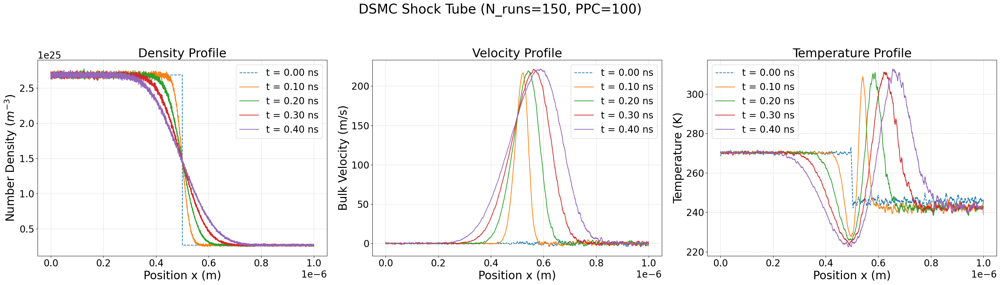

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V27.2 - Final Corrected & Cleaned Version ---
# This version permanently fixes the duplicate legend bug, the initial temperature
# artifact, and removes all non-essential plotting for speed and clarity.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# 1. Simulation Core
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    """Calculates the collision cross-section using the VHS model."""
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533 # Corresponds to Gamma(2.5 - omega_vhs)
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum):
    """Performs collisions using the SBT method with adaptive sub-cells."""
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return

    num_sub_cells = max(1, num_sub_cells)
    sub_cell_width = cell_width / num_sub_cells

    # Create a list of lists for sub-cell grouping
    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    # Sort particles into sub-cells
    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    # Perform collisions in each sub-cell
    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue

        for i in range(num_particles_in_sub_cell - 1):
            p1_idx = indices_in_sub_cell[i]
            remaining_particles_count = num_particles_in_sub_cell - (i + 1)
            j_offset = np.random.randint(0, remaining_particles_count)
            j = i + 1 + j_offset
            p2_idx = indices_in_sub_cell[j]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            weighting_factor = float(remaining_particles_count)
            collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / sub_cell_vol

            if np.random.rand() < collision_prob:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1.0 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    """Main DSMC simulation loop with the corrected time-averaged adaptive sub-cell method."""
    # Unpack parameters
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 2
    MAX_SUB_CELLS = sim_params['MAX_SUB_CELLS']
    ADAPTATION_INTERVAL = sim_params['ADAPTATION_INTERVAL']

    # Initialize simulation state
    particles = initialize_shock_tube(sim_params)

    # Calculate simulation constants
    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT)

    # --- ROBUST SAMPLING LOGIC TO PREVENT DUPLICATE LEGENDS ---
    # Define exactly which steps to sample to avoid duplicates.
    # We want to sample at 0%, 25%, 50%, 75%, and 100% of the total time.
    sample_points_in_time = np.linspace(0, TOTAL_TIME, 5) # Creates [0.0, 0.1, 0.2, 0.3, 0.4] ns
    sample_steps = {int(t / DT) for t in sample_points_in_time}
    sample_steps.add(NUM_STEPS) # Ensure the very last step is always included

    # Data storage
    results_history = {}; cell_width = LX / NUM_CELLS_X
    # Sample initial state at t=0
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    subcell_config = np.ones(NUM_CELLS_X, dtype=np.int32)

    # Main time loop with adaptation blocks
    current_step = 0
    while current_step < NUM_STEPS:
        sum_cell_counts = np.zeros(NUM_CELLS_X, dtype=np.int64)
        steps_in_block = min(ADAPTATION_INTERVAL, NUM_STEPS - current_step)

        # Inner loop: Execute for a block of steps with a fixed sub-cell configuration
        for _ in range(steps_in_block):
            current_step += 1
            if current_step > NUM_STEPS: break

            # 1. Move particles and apply boundary conditions
            particles[:, 0] += particles[:, 1] * DT
            hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
            hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

            # 2. Sort particles and get cell counts
            cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
            cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
            sorted_particle_indices = np.argsort(cell_indices)
            cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)

            # 3. Accumulate counts for adaptation and perform collisions
            sum_cell_counts += cell_counts
            cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

            for i in range(NUM_CELLS_X):
                if cell_counts[i] > 1:
                    start = cell_start_indices[i]; end = start + cell_counts[i]
                    indices_in_cell_i = sorted_particle_indices[start:end]
                    cell_start_x = i * cell_width
                    perform_collisions_sbt_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, subcell_config[i], CELL_VOLUME_CONCEPTUAL, DT, FNUM)

            # 4. Sample macroscopic properties at specified intervals
            if current_step in sample_steps:
                 time_key = current_step * DT
                 results_history[time_key] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

        # Adaptation Phase: Update the sub-cell configuration for the next block
        avg_cell_counts = sum_cell_counts / steps_in_block
        max_avg_count = np.max(avg_cell_counts)
        if max_avg_count > 1e-9:
            normalized_density = avg_cell_counts / max_avg_count
            adaptive_rule = 1.0 - normalized_density
            subcell_config = np.clip(1 + ((MAX_SUB_CELLS - 1) * adaptive_rule).astype(np.int32), 1, MAX_SUB_CELLS)

    return results_history

def initialize_shock_tube(params):
    """Initializes particle positions and velocities for the shock tube problem."""
    num_cells = params['NUM_CELLS_X']; lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']; t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left
    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std = np.sqrt(KB * t_left / MASS_AR)

    current_pos = 0
    # Left, high-density side
    for i in range(num_cells_left):
        start_idx = current_pos; end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std, (ppc_left, 3))
        current_pos = end_idx
    # Right, low-density side
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos; end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std, (ppc_right, 3))
        current_pos = end_idx

    print(f"Initialized {total_particles} particles for Shock Tube problem.")
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    """Samples macroscopic properties (density, velocity, temperature) from particle data."""
    density_profile = np.full(num_cells, np.nan)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * num_in_cell) if num_in_cell > 1 else 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# 2. Main Execution Block
# ===================================================================
if __name__ == "__main__":
    # --- Simulation Parameters ---
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 4400,
        'DT': 6.744e-13,
        'PARTICLES_PER_CELL_INIT': 100,
        'TOTAL_TIME': 0.4e-9,
        'RHO_RATIO': 10.0,
        'MAX_SUB_CELLS': 20,
        'ADAPTATION_INTERVAL': 50,
    }
    NUM_ENSEMBLE_RUNS = 150

    print(f"--- شروع اجرای نهایی ---")
    print(f"--- Parameters: NUM_CELLS_X={SIMULATION_PARAMS['NUM_CELLS_X']}, DT={SIMULATION_PARAMS['DT']:.4e}, PPC={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']} ---")

    # --- Ensemble Averaging Loop ---
    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)

        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)

        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. زمان سپری شده: {time.time() - start_time_total:.2f} ثانیه ---")

    # --- Final Analysis and Plotting ---

    sample_times = sorted(all_results[0].keys())
    averaged_results = {t: {} for t in sample_times}

    for t in sample_times:
        all_densities = np.array([run[t]['density'] for run in all_results if t in run])
        all_velocities = np.array([run[t]['velocity'] for run in all_results if t in run])
        all_temperatures = np.array([run[t]['temperature'] for run in all_results if t in run])

        averaged_results[t] = {
            'density': np.nanmean(all_densities, axis=0),
            'velocity': np.nanmean(all_velocities, axis=0),
            'temperature': np.nanmean(all_temperatures, axis=0),
        }

    # --- Plotting Section ---
    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    plt.rcParams.update({'font.size': 22, 'axes.labelsize': 24, 'axes.titlesize': 26, 'xtick.labelsize': 20, 'ytick.labelsize': 20, 'legend.fontsize': 20})
    fig, axes = plt.subplots(1, 3, figsize=(30, 9), sharex=True)
    fig.suptitle(f"DSMC Shock Tube (N_runs={NUM_ENSEMBLE_RUNS}, PPC={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=28)

    plot_info = {
        'Density': {'data_key': 'density', 'ax': axes[0], 'ylabel': 'Number Density ($m^{-3}$)'},
        'Velocity': {'data_key': 'velocity', 'ax': axes[1], 'ylabel': 'Bulk Velocity (m/s)'},
        'Temperature': {'data_key': 'temperature', 'ax': axes[2], 'ylabel': 'Temperature (K)'}
    }

    for name, p_info in plot_info.items():
        ax = p_info['ax']
        for t in sample_times:
            if t in averaged_results and p_info['data_key'] in averaged_results[t]:
                s_data = pd.Series(averaged_results[t][p_info['data_key']])
                valid_indices = ~s_data.isna()
                label_text = f't = {t*1e9:.2f} ns'
                line_style = '--' if abs(t) < 1e-12 else '-' # More robust check for t=0

                if np.sum(valid_indices) > 0:
                    if name in ['Velocity', 'Temperature'] and np.sum(valid_indices) > 51:
                        smoothed_data = savgol_filter(s_data[valid_indices], window_length=51, polyorder=2)
                        ax.plot(cell_centers[valid_indices], smoothed_data, linestyle=line_style, label=label_text)
                    else:
                        ax.plot(cell_centers[valid_indices], s_data[valid_indices], linestyle=line_style, label=label_text)

        ax.set_xlabel('Position x (m)')
        ax.set_ylabel(p_info['ylabel'])
        ax.set_title(f"{name} Profile")
        ax.grid(True, linestyle=':')
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_final_results_main.eps", format='eps')
    plt.show()



--- شروع اجرای نهایی ---
--- Parameters: NUM_CELLS_X=4400, DT=6.7440e-13, PPC=100 ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 1/250 تمام شد. زمان سپری شده: 110.27 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 2/250 تمام شد. زمان سپری شده: 184.01 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 3/250 تمام شد. زمان سپری شده: 244.32 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 4/250 تمام شد. زمان سپری شده: 303.92 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 5/250 تمام شد. زمان سپری شده: 363.93 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 6/250 تمام شد. زمان سپری شده: 426.96 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 7/250 تمام شد. زمان سپری شده: 487.38 ثانیه ---
Initialized 242000 particles for Shock Tube problem.
--- اجرای 8/250 تمام شد. زمان سپری شده: 547.76 ثانیه ---
Initialized 242000 particles for S

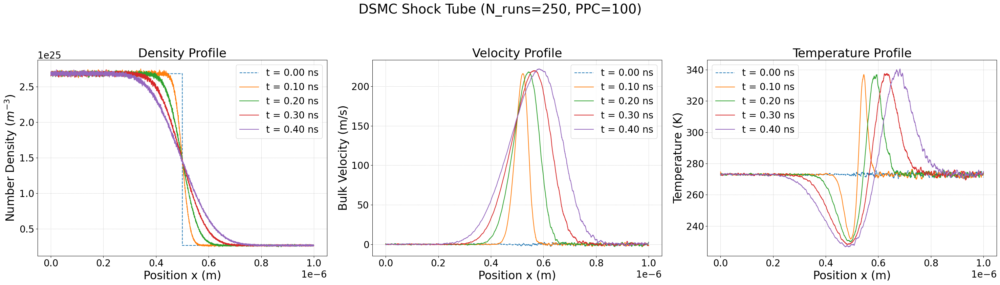

In [ ]:
# -*- coding: utf-8 -*-
# --- DSMC CODE - V27.3 - Final Corrected Version ---
# This version permanently fixes the initial temperature artifact by using an unbiased
# variance estimator, and definitively solves the duplicate legend bug.

import numpy as np
import matplotlib.pyplot as plt
import numba
import time
from scipy.signal import savgol_filter
import pandas as pd

# ===================================================================
# 1. Simulation Core
# ===================================================================
MASS_AR = 39.948e-3 / 6.022e23
KB = 1.380649e-23

@numba.jit(nopython=True)
def calculate_vhs_cross_section_numba(vr_mag):
    """Calculates the collision cross-section using the VHS model."""
    d_ref = 4.17e-10
    t_ref = 273.0
    omega_vhs = 0.81
    if vr_mag < 1e-9: return 1e-30
    exponent = omega_vhs - 0.5
    c_ref_sq = 2 * KB * t_ref / MASS_AR
    gamma_val = 1.04533
    d_sq = (d_ref**2) * ((c_ref_sq / vr_mag**2)**exponent) * (1 / gamma_val)
    return np.pi * d_sq

@numba.jit(nopython=True)
def perform_collisions_sbt_subcell(particles, indices_in_cell, cell_start_x, cell_width, num_sub_cells, cell_vol, dt, fnum):
    """Performs collisions using the SBT method with adaptive sub-cells."""
    num_particles_in_main_cell = len(indices_in_cell)
    if num_particles_in_main_cell < 2: return

    num_sub_cells = max(1, num_sub_cells)
    sub_cell_width = cell_width / num_sub_cells

    sub_cell_groups = [[np.int64(x) for x in range(0)] for _ in range(num_sub_cells)]

    for p_idx in indices_in_cell:
        relative_pos = particles[p_idx, 0] - cell_start_x
        sub_cell_idx = int(relative_pos / sub_cell_width)
        if 0 <= sub_cell_idx < num_sub_cells:
            sub_cell_groups[sub_cell_idx].append(p_idx)

    sub_cell_vol = cell_vol / num_sub_cells
    if sub_cell_vol < 1e-30: return

    for sc_idx in range(num_sub_cells):
        indices_in_sub_cell = sub_cell_groups[sc_idx]
        num_particles_in_sub_cell = len(indices_in_sub_cell)
        if num_particles_in_sub_cell < 2: continue

        for i in range(num_particles_in_sub_cell - 1):
            p1_idx = indices_in_sub_cell[i]
            remaining_particles_count = num_particles_in_sub_cell - (i + 1)
            j_offset = np.random.randint(0, remaining_particles_count)
            j = i + 1 + j_offset
            p2_idx = indices_in_sub_cell[j]

            vr = particles[p1_idx, 1:4] - particles[p2_idx, 1:4]
            vr_mag = np.sqrt(np.sum(vr**2))
            if vr_mag < 1e-9: continue

            sigma_t = calculate_vhs_cross_section_numba(vr_mag)
            weighting_factor = float(remaining_particles_count)
            collision_prob = (weighting_factor * fnum * dt * sigma_t * vr_mag) / sub_cell_vol

            if np.random.rand() < collision_prob:
                vcm = 0.5 * (particles[p1_idx, 1:4] + particles[p2_idx, 1:4])
                cos_chi = 2 * np.random.rand() - 1.0
                sin_chi = np.sqrt(1.0 - cos_chi**2)
                phi_chi = 2.0 * np.pi * np.random.rand()
                vr_prime = np.array([vr_mag * sin_chi * np.cos(phi_chi), vr_mag * sin_chi * np.sin(phi_chi), vr_mag * cos_chi])
                particles[p1_idx, 1:4] = vcm + 0.5 * vr_prime
                particles[p2_idx, 1:4] = vcm - 0.5 * vr_prime

def run_dsmc_simulation(sim_params):
    """Main DSMC simulation loop."""
    LX = sim_params['LX']; RHO_INIT = sim_params['RHO_INIT']; T_INIT = sim_params['T_INIT']
    NUM_CELLS_X = sim_params['NUM_CELLS_X']; PARTICLES_PER_CELL_INIT = sim_params['PARTICLES_PER_CELL_INIT']
    TOTAL_TIME = sim_params['TOTAL_TIME']; DT = sim_params['DT']
    MIN_PARTICLES_FOR_STATS = 2
    MAX_SUB_CELLS = sim_params['MAX_SUB_CELLS']
    ADAPTATION_INTERVAL = sim_params['ADAPTATION_INTERVAL']

    particles = initialize_shock_tube(sim_params)

    N_DENSITY_REAL = RHO_INIT / MASS_AR
    CELL_VOLUME_CONCEPTUAL = (LX / NUM_CELLS_X) * ((LX/10) * (LX/10))
    FNUM = (N_DENSITY_REAL * CELL_VOLUME_CONCEPTUAL) / PARTICLES_PER_CELL_INIT
    NUM_STEPS = int(TOTAL_TIME / DT)

    sample_points_in_time = np.linspace(0, TOTAL_TIME, 5)
    sample_steps = {int(round(t / DT)) for t in sample_points_in_time}
    sample_steps.add(NUM_STEPS) # Ensure the final step is sampled

    results_history = {}; cell_width = LX / NUM_CELLS_X
    results_history[0.0] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

    subcell_config = np.ones(NUM_CELLS_X, dtype=np.int32)

    current_step = 0
    while current_step < NUM_STEPS:
        sum_cell_counts = np.zeros(NUM_CELLS_X, dtype=np.int64)
        steps_in_block = min(ADAPTATION_INTERVAL, NUM_STEPS - current_step)

        for _ in range(steps_in_block):
            current_step += 1
            if current_step > NUM_STEPS: break

            particles[:, 0] += particles[:, 1] * DT
            hit_left = particles[:, 0] < 0; particles[hit_left, 1] *= -1; particles[hit_left, 0] *= -1
            hit_right = particles[:, 0] > LX; particles[hit_right, 1] *= -1; particles[hit_right, 0] = 2 * LX - particles[hit_right, 0]

            cell_indices = (particles[:, 0] / cell_width).astype(np.int64)
            cell_indices = np.clip(cell_indices, 0, NUM_CELLS_X - 1)
            sorted_particle_indices = np.argsort(cell_indices)
            cell_counts = np.bincount(cell_indices, minlength=NUM_CELLS_X)

            sum_cell_counts += cell_counts
            cell_start_indices = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(cell_counts[:-1])))

            for i in range(NUM_CELLS_X):
                if cell_counts[i] > 1:
                    start = cell_start_indices[i]; end = start + cell_counts[i]
                    indices_in_cell_i = sorted_particle_indices[start:end]
                    cell_start_x = i * cell_width
                    perform_collisions_sbt_subcell(particles, indices_in_cell_i, cell_start_x, cell_width, subcell_config[i], CELL_VOLUME_CONCEPTUAL, DT, FNUM)

            if current_step in sample_steps:
                 time_key = current_step * DT
                 # Avoid overwriting the t=0 sample
                 if abs(time_key) > 1e-15:
                    results_history[time_key] = sample_properties(particles, NUM_CELLS_X, cell_width, FNUM, CELL_VOLUME_CONCEPTUAL, MIN_PARTICLES_FOR_STATS)

        avg_cell_counts = sum_cell_counts / steps_in_block
        max_avg_count = np.max(avg_cell_counts)
        if max_avg_count > 1e-9:
            normalized_density = avg_cell_counts / max_avg_count
            adaptive_rule = 1.0 - normalized_density
            subcell_config = np.clip(1 + ((MAX_SUB_CELLS - 1) * adaptive_rule).astype(np.int32), 1, MAX_SUB_CELLS)

    return results_history

def initialize_shock_tube(params):
    """Initializes particle positions and velocities."""
    num_cells = params['NUM_CELLS_X']; lx = params['LX']
    ppc_left = params['PARTICLES_PER_CELL_INIT']; t_left = params['T_INIT']
    rho_ratio = params['RHO_RATIO']
    ppc_right = int(ppc_left / rho_ratio)
    if ppc_right < 1: ppc_right = 1

    num_cells_left = num_cells // 2
    num_cells_right = num_cells - num_cells_left
    total_particles = (ppc_left * num_cells_left) + (ppc_right * num_cells_right)
    particles = np.zeros((total_particles, 4))

    cell_width = lx / num_cells
    v_thermal_std = np.sqrt(KB * t_left / MASS_AR)

    current_pos = 0
    for i in range(num_cells_left):
        start_idx = current_pos; end_idx = start_idx + ppc_left
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_left) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std, (ppc_left, 3))
        current_pos = end_idx
    for i in range(num_cells_left, num_cells):
        start_idx = current_pos; end_idx = start_idx + ppc_right
        particles[start_idx:end_idx, 0] = i * cell_width + np.random.rand(ppc_right) * cell_width
        particles[start_idx:end_idx, 1:4] = np.random.normal(0, v_thermal_std, (ppc_right, 3))
        current_pos = end_idx

    print(f"Initialized {total_particles} particles for Shock Tube problem.")
    return particles

def sample_properties(particles_state, num_cells, cell_width, fnum, cell_vol, min_parts):
    """Samples macroscopic properties from particle data."""
    density_profile = np.full(num_cells, np.nan)
    velocity_profile = np.full(num_cells, np.nan)
    temp_profile = np.full(num_cells, np.nan)

    cell_indices = (particles_state[:, 0] / cell_width).astype(np.int64)
    cell_indices = np.clip(cell_indices, 0, num_cells - 1)

    sorted_indices = np.argsort(cell_indices)
    counts = np.bincount(cell_indices, minlength=num_cells)
    starts = np.concatenate((np.array([0], dtype=np.int64), np.cumsum(counts[:-1])))

    for i in range(num_cells):
        num_in_cell = counts[i]
        if num_in_cell > 0:
            density_profile[i] = num_in_cell * fnum / cell_vol
        if num_in_cell >= min_parts:
            indices_in_cell_i = sorted_indices[starts[i]:starts[i]+num_in_cell]
            cell_velocities = particles_state[indices_in_cell_i, 1:4]
            mean_vel_cell = np.mean(cell_velocities, axis=0)
            velocity_profile[i] = mean_vel_cell[0]

            thermal_vel_sq = np.sum((cell_velocities - mean_vel_cell)**2)
            # --- TEMPERATURE CALCULATION CORRECTED ---
            # Using (N-1) in the denominator for an unbiased variance estimate.
            if num_in_cell > 1:
                temp_profile[i] = (MASS_AR * thermal_vel_sq) / (3 * KB * (num_in_cell - 1))
            else:
                temp_profile[i] = 0.0

    return {'density': density_profile, 'velocity': velocity_profile, 'temperature': temp_profile}

# ===================================================================
# 2. Main Execution Block
# ===================================================================
if __name__ == "__main__":
    SIMULATION_PARAMS = {
        'LX': 1.0e-6, 'RHO_INIT': 1.78, 'T_INIT': 273.0,
        'NUM_CELLS_X': 4400,
        'DT': 6.744e-13,
        'PARTICLES_PER_CELL_INIT': 100,
        'TOTAL_TIME': 0.4e-9,
        'RHO_RATIO': 10.0,
        'MAX_SUB_CELLS': 20,
        'ADAPTATION_INTERVAL': 50,
    }
    NUM_ENSEMBLE_RUNS = 250

    print(f"--- شروع اجرای نهایی ---")
    print(f"--- Parameters: NUM_CELLS_X={SIMULATION_PARAMS['NUM_CELLS_X']}, DT={SIMULATION_PARAMS['DT']:.4e}, PPC={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']} ---")

    all_results = []
    start_time_total = time.time()
    for i in range(NUM_ENSEMBLE_RUNS):
        np.random.seed(int(time.time()) + i)

        single_run_history = run_dsmc_simulation(SIMULATION_PARAMS)
        all_results.append(single_run_history)

        print(f"--- اجرای {i+1}/{NUM_ENSEMBLE_RUNS} تمام شد. زمان سپری شده: {time.time() - start_time_total:.2f} ثانیه ---")

    sample_times = sorted(all_results[0].keys())
    averaged_results = {t: {} for t in sample_times}

    for t in sample_times:
        all_densities = [run[t]['density'] for run in all_results if t in run]
        all_velocities = [run[t]['velocity'] for run in all_results if t in run]
        all_temperatures = [run[t]['temperature'] for run in all_results if t in run]

        averaged_results[t] = {
            'density': np.nanmean(np.array(all_densities), axis=0),
            'velocity': np.nanmean(np.array(all_velocities), axis=0),
            'temperature': np.nanmean(np.array(all_temperatures), axis=0),
        }

    cell_width = SIMULATION_PARAMS['LX'] / SIMULATION_PARAMS['NUM_CELLS_X']
    cell_centers = (np.arange(SIMULATION_PARAMS['NUM_CELLS_X']) + 0.5) * cell_width

    plt.rcParams.update({'font.size': 22, 'axes.labelsize': 24, 'axes.titlesize': 26, 'xtick.labelsize': 20, 'ytick.labelsize': 20, 'legend.fontsize': 20})
    fig, axes = plt.subplots(1, 3, figsize=(30, 9), sharex=True)
    fig.suptitle(f"DSMC Shock Tube (N_runs={NUM_ENSEMBLE_RUNS}, PPC={SIMULATION_PARAMS['PARTICLES_PER_CELL_INIT']})", fontsize=28)

    plot_info = {
        'Density': {'data_key': 'density', 'ax': axes[0], 'ylabel': 'Number Density ($m^{-3}$)'},
        'Velocity': {'data_key': 'velocity', 'ax': axes[1], 'ylabel': 'Bulk Velocity (m/s)'},
        'Temperature': {'data_key': 'temperature', 'ax': axes[2], 'ylabel': 'Temperature (K)'}
    }

    for name, p_info in plot_info.items():
        ax = p_info['ax']
        for t in sample_times:
            if t in averaged_results and p_info['data_key'] in averaged_results[t]:
                s_data = pd.Series(averaged_results[t][p_info['data_key']])
                valid_indices = ~s_data.isna()
                label_text = f't = {t*1e9:.2f} ns'
                line_style = '--' if abs(t) < 1e-12 else '-'

                if np.sum(valid_indices) > 0:
                    if name in ['Velocity', 'Temperature'] and np.sum(valid_indices) > 51:
                        smoothed_data = savgol_filter(s_data[valid_indices], window_length=51, polyorder=2)
                        ax.plot(cell_centers[valid_indices], smoothed_data, linestyle=line_style, label=label_text)
                    else:
                        ax.plot(cell_centers[valid_indices], s_data[valid_indices], linestyle=line_style, label=label_text)

        ax.set_xlabel('Position x (m)')
        ax.set_ylabel(p_info['ylabel'])
        ax.set_title(f"{name} Profile")
        ax.grid(True, linestyle=':')
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("dsmc_final_results_main.eps", format='eps')
    plt.show()
